In [1]:
import matplotlib.pyplot as plt
import matplotlib as mpl

import numpy as np
import pandas as pd
import glob

from matplotlib.colors import LogNorm
import matplotlib.colors as colors
from matplotlib.patches import Ellipse,Circle
from scipy.ndimage import gaussian_filter

from galaxy_tools import load_halo, load_sim, mask_sim_to_halo, get_mock_observation
from general_tools import measure_surfbright, radius_of_param_limit, center_mass,mag_to_lum_SB
from sersic_tools import fit_sersic, sersic

%matplotlib inline
pd.set_option('display.max_columns', None)

mpl.rc('xtick', labelsize=12) 
mpl.rc('ytick', labelsize=12) 

plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 14

plt.rcParams['font.size'] = 12

palettable colormaps are not installed
don't have phil's colormaps


# File Notes

Goal is to look at the differences between mock light and mass images \
Differences in distribution, centers, etc.

This is made with paths used on my local

In [2]:
# Path to mock images
path_mass_mocks = '/Users/courtneyklein/Research/mass_mock_images/mass_mock_10rvir/*.npy'

mass_mocks = glob.glob(path_mass_mocks)
mass_mocks.sort()


path_lum_mocks = '/Users/courtneyklein/Research/mass_mock_images/mock_image_halo_centered/*.npy'

lum_mocks = glob.glob(path_lum_mocks)
lum_mocks.sort()

#Take only band images 'ugrband' and not mock files 'mockimg'
band_mocks = []

for file in lum_mocks:
    image_file = file.split("/")[-1]
    image_params = image_file.split('_')
    image_type = image_params[2]
    if image_type == 'ugrband':
        band_mocks.append(file)


In [ ]:
/Users/courtneyklein/Research/mass_mock_images/mock_image_halo_centered/m10b_res500_mockimg_xy_FOV6_halocenternosblims.npy

In [73]:
test = np.load(file)
np.shape(test[1])

(1000, 1000)

In [7]:
band_mocks

['/Users/courtneyklein/Research/mass_mock_images/mock_image_halo_centered/m10b_res500_ugrband_xy_FOV6_halocenternosblims.npy',
 '/Users/courtneyklein/Research/mass_mock_images/mock_image_halo_centered/m10b_res500_ugrband_yz_FOV6_halocenternosblims.npy',
 '/Users/courtneyklein/Research/mass_mock_images/mock_image_halo_centered/m10b_res500_ugrband_zx_FOV6_halocenternosblims.npy',
 '/Users/courtneyklein/Research/mass_mock_images/mock_image_halo_centered/m10c_res500_ugrband_xy_FOV6_halocenternosblims.npy',
 '/Users/courtneyklein/Research/mass_mock_images/mock_image_halo_centered/m10c_res500_ugrband_yz_FOV6_halocenternosblims.npy',
 '/Users/courtneyklein/Research/mass_mock_images/mock_image_halo_centered/m10c_res500_ugrband_zx_FOV6_halocenternosblims.npy',
 '/Users/courtneyklein/Research/mass_mock_images/mock_image_halo_centered/m10d_res500_ugrband_xy_FOV6_halocenternosblims.npy',
 '/Users/courtneyklein/Research/mass_mock_images/mock_image_halo_centered/m10d_res500_ugrband_yz_FOV6_halocente

In [3]:
#load sim measurements
data = pd.read_csv('/Users/courtneyklein/Research/DwarfGalaxy_MassRadius/data/fulldata_allparams.csv')


In [6]:
simList = ['m10b_res500','m10c_res500', 'm10d_res500', 'm10e_res500', 
           'm10f_res500','m10g_res500', 'm10h_res500', 'm10i_res500',
           'm10j_res500','m10k_res500', 'm10l_res500','m10m_res500', 
           'm11a_res2100','m11b_res2100','m11c_res2100', 'm11d_res7100',
           'm11e_res7100', 'm11h_res7100', 'm11i_res7100', 'm11q_res7100' ]



In [83]:
image_limit = [ 350,350,300,250,
              0,0,0,0,
              0,0,0,0,
              0,0,0,0,
              0,0,0,0]

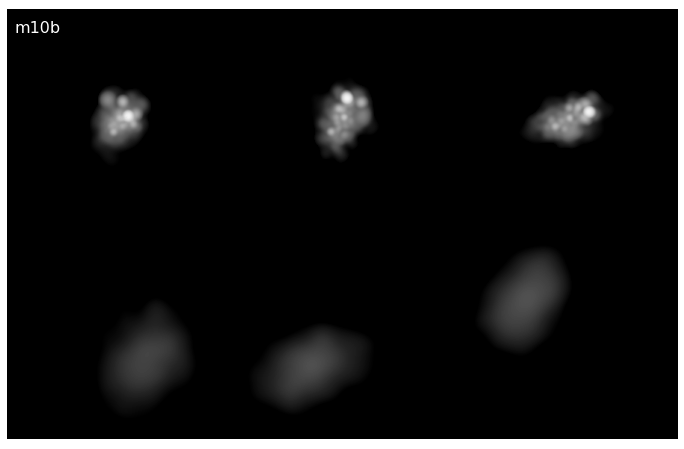

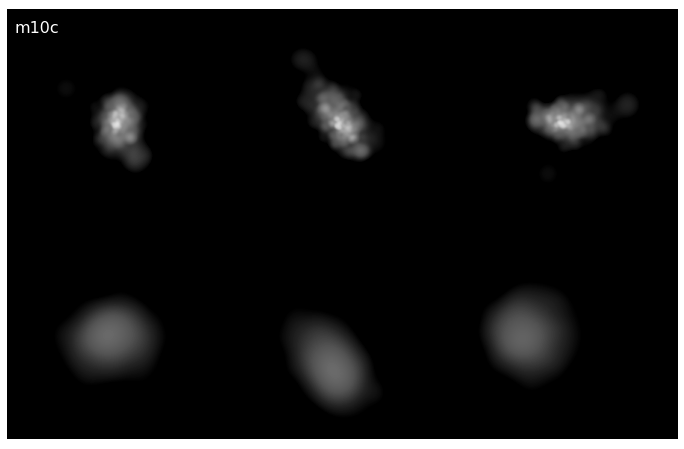

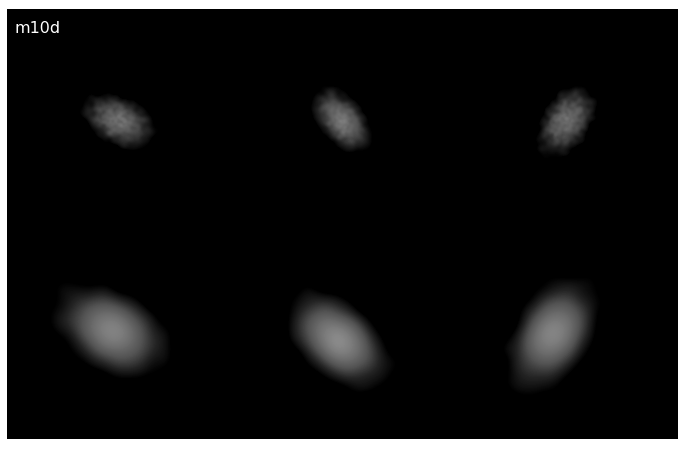

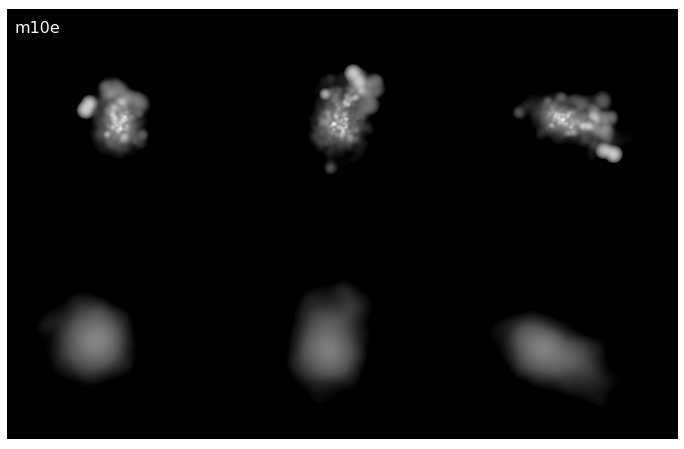

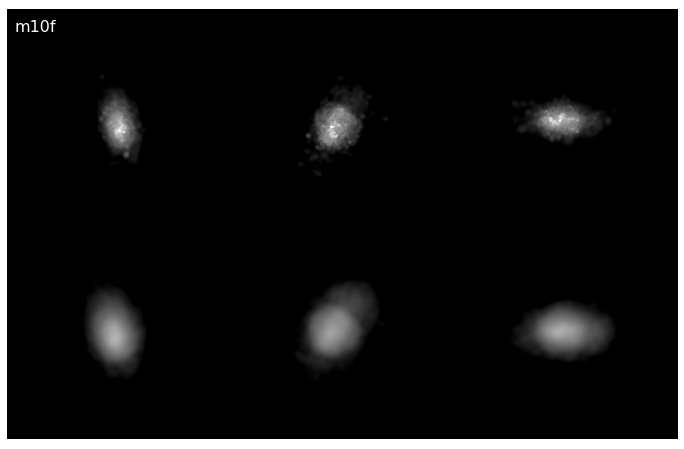

...

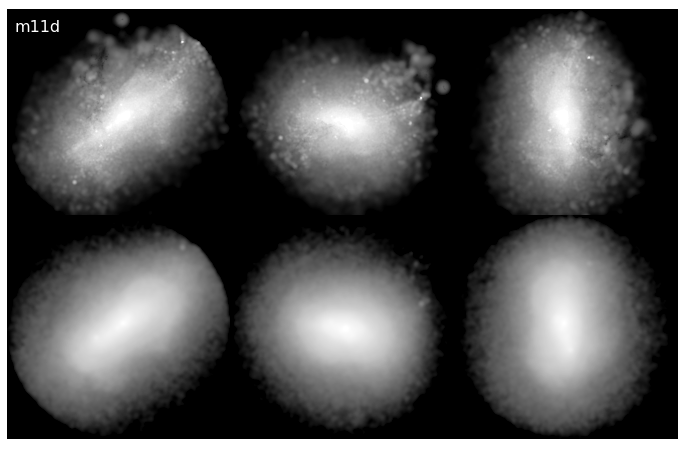

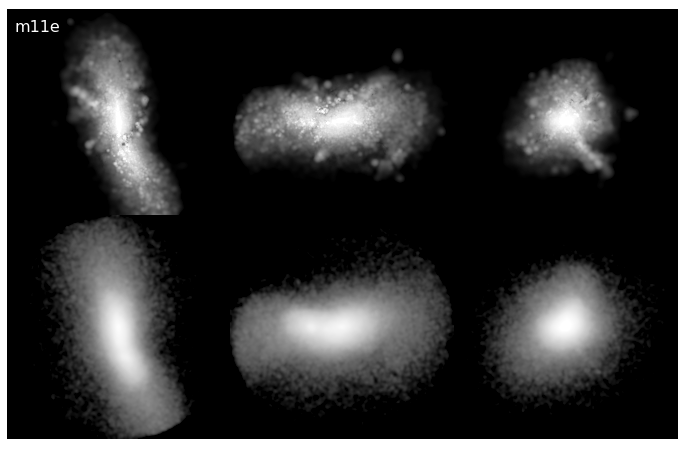

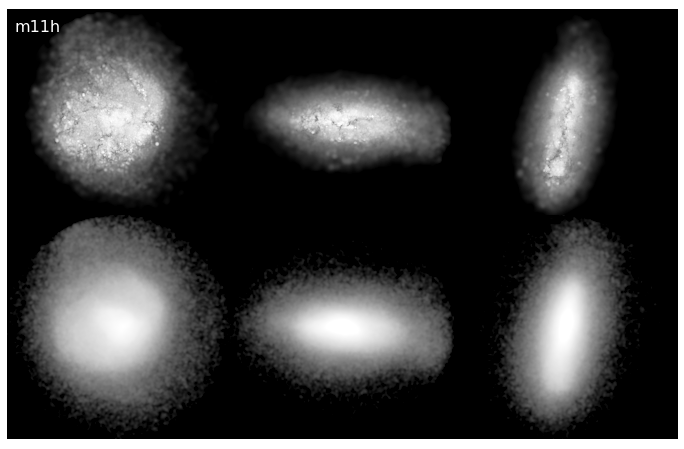

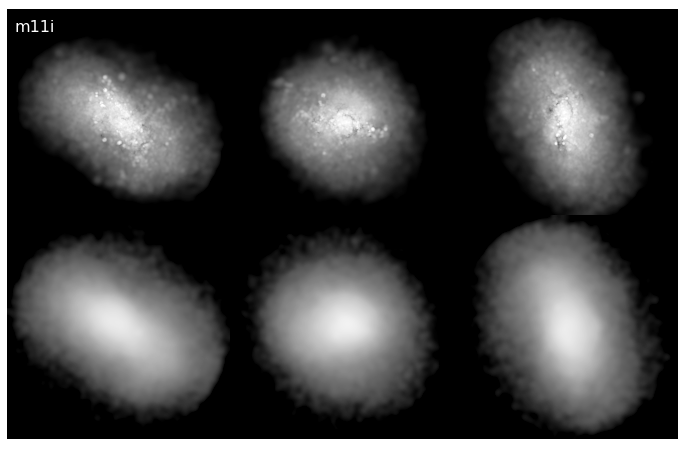

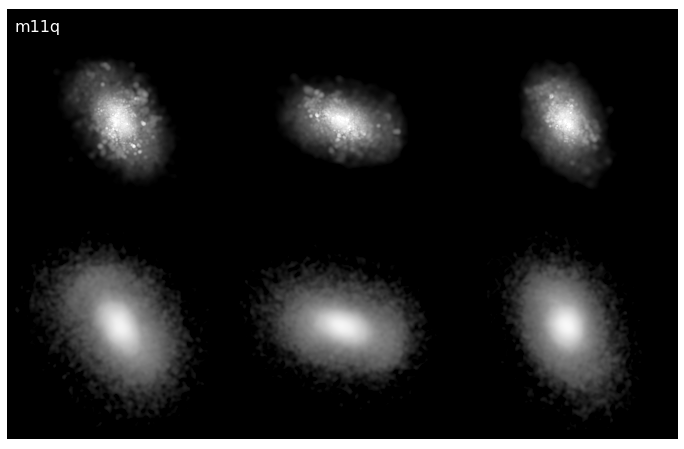

In [97]:
for i in range(len(simList)):
    
    sim = simList[i]
    lim = image_limit[i]
    fig, axs = plt.subplots(2,3,figsize=(12, 8))
    plt.subplots_adjust(wspace=0.1, hspace=0)
    
    
    view = 'xy'
    mass_dir = '/Users/courtneyklein/Research/mass_mock_images/mass_mock_10rvir/'
    mass_file = sim + '_massmock_' + view + '*.npy'
    mass_path = glob.glob(mass_dir + mass_file)[0]
    mass_image_xy = np.load(mass_path)
    mass_image_xy = mass_image_xy[lim:1000-lim,lim:1000-lim]
    
    
    lum_dir = '/Users/courtneyklein/Research/mass_mock_images/mock_image_halo_centered/'
    lum_file = sim + '_ugrband_' + view + '*.npy'
    lum_path = glob.glob(lum_dir + lum_file)[0]
    band_image_xy = np.load(lum_path)[1]
    band_image_xy = band_image_xy[lim:1000-lim,lim:1000-lim]

    
    view = 'yz'
    mass_file = sim + '_massmock_' + view + '*.npy'
    mass_path = glob.glob(mass_dir + mass_file)[0]
    mass_image_yz = np.load(mass_path)
    mass_image_yz = mass_image_yz[lim:1000-lim,lim:1000-lim]

    lum_file = sim + '_ugrband_' + view + '*.npy'
    lum_path = glob.glob(lum_dir + lum_file)[0]
    band_image_yz = np.load(lum_path)[1]
    band_image_yz = band_image_yz[lim:1000-lim,lim:1000-lim]

    view = 'zx'
    mass_file = sim + '_massmock_' + view + '*.npy'
    mass_path = glob.glob(mass_dir + mass_file)[0]
    mass_image_zx = np.load(mass_path)
    mass_image_zx = mass_image_zx[lim:1000-lim,lim:1000-lim]


    lum_file = sim + '_ugrband_' + view + '*.npy'
    lum_path = glob.glob(lum_dir + lum_file)[0]
    band_image_zx = np.load(lum_path)[1]
    band_image_zx = band_image_zx[lim:1000-lim,lim:1000-lim]    
    
      #...........Mass Image...........
    plt.subplots_adjust(wspace=0, hspace=-0.1)
    
    
    lim_value = 57650
    band_image_xy[band_image_xy<lim_value] = 1
    Mass_image = axs[0,0].imshow(band_image_xy, norm=colors.LogNorm(vmin=lim_value, vmax=1e8),cmap='Greys_r') #57650
    
    band_image_yz[band_image_yz<lim_value] = 1
    Mass_image = axs[0,1].imshow(band_image_yz, norm=colors.LogNorm(vmin=lim_value, vmax=1e8),cmap='Greys_r') #57650
    
    band_image_zx[band_image_zx<lim_value] = 1
    Mass_image = axs[0,2].imshow(band_image_zx, norm=colors.LogNorm(vmin=lim_value, vmax=1e8),cmap='Greys_r') #57650
    
    
    mass_image_xy[mass_image_xy<lim_value] = 1
    Mass_image = axs[1,0].imshow(mass_image_xy, norm=colors.LogNorm(vmin=lim_value, vmax=1e8),cmap='Greys_r') #57650
    
    mass_image_yz[mass_image_yz<lim_value] = 1
    Mass_image = axs[1,1].imshow(mass_image_yz, norm=colors.LogNorm(vmin=lim_value, vmax=1e8),cmap='Greys_r') #57650
    
    mass_image_zx[mass_image_zx<lim_value] = 1
    Mass_image = axs[1,2].imshow(mass_image_zx, norm=colors.LogNorm(vmin=lim_value, vmax=1e8),cmap='Greys_r') #57650
    
    axs[0,0].text(30 *(500 - lim)/500, 100 *  (500 - lim)/500, sim[:4],color='white', fontsize=16)

    
    axs[0,0].axis('off')
    axs[0,0].axis('equal')
    axs[0,1].axis('off')
    axs[0,1].axis('equal')
    axs[0,2].axis('off')
    axs[0,2].axis('equal')
    axs[1,0].axis('off')
    axs[1,0].axis('equal')
    axs[1,1].axis('off')
    axs[1,1].axis('equal')
    axs[1,2].axis('off')
    axs[1,2].axis('equal')
    


In [ ]:
# go through mass files

for file_index in range(len(mass_mocks)):
    # mass image
    print(file_index, )
    mass_file = mass_mocks[file_index].split("/")[-1]
    mass_params = mass_file.split('_')
    sim = mass_params[0]+'_'+mass_params[1]
    view = mass_params[3]
    FOV = int(mass_params[4][3:])
    sml = int(mass_params[6][:-4])
    pixel = 1000
    print(file_index, sim, view)

    # band image
    band_file = band_mocks[file_index].split("/")[-1]
    band_params = band_file.split('_')
    band_sim = band_params[0]+'_'+band_params[1]
    band_view = band_params[3]

    #Check we are looking at the same images
    if (sim != band_sim) or (view != band_view):
        print('Not a matched file')
        print(sim,band_sim)
        print(view,band_view)
        print(mass_file)
        print(band_file)
    
    
    cm_data_i = cm_data.loc[(cm_data['sim'] == sim) & (cm_data['proj'] == view)]

    
    band_image = np.load(band_mocks[file_index])[1]
    mass_image = np.load(mass_mocks[file_index])
    
    
    kpctopix = pixel / (FOV*2)
    pixtokpc = kpctopix**-1
    
    
    fig, axs = plt.subplots(1,3,figsize=(14, 5))
    plt.subplots_adjust(wspace=0.1, hspace=0)

    #...........Mass Image...........
    plt.subplots_adjust(wspace=0.1, hspace=0)
    lim_value = 57650

    mass_image[mass_image<lim_value] = 1
    Mass_image = axs[0].imshow(mass_image, norm=colors.LogNorm(vmin=lim_value, vmax=1e8),cmap='Greys_r') #57650
    
    cb = fig.colorbar(Mass_image, ax=axs[0],  orientation="horizontal", pad=0.05)
    cb.set_label(r'M$_{\odot}$ kpc$^{-2}$')
    
    
    #Create scale bar
    scale_kpc = FOV / 4
    scale_kpc = int(np.ceil(scale_kpc))
    pixel_bar = scale_kpc * 500 / FOV
    pixel_bar = int(np.ceil(pixel_bar))

    #add scale bar
    axs[0].plot([50,50 + pixel_bar],[950,950],  c='w', linewidth='5')
    
    axs[0].scatter(500,500,color='red', label='halo')
    axs[0].scatter(500 + cm_data_i['cm_stellarmass_x']*kpctopix,
                   500 +cm_data_i['cm_stellarmass_y']*kpctopix, color='green',label='mass')
    axs[0].scatter(500 +cm_data_i['cm_luminosity_x']*kpctopix,
                   500 +cm_data_i['cm_luminosity_y']*kpctopix, color='yellow',label='light')
    axs[0].legend(prop={'size':10})
    axs[0].text(50, 920, f'{scale_kpc:.0f} kpc',color='w', fontsize=16)
    axs[0].axis('equal')
    axs[0].axis('off')
    
    #...........Band Image...........
    plt.subplots_adjust(wspace=0.1, hspace=0)
    
    band_image[band_image<lim_value] = 1
    band_image_smoothed = gaussian_filter(band_image, sigma = sml )

    Band_image = axs[1].imshow(band_image_smoothed ,norm=colors.LogNorm(vmin=lim_value, vmax=1e8),
                          cmap='Greys_r')
    
    cb = fig.colorbar(Band_image, ax=axs[1],  orientation="horizontal", pad=0.05)
    cb.set_label(r'L$_{\odot}$ kpc$^{-2}$')

    #add scale bar 
    axs[1].scatter(500,500,color='red', label='halo')
    axs[1].scatter(500 + cm_data_i['cm_stellarmass_x']*kpctopix,
                   500 +cm_data_i['cm_stellarmass_y']*kpctopix, color='green',label='mass')
    axs[1].scatter(500 +cm_data_i['cm_luminosity_x']*kpctopix,
                   500 +cm_data_i['cm_luminosity_y']*kpctopix, color='yellow',label='light')
    axs[1].plot([50,50 + pixel_bar],[950,950],  c='w', linewidth='5')
    axs[1].text(50, 920, f'{scale_kpc:.0f} kpc',color='w', fontsize=16)
    axs[1].axis('equal')
    axs[1].axis('off')  
    
    # ...........M/L Image............
    #-----Mass-to-Light-Ratio------
    plt.subplots_adjust(wspace=0.1, hspace=0)

    band_image_smoothed[band_image_smoothed<lim_value] = 0
    mass_image[mass_image<lim_value] = -1

    Mass_to_Light_ratio = (mass_image/band_image_smoothed)
    MLR = axs[2].imshow(Mass_to_Light_ratio, cmap='cividis_r')#,norm=colors.Normalize(vmin=.01, vmax=3))

    
    cb = fig.colorbar(MLR, ax=axs[2], orientation="horizontal", pad=0.05)
    cb.set_label(r'M$_{\odot}$ / L$_{\odot}$')

    
    #-----Labels M/L------
    axs[2].plot([50,50 + pixel_bar],[950,950],  c='k', linewidth='5')
    axs[2].text(50, 920, f'{scale_kpc:.0f} kpc',color='k', fontsize=16)
    axs[2].axis('equal')
    axs[2].axis('off')

    plt.show()
    

0
0 m10b_res500 xy


/var/folders/bm/n50953kd0yj8vwl7qjb3thz80000gn/T/ipykernel_1084/3337048360.py:104: RuntimeWarning: divide by zero encountered in true_divide
  Mass_to_Light_ratio = (mass_image/band_image_smoothed)


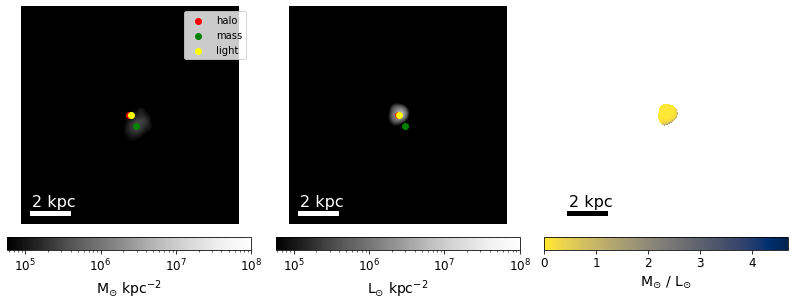

1
1 m10b_res500 yz


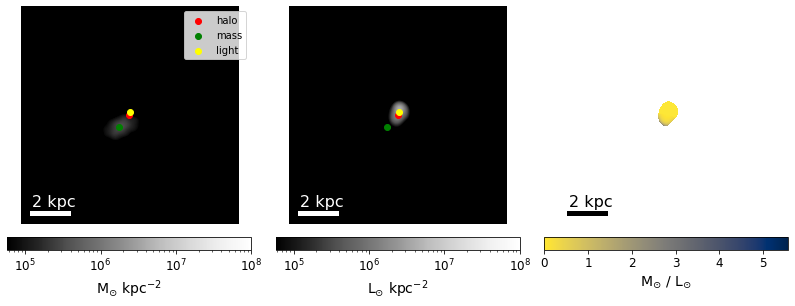

2
2 m10b_res500 zx


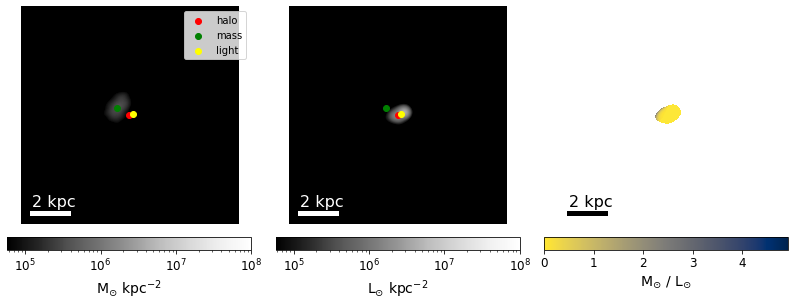

3
3 m10c_res500 xy


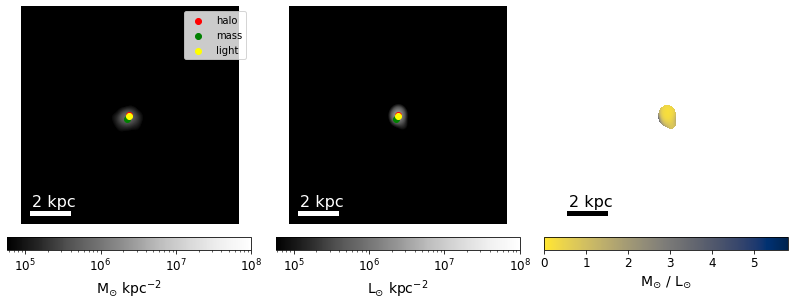

4
4 m10c_res500 yz


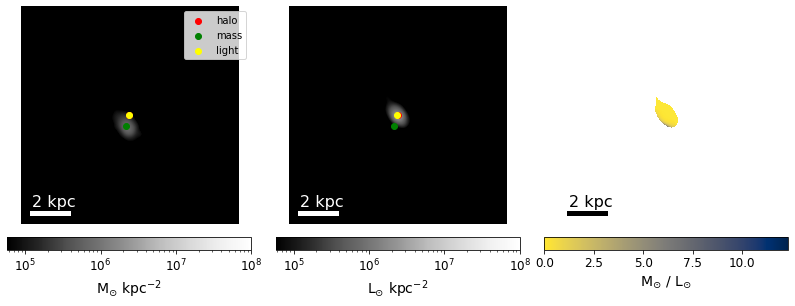

5
5 m10c_res500 zx


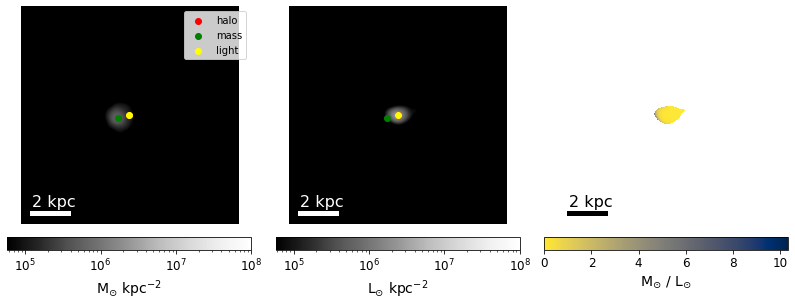

6
6 m10d_res500 xy


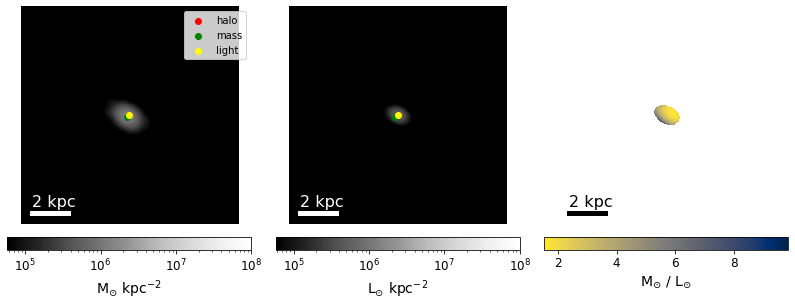

7
7 m10d_res500 yz


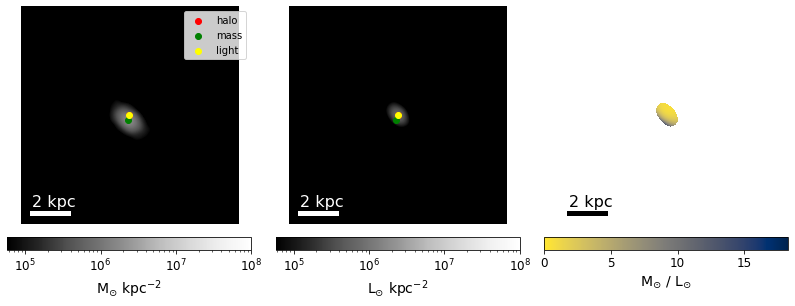

8
8 m10d_res500 zx


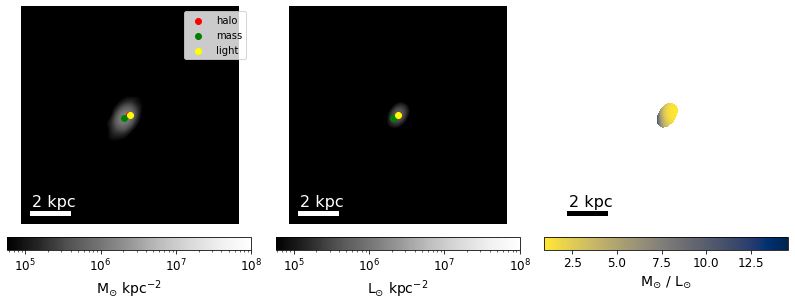

9
9 m10e_res500 xy


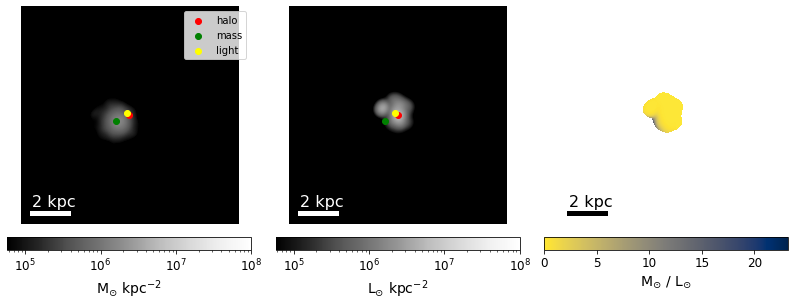

10
10 m10e_res500 yz


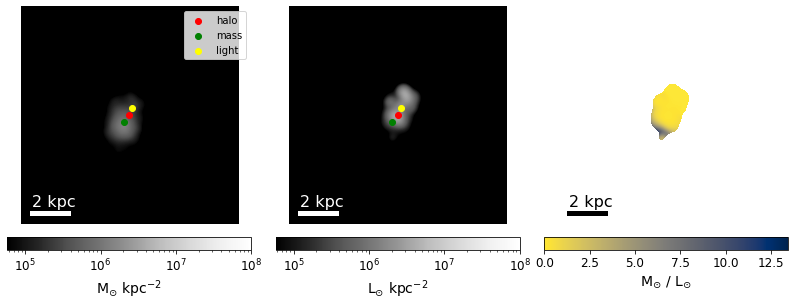

11
11 m10e_res500 zx


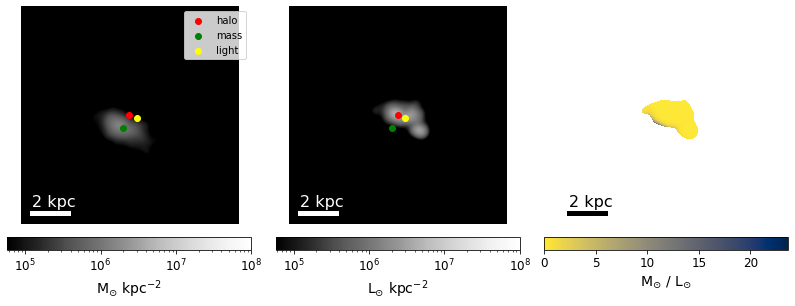

12
12 m10f_res500 xy


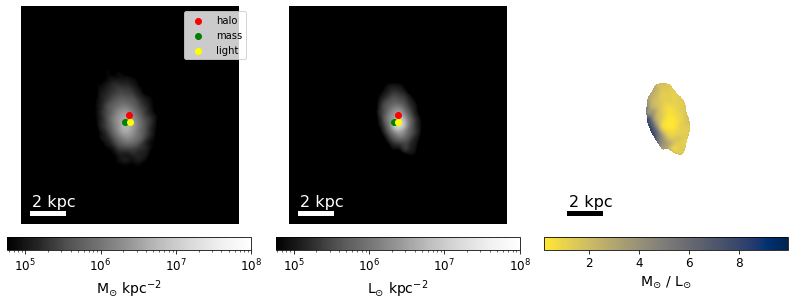

13
13 m10f_res500 yz


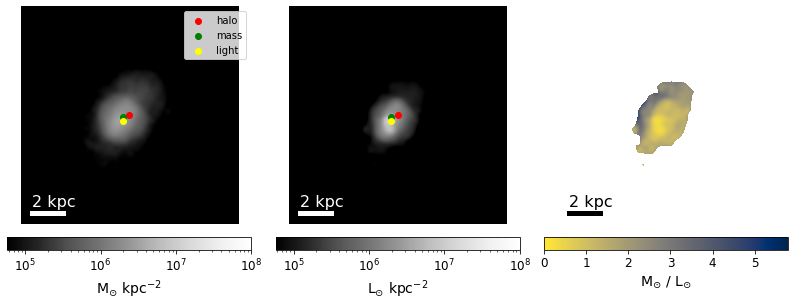

14
14 m10f_res500 zx


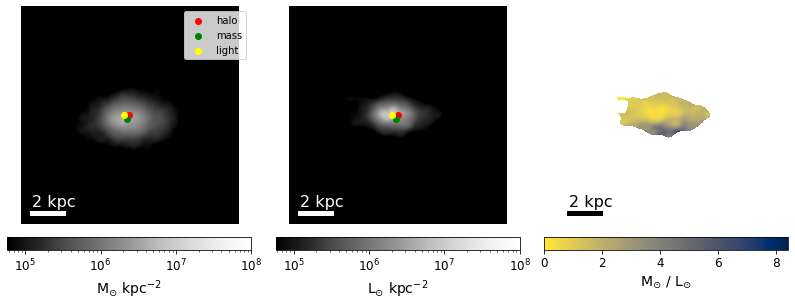

15
15 m10g_res500 xy


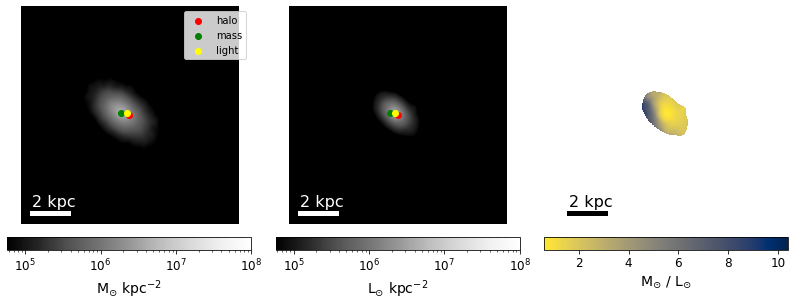

16
16 m10g_res500 yz


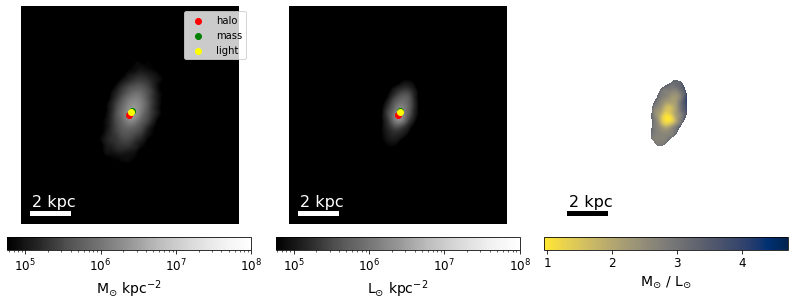

17
17 m10g_res500 zx


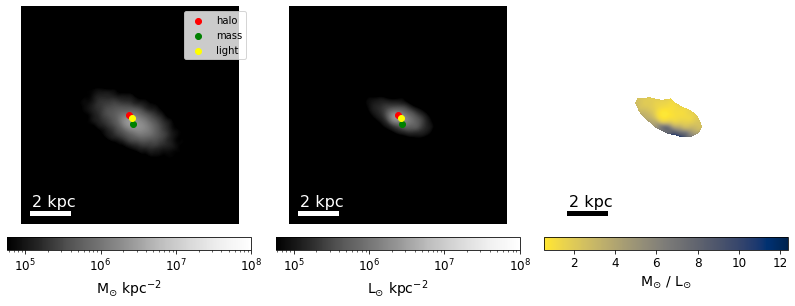

18
18 m10h_res500 xy


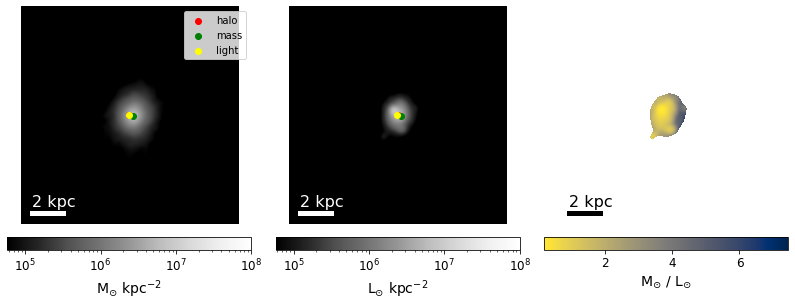

19
19 m10h_res500 yz


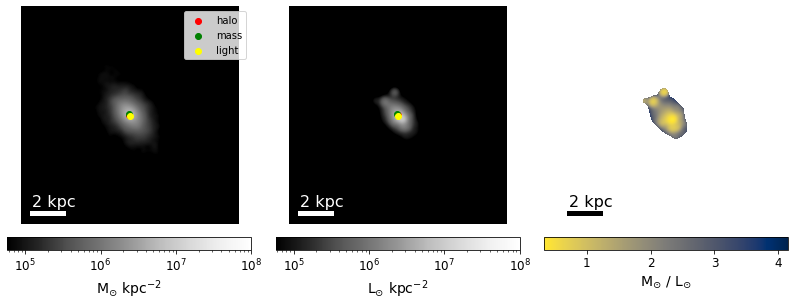

20
20 m10h_res500 zx


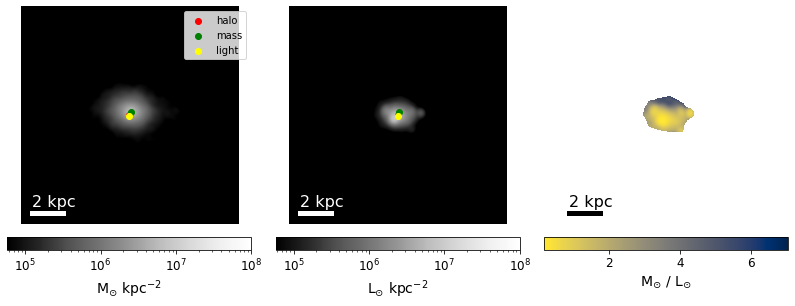

21
21 m10i_res500 xy


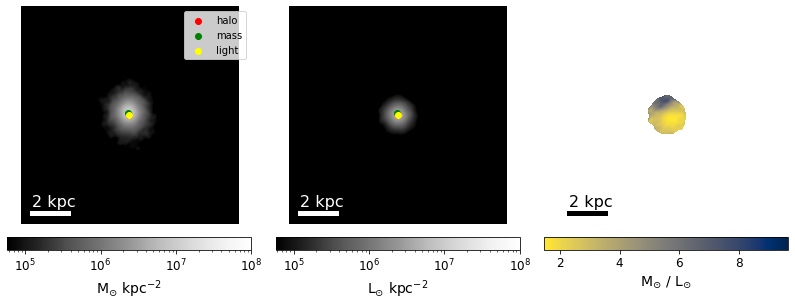

22
22 m10i_res500 yz


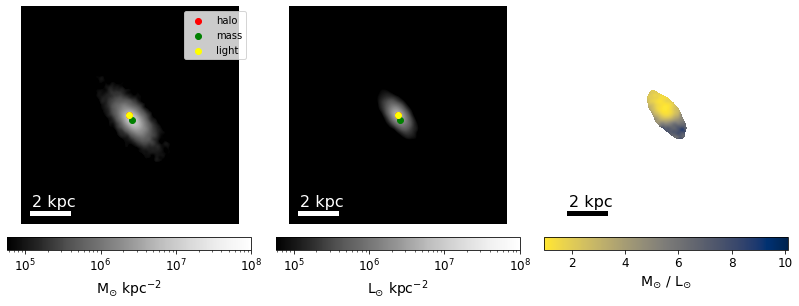

23
23 m10i_res500 zx


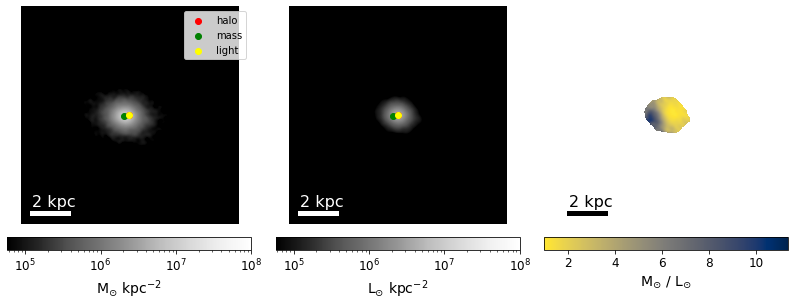

24
24 m10j_res500 xy


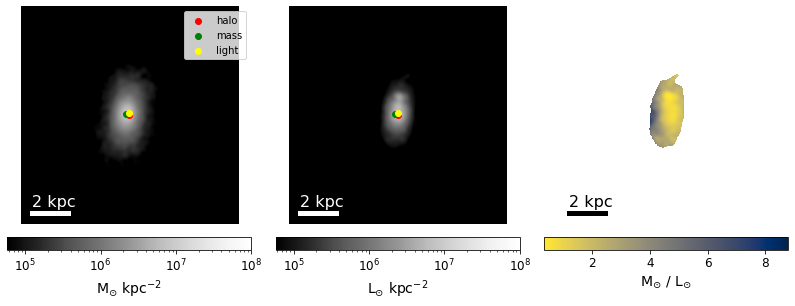

25
25 m10j_res500 yz


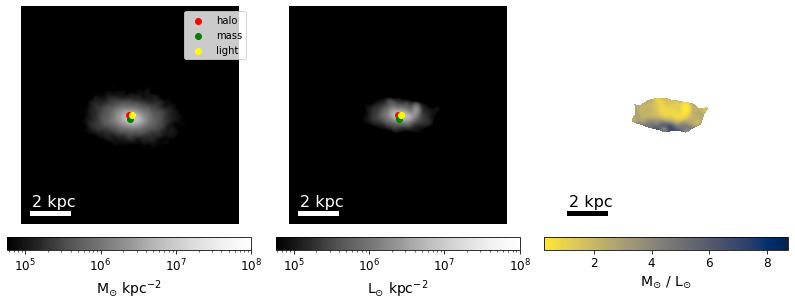

26
26 m10j_res500 zx


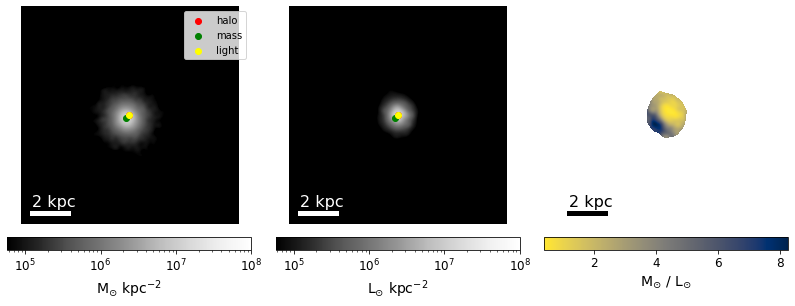

27
27 m10k_res500 xy


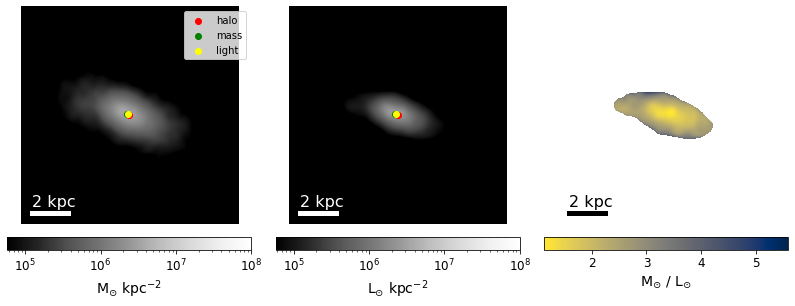

28
28 m10k_res500 yz


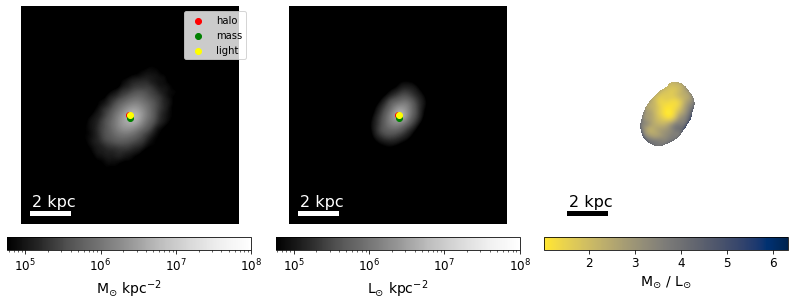

29
29 m10k_res500 zx


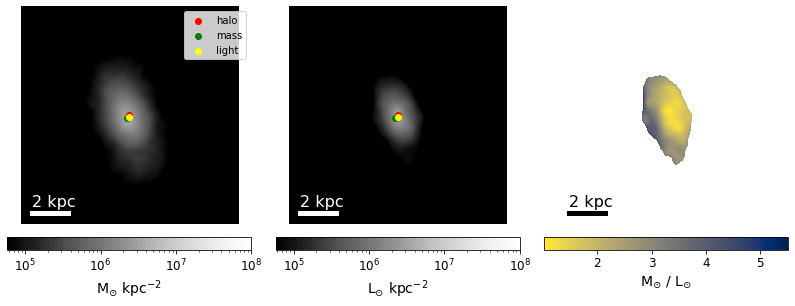

30
30 m10l_res500 xy


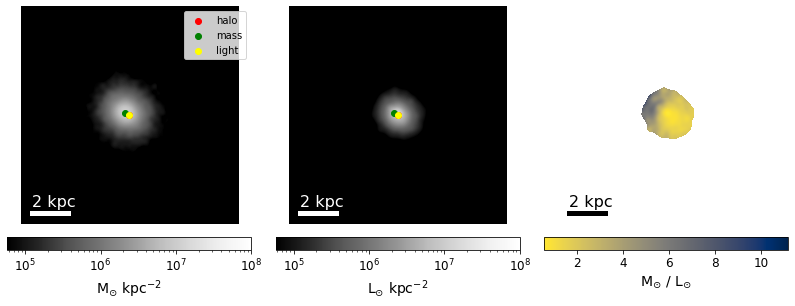

31
31 m10l_res500 yz


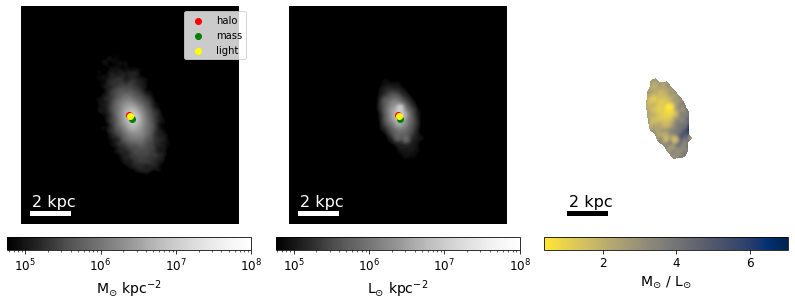

32
32 m10l_res500 zx


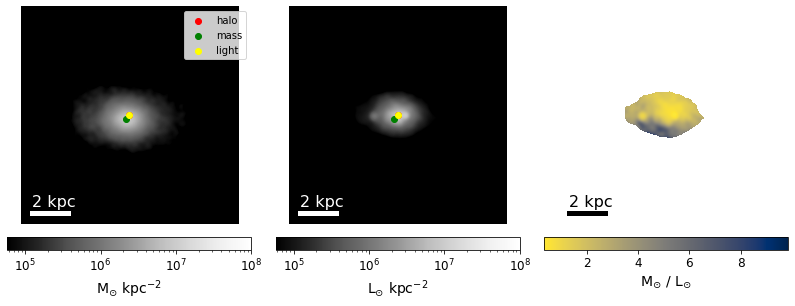

33
33 m10m_res500 xy


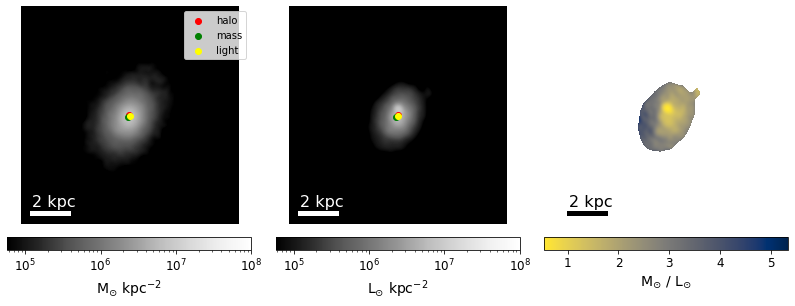

34
34 m10m_res500 yz


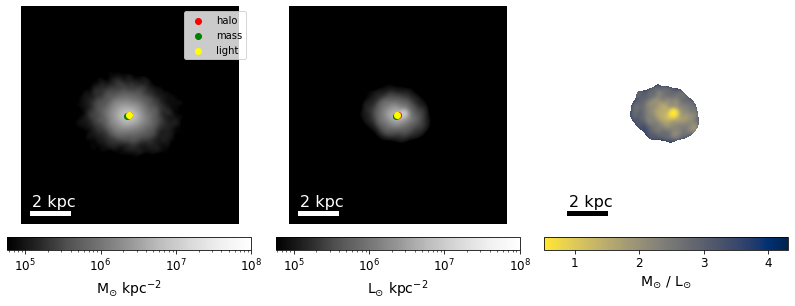

35
35 m10m_res500 zx


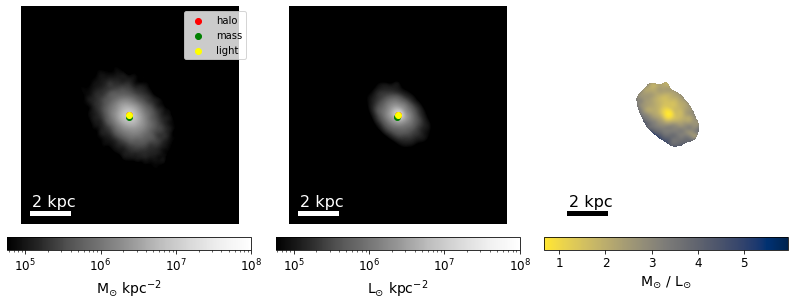

36
36 m11a_res2100 xy


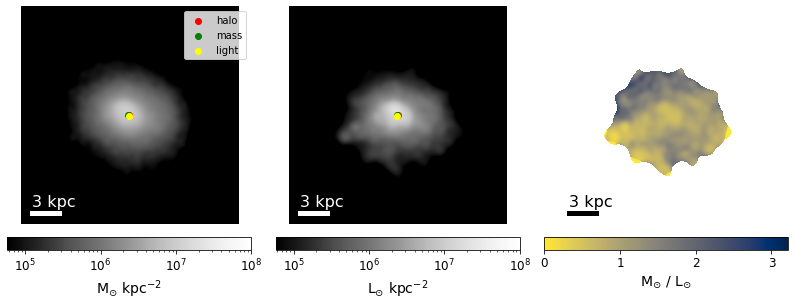

37
37 m11a_res2100 yz


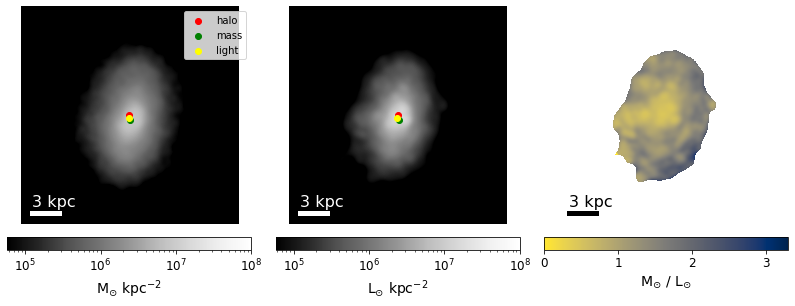

38
38 m11a_res2100 zx


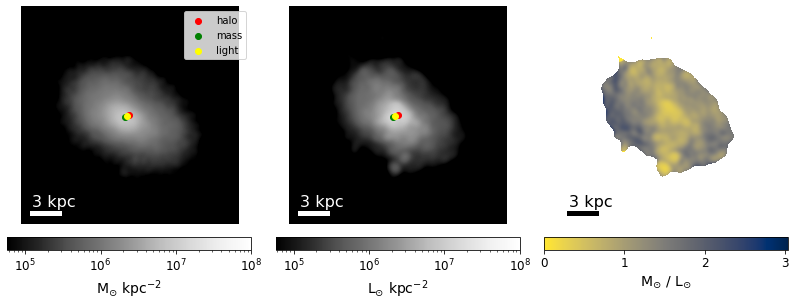

39
39 m11b_res2100 xy


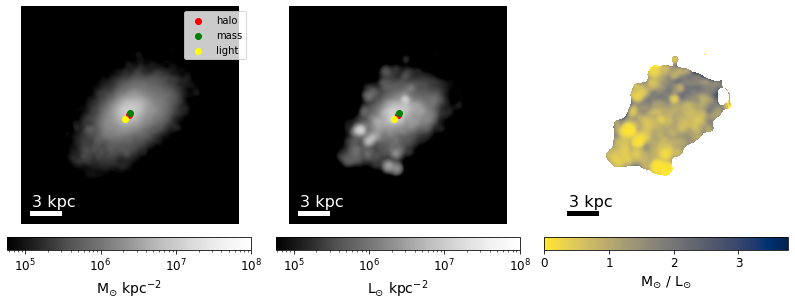

40
40 m11b_res2100 yz


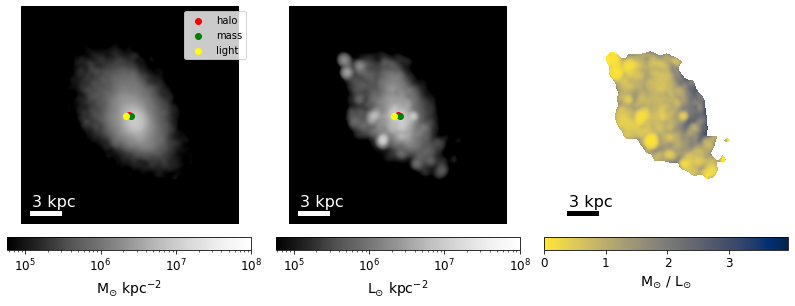

41
41 m11b_res2100 zx


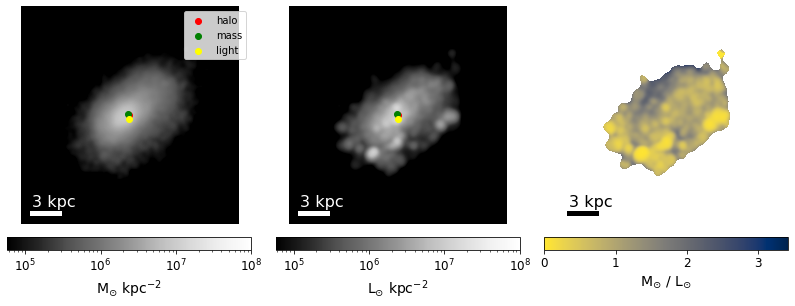

42
42 m11c_res2100 xy


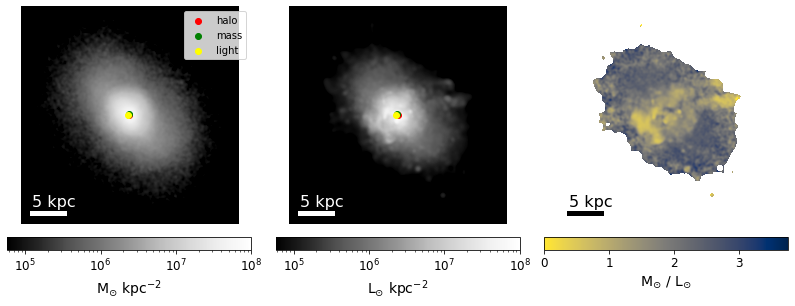

43
43 m11c_res2100 yz


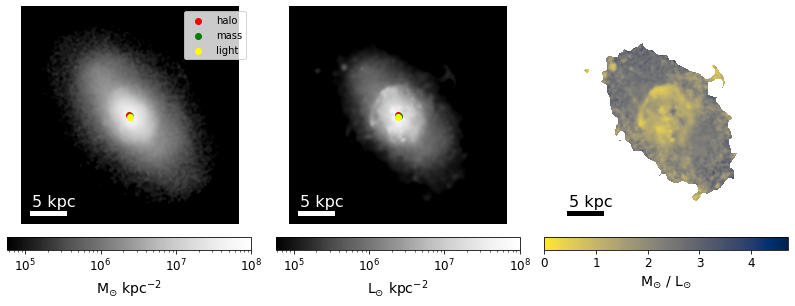

44
44 m11c_res2100 zx


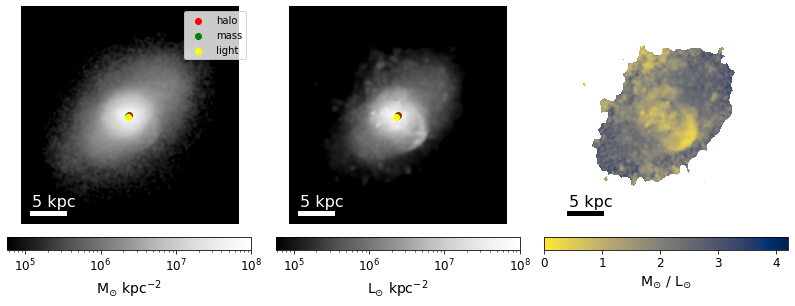

45
45 m11d_res7100 xy


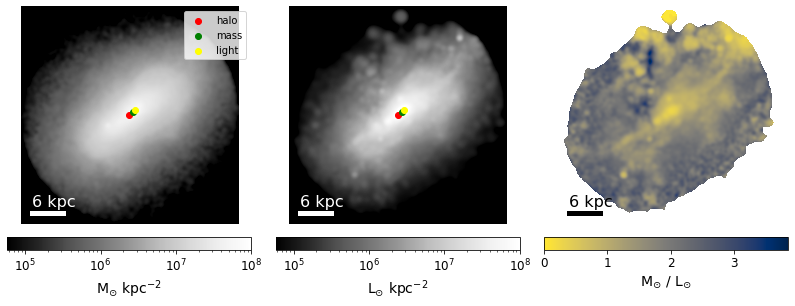

46
46 m11d_res7100 yz


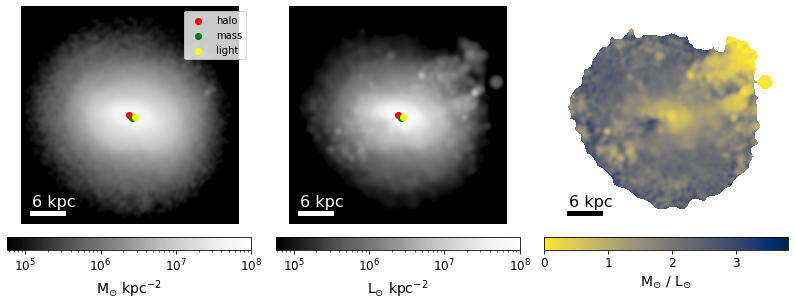

47
47 m11d_res7100 zx


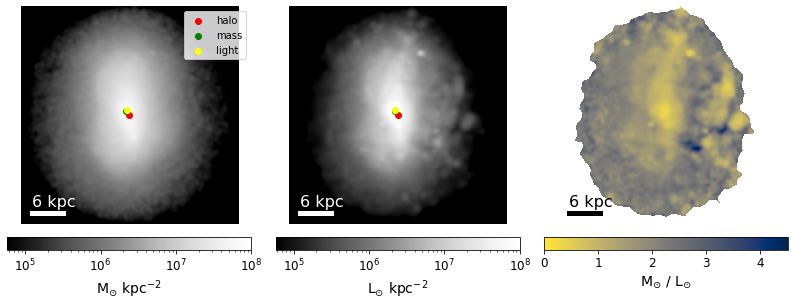

48
48 m11e_res7100 xy


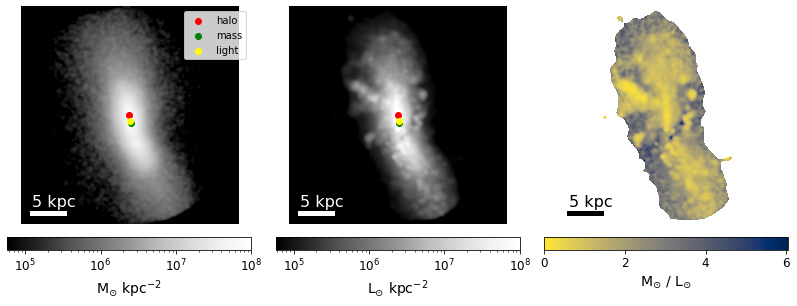

49
49 m11e_res7100 yz


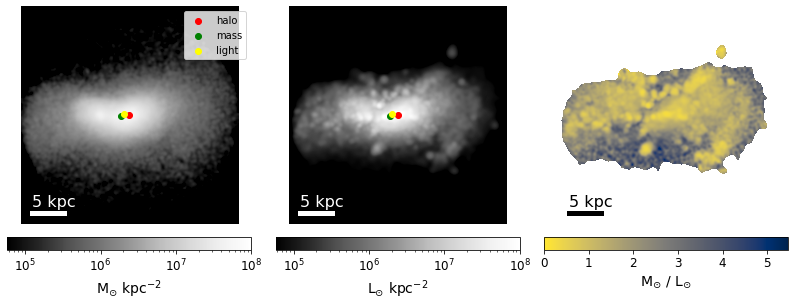

50
50 m11e_res7100 zx


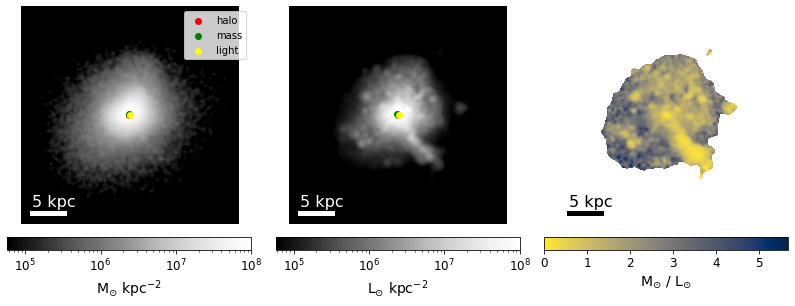

51
51 m11h_res7100 xy


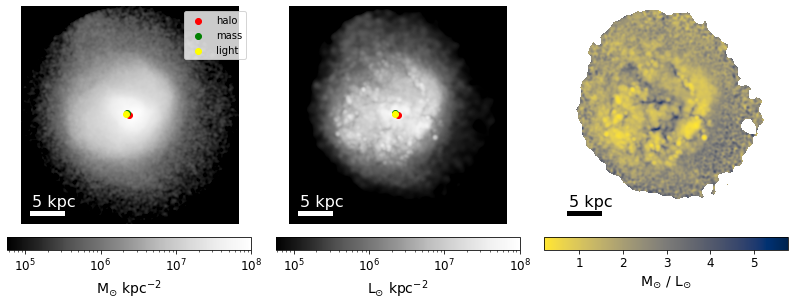

52
52 m11h_res7100 yz


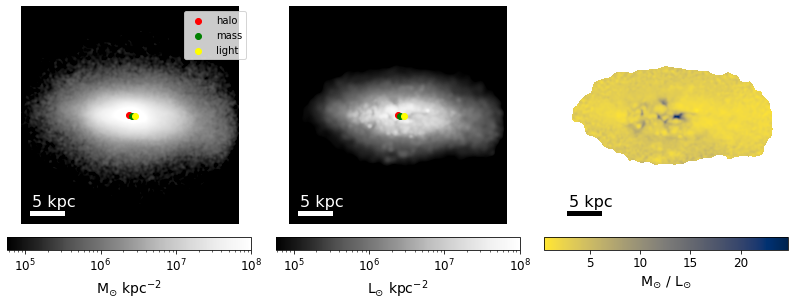

53
53 m11h_res7100 zx


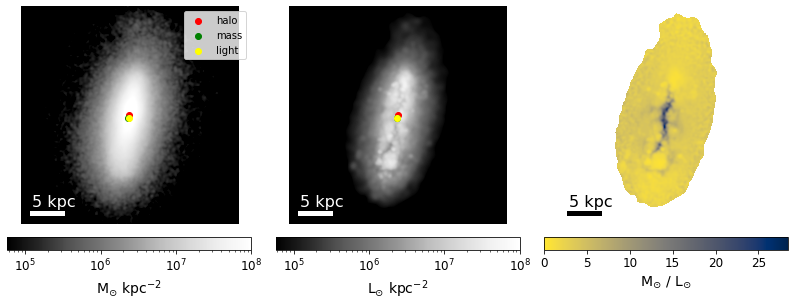

54
54 m11i_res7100 xy


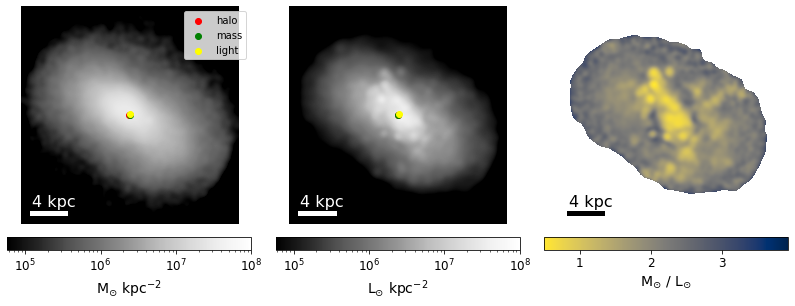

55
55 m11i_res7100 yz


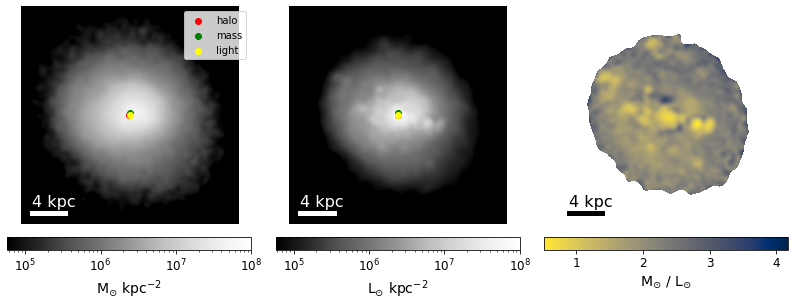

56
56 m11i_res7100 zx


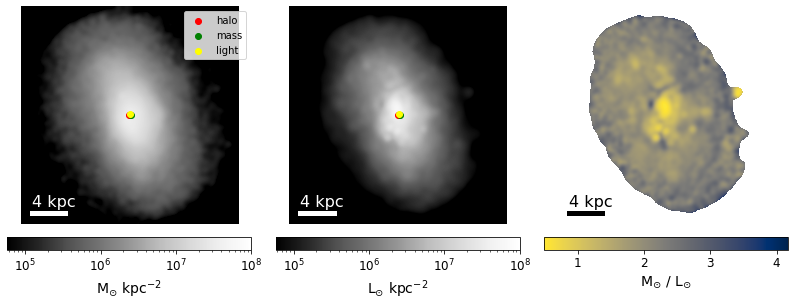

57
57 m11q_res7100 xy


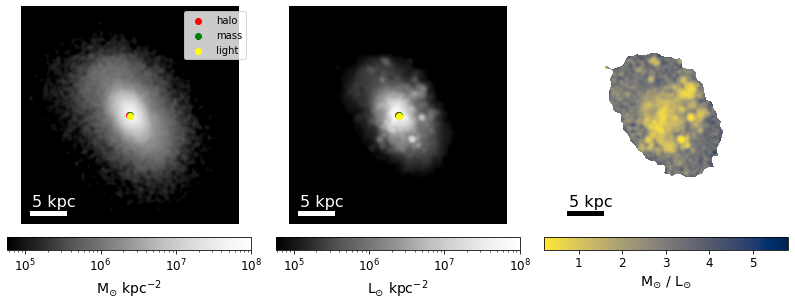

58
58 m11q_res7100 yz


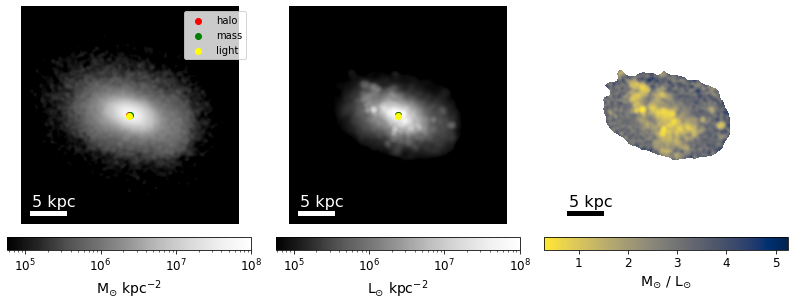

59
59 m11q_res7100 zx


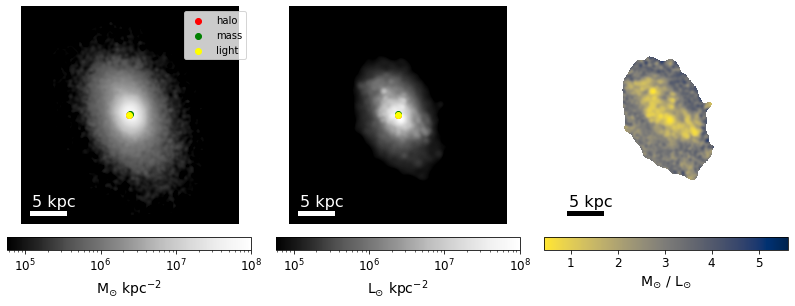

In [16]:
# go through mass files

for file_index in range(len(mass_mocks)):
    # mass image
    print(file_index, )
    mass_file = mass_mocks[file_index].split("/")[-1]
    mass_params = mass_file.split('_')
    sim = mass_params[0]+'_'+mass_params[1]
    view = mass_params[3]
    FOV = int(mass_params[4][3:])
    sml = int(mass_params[6][:-4])
    pixel = 1000
    print(file_index, sim, view)

    # band image
    band_file = band_mocks[file_index].split("/")[-1]
    band_params = band_file.split('_')
    band_sim = band_params[0]+'_'+band_params[1]
    band_view = band_params[3]

    #Check we are looking at the same images
    if (sim != band_sim) or (view != band_view):
        print('Not a matched file')
        print(sim,band_sim)
        print(view,band_view)
        print(mass_file)
        print(band_file)
    
    
    cm_data_i = cm_data.loc[(cm_data['sim'] == sim) & (cm_data['proj'] == view)]

    
    band_image = np.load(band_mocks[file_index])[1]
    mass_image = np.load(mass_mocks[file_index])
    
    
    kpctopix = pixel / (FOV*2)
    pixtokpc = kpctopix**-1
    
    
    fig, axs = plt.subplots(1,3,figsize=(14, 5))
    plt.subplots_adjust(wspace=0.1, hspace=0)

    #...........Mass Image...........
    plt.subplots_adjust(wspace=0.1, hspace=0)
    lim_value = 57650

    mass_image[mass_image<lim_value] = 1
    Mass_image = axs[0].imshow(mass_image, norm=colors.LogNorm(vmin=lim_value, vmax=1e8),cmap='Greys_r') #57650
    
    cb = fig.colorbar(Mass_image, ax=axs[0],  orientation="horizontal", pad=0.05)
    cb.set_label(r'M$_{\odot}$ kpc$^{-2}$')
    
    
    #Create scale bar
    scale_kpc = FOV / 4
    scale_kpc = int(np.ceil(scale_kpc))
    pixel_bar = scale_kpc * 500 / FOV
    pixel_bar = int(np.ceil(pixel_bar))

    #add scale bar
    axs[0].plot([50,50 + pixel_bar],[950,950],  c='w', linewidth='5')
    
    axs[0].scatter(500,500,color='red', label='halo')
    axs[0].scatter(500 + cm_data_i['cm_stellarmass_x']*kpctopix,
                   500 +cm_data_i['cm_stellarmass_y']*kpctopix, color='green',label='mass')
    axs[0].scatter(500 +cm_data_i['cm_luminosity_x']*kpctopix,
                   500 +cm_data_i['cm_luminosity_y']*kpctopix, color='yellow',label='light')
    axs[0].legend(prop={'size':10})
    axs[0].text(50, 920, f'{scale_kpc:.0f} kpc',color='w', fontsize=16)
    axs[0].axis('equal')
    axs[0].axis('off')
    
    #...........Band Image...........
    plt.subplots_adjust(wspace=0.1, hspace=0)
    
    band_image[band_image<lim_value] = 1
    band_image_smoothed = gaussian_filter(band_image, sigma = sml )

    Band_image = axs[1].imshow(band_image_smoothed ,norm=colors.LogNorm(vmin=lim_value, vmax=1e8),
                          cmap='Greys_r')
    
    cb = fig.colorbar(Band_image, ax=axs[1],  orientation="horizontal", pad=0.05)
    cb.set_label(r'L$_{\odot}$ kpc$^{-2}$')

    #add scale bar 
    axs[1].scatter(500,500,color='red', label='halo')
    axs[1].scatter(500 + cm_data_i['cm_stellarmass_x']*kpctopix,
                   500 +cm_data_i['cm_stellarmass_y']*kpctopix, color='green',label='mass')
    axs[1].scatter(500 +cm_data_i['cm_luminosity_x']*kpctopix,
                   500 +cm_data_i['cm_luminosity_y']*kpctopix, color='yellow',label='light')
    axs[1].plot([50,50 + pixel_bar],[950,950],  c='w', linewidth='5')
    axs[1].text(50, 920, f'{scale_kpc:.0f} kpc',color='w', fontsize=16)
    axs[1].axis('equal')
    axs[1].axis('off')  
    
    # ...........M/L Image............
    #-----Mass-to-Light-Ratio------
    plt.subplots_adjust(wspace=0.1, hspace=0)

    band_image_smoothed[band_image_smoothed<lim_value] = 0
    mass_image[mass_image<lim_value] = -1

    Mass_to_Light_ratio = (mass_image/band_image_smoothed)
    MLR = axs[2].imshow(Mass_to_Light_ratio, cmap='cividis_r')#,norm=colors.Normalize(vmin=.01, vmax=3))

    
    cb = fig.colorbar(MLR, ax=axs[2], orientation="horizontal", pad=0.05)
    cb.set_label(r'M$_{\odot}$ / L$_{\odot}$')

    
    #-----Labels M/L------
    axs[2].plot([50,50 + pixel_bar],[950,950],  c='k', linewidth='5')
    axs[2].text(50, 920, f'{scale_kpc:.0f} kpc',color='k', fontsize=16)
    axs[2].axis('equal')
    axs[2].axis('off')

    plt.show()
    

2.25976556639467 2.086577263566993 1.4925327745367578


/var/folders/bm/n50953kd0yj8vwl7qjb3thz80000gn/T/ipykernel_8461/4077190460.py:113: RuntimeWarning: divide by zero encountered in true_divide
  Mass_to_Light_ratio = (mass_image/band_image_smoothed)


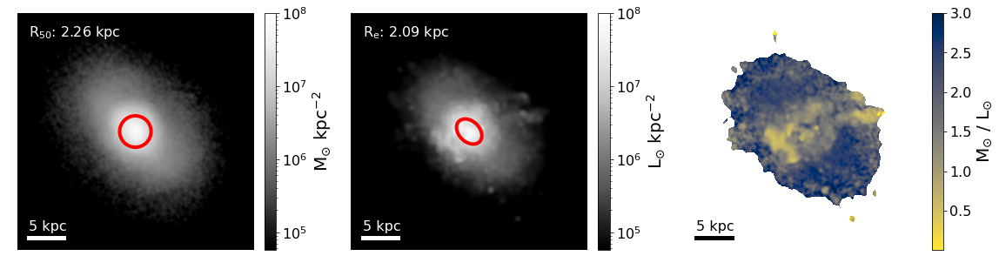

In [378]:
# go through mass files

plt.rcParams['axes.labelsize'] = 20

plt.rcParams['font.size'] = 20
params = {'mathtext.default': 'regular' }          
plt.rcParams.update(params)


file_index = 42

# mass image
mass_file = mass_mocks[file_index].split("/")[-1]
mass_params = mass_file.split('_')
sim = mass_params[0]+'_'+mass_params[1]
view = mass_params[3]
FOV = int(mass_params[4][3:])
sml = int(mass_params[6][:-4])
pixel = 1000

# band image
band_file = band_mocks[file_index].split("/")[-1]
band_params = band_file.split('_')
band_sim = band_params[0]+'_'+band_params[1]
band_view = band_params[3]

#Check we are looking at the same images
if (sim != band_sim) or (view != band_view):
    print('Not a matched file')
    print(sim,band_sim)
    print(view,band_view)
    print(mass_file)
    print(band_file)


cm_data_i = cm_data.loc[(cm_data['sim'] == sim) & (cm_data['proj'] == view)]
data_i = data.loc[(data['sim'] == sim) & (data['proj'] == view)]


band_image = np.load(band_mocks[file_index])[1]
mass_image = np.load(mass_mocks[file_index])


kpctopix = pixel / (FOV*2)
pixtokpc = kpctopix**-1


fig, axs = plt.subplots(1,3,figsize=(20, 5))
plt.subplots_adjust(wspace=0.1, hspace=0)

#...........Mass Image...........
plt.subplots_adjust(wspace=0.1, hspace=0)
lim_value = 57650
mass_image[mass_image<10] = 1
Mass_image = axs[0].imshow(mass_image, norm=colors.LogNorm(vmin=lim_value, vmax=1e8),cmap='Greys_r') #57650

r_circle=data_i['r50_lim'].values[0] 
axs[0].add_patch(Circle((500,500), r_circle * kpctopix , 
                    edgecolor='r', facecolor='none', linewidth=4,))

cb = fig.colorbar(Mass_image, ax=axs[0],  orientation="vertical", pad=0)
cb.set_label(r'M$_{\odot}$ kpc$^{-2}$')
cb.ax.tick_params(labelsize=16)


#Create scale bar
scale_kpc = FOV / 4
scale_kpc = int(np.ceil(scale_kpc))
pixel_bar = scale_kpc * 500 / FOV
pixel_bar = int(np.ceil(pixel_bar))

#add scale bar
axs[0].plot([50,50 + pixel_bar],[950,950],  c='w', linewidth='5')
axs[0].text(50, 920, f'{scale_kpc:.0f} kpc',color='w', fontsize=16)
axs[0].text(50, 100, 'R$_{50}$: 2.26 kpc',color='w', fontsize=16)

axs[0].axis('equal')
axs[0].axis('off')

#...........Band Image...........
plt.subplots_adjust(wspace=0.1, hspace=0)

band_image[band_image<10] = 1
band_image_smoothed = gaussian_filter(band_image, sigma = sml )

Band_image = axs[1].imshow(band_image_smoothed ,norm=colors.LogNorm(vmin=lim_value, vmax=1e8),
                      cmap='Greys_r')

cb = fig.colorbar(Band_image, ax=axs[1],  orientation="vertical", pad=0)
cb.set_label(r'L$_{\odot}$ kpc$^{-2}$')
cb.ax.tick_params(labelsize=16)

a, b = data_i['reff_1D_ellip'].values[0], (1 - data_i['ellip_2D'].values[0]) * data_i['reff_1D_ellip'].values[0],
print(data_i['r50_lim'].values[0],a,b)
axs[1].add_patch(Ellipse((500,500),a*kpctopix*2 , b*kpctopix *2,data_i['theta_2D']*180/np.pi,
                    edgecolor='r', facecolor='none', linewidth=4,)) #note ellipse wants the diameter 


#add scale bar 
axs[1].plot([50,50 + pixel_bar],[950,950],  c='w', linewidth='5')
axs[1].text(50, 100, f'R$_e$: {a:.2f} kpc',color='w', fontsize=16)
axs[1].text(50, 920, f'{scale_kpc:.0f} kpc',color='w', fontsize=16)
axs[1].axis('equal')
axs[1].axis('off')  

# ...........M/L Image............
#-----Mass-to-Light-Ratio------
plt.subplots_adjust(wspace=0.1, hspace=0)

band_image_smoothed[band_image_smoothed<lim_value] = 0
mass_image[mass_image<lim_value] = -1

Mass_to_Light_ratio = (mass_image/band_image_smoothed)
MLR = axs[2].imshow(Mass_to_Light_ratio, cmap='cividis_r',norm=colors.Normalize(vmin=.01, vmax=3))


cb = fig.colorbar(MLR, ax=axs[2], orientation="vertical", pad=0)
cb.set_label(r'M$_{\odot}$ / L$_{\odot}$')
cb.ax.tick_params(labelsize=16)


#-----Labels M/L------
axs[2].plot([50,50 + pixel_bar],[950,950],  c='k', linewidth='5')
axs[2].text(50, 920, f'{scale_kpc:.0f} kpc',color='k', fontsize=16)
axs[2].axis('equal')
axs[2].axis('off')
plt.savefig('/Users/courtneyklein/Research/DwarfGalaxy_MassRadius/Figures/masslightandratio_m11c.pdf', bbox_inches='tight', dpi=300)

plt.show()


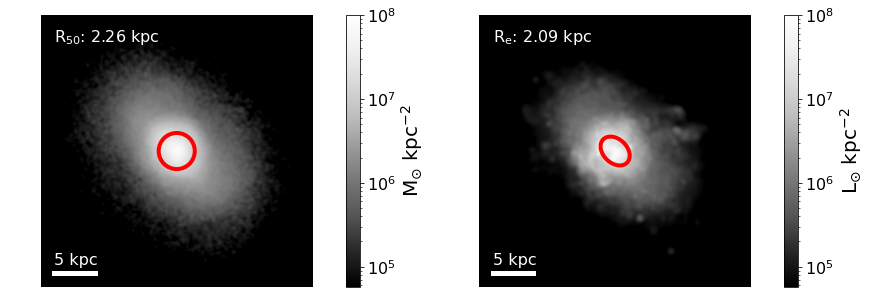

In [19]:
# go through mass files

plt.rcParams['axes.labelsize'] = 20

plt.rcParams['font.size'] = 20
params = {'mathtext.default': 'regular' }          
plt.rcParams.update(params)


file_index = 42

# mass image
mass_file = mass_mocks[file_index].split("/")[-1]
mass_params = mass_file.split('_')
sim = mass_params[0]+'_'+mass_params[1]
view = mass_params[3]
FOV = int(mass_params[4][3:])
sml = int(mass_params[6][:-4])
pixel = 1000

# band image
band_file = band_mocks[file_index].split("/")[-1]
band_params = band_file.split('_')
band_sim = band_params[0]+'_'+band_params[1]
band_view = band_params[3]

#Check we are looking at the same images
if (sim != band_sim) or (view != band_view):
    print('Not a matched file')
    print(sim,band_sim)
    print(view,band_view)
    print(mass_file)
    print(band_file)


data_i = data.loc[(data['sim'] == sim) & (data['proj'] == view)]


band_image = np.load(band_mocks[file_index])[1]
mass_image = np.load(mass_mocks[file_index])


kpctopix = pixel / (FOV*2)
pixtokpc = kpctopix**-1


fig, axs = plt.subplots(1,2,figsize=(15, 5))
plt.subplots_adjust(wspace=0.1, hspace=0)

#...........Mass Image...........
plt.subplots_adjust(wspace=0.1, hspace=0)
lim_value = 57650
mass_image[mass_image<10] = 1
Mass_image = axs[0].imshow(mass_image, norm=colors.LogNorm(vmin=lim_value, vmax=1e8),cmap='Greys_r') #57650

r_circle=data_i['r50_lim'].values[0] 
axs[0].add_patch(Circle((500,500), r_circle * kpctopix , 
                    edgecolor='r', facecolor='none', linewidth=4,))

cb = fig.colorbar(Mass_image, ax=axs[0],  orientation="vertical", pad=0)
cb.set_label(r'M$_{\odot}$ kpc$^{-2}$')
cb.ax.tick_params(labelsize=16)


#Create scale bar
scale_kpc = FOV / 4
scale_kpc = int(np.ceil(scale_kpc))
pixel_bar = scale_kpc * 500 / FOV
pixel_bar = int(np.ceil(pixel_bar))

#add scale bar
axs[0].plot([50,50 + pixel_bar],[950,950],  c='w', linewidth='5')
axs[0].text(50, 920, f'{scale_kpc:.0f} kpc',color='w', fontsize=16)
axs[0].text(50, 100, 'R$_{50}$: 2.26 kpc',color='w', fontsize=16)

axs[0].axis('equal')
axs[0].axis('off')

#...........Band Image...........
plt.subplots_adjust(wspace=0.1, hspace=0)

band_image[band_image<10] = 1
band_image_smoothed = gaussian_filter(band_image, sigma = sml )

Band_image = axs[1].imshow(band_image_smoothed ,norm=colors.LogNorm(vmin=lim_value, vmax=1e8),
                      cmap='Greys_r')

cb = fig.colorbar(Band_image, ax=axs[1],  orientation="vertical", pad=0)
cb.set_label(r'L$_{\odot}$ kpc$^{-2}$')
cb.ax.tick_params(labelsize=16)

a, b = data_i['reff_1D_ellip'].values[0], (1 - data_i['ellip_2D'].values[0]) * data_i['reff_1D_ellip'].values[0],
axs[1].add_patch(Ellipse((500,500),a*kpctopix*2 , b*kpctopix *2,data_i['theta_2D']*180/np.pi,
                    edgecolor='r', facecolor='none', linewidth=4,)) #note ellipse wants the diameter 


#add scale bar 
axs[1].plot([50,50 + pixel_bar],[950,950],  c='w', linewidth='5')
axs[1].text(50, 100, f'R$_e$: {a:.2f} kpc',color='w', fontsize=16)
axs[1].text(50, 920, f'{scale_kpc:.0f} kpc',color='w', fontsize=16)
axs[1].axis('equal')
axs[1].axis('off')  


plt.savefig('/Users/courtneyklein/Research/DwarfGalaxy_MassRadius/Figures/paper/mass_light_distribution_m11c.pdf', bbox_inches='tight', dpi=300)

plt.show()



In [ ]:
ellip_2D, theta_2D, reff_1D_ellip

In [335]:
data_i['theta_2D']

42    0.771396
Name: theta_2D, dtype: float64

# Center of Mass Analysis

This set of images was created based on centering the on the dark matter halo\
We explore the difference in center of mass for the dark matter, stars, and light\

### Disclaimer:
The center of mass measured here is based on the mock images.\
When you read out the images 



In [8]:
cm_data = pd.DataFrame(columns=['sim',
                                'proj',
                                'cm_halo_x',
                                'cm_halo_y',
                                'cm_halo_x_pixel',
                                'cm_halo_y_pixel',
                                'cm_stellarmass_x',
                                'cm_stellarmass_y',
                                'cm_stellarmass_x_pixel',
                                'cm_stellarmass_y_pixel',
                                'cm_luminosity_x',
                                'cm_luminosity_y',
                                'cm_luminosity_x_pixel',
                                'cm_luminosity_y_pixel'
                               ]
                      )

In [9]:


for file_index in range(len(mass_mocks)):
    # mass image
    mass_file = mass_mocks[file_index].split("/")[-1]
    mass_params = mass_file.split('_')
    sim = mass_params[0]+'_'+mass_params[1]
    view = mass_params[3]
    FOV = int(mass_params[4][3:])
    sml = int(mass_params[6][:-4])
    pixel = 1000

    # band image
    band_file = band_mocks[file_index].split("/")[-1]
    band_params = band_file.split('_')
    band_sim = band_params[0]+'_'+band_params[1]
    band_view = band_params[3]

    #Check we are looking at the same images
    if (sim != band_sim) or (view != band_view):
        print('Not a matched file')
        print(sim,band_sim)
        print(view,band_view)
        print(mass_file)
        print(band_file)
    
    band_image = np.load(band_mocks[file_index])[1]
    mass_image = np.load(mass_mocks[file_index])
    
    # give coords for each pixel 

    mid_pixel_FOV = FOV - FOV / pixel
    x, y = np.linspace(-mid_pixel_FOV, mid_pixel_FOV, pixel), np.linspace(-mid_pixel_FOV, mid_pixel_FOV, pixel)
    X, Y = np.meshgrid(x, y)
    coords = np.vstack((X.ravel(), Y.ravel()))
    
    x_pix, y_pix = np.linspace(0, pixel, pixel), np.linspace(0, pixel, pixel)
    X_pix, Y_pix = np.meshgrid(x_pix, y_pix)
    coords_pix = np.vstack((X_pix.ravel(), Y_pix.ravel()))


    cm_light = center_mass(np.transpose(coords), band_image.ravel())
    cm_mass = center_mass(np.transpose(coords), mass_image.ravel())
    cm_light_pix = center_mass(np.transpose(coords_pix), band_image.ravel())
    cm_mass_pix = center_mass(np.transpose(coords_pix), mass_image.ravel())
    
    
    save_data = {'sim':sim,
                 'proj':view,
                 'cm_halo_x':0,
                 'cm_halo_y':0,
                 'cm_halo_x_pixel':500,
                 'cm_halo_y_pixel':500,
                 'cm_stellarmass_x':cm_mass[0],
                 'cm_stellarmass_y':cm_mass[1],
                 'cm_stellarmass_x_pixel':cm_mass_pix[0],
                 'cm_stellarmass_y_pixel':cm_mass_pix[1],
                 'cm_luminosity_x':cm_light[0],
                 'cm_luminosity_y':cm_light[1],
                 'cm_luminosity_x_pixel':cm_light_pix[0],
                 'cm_luminosity_y_pixel':cm_light_pix[1]
                }
        
    cm_data = cm_data.append(save_data,ignore_index=True)    

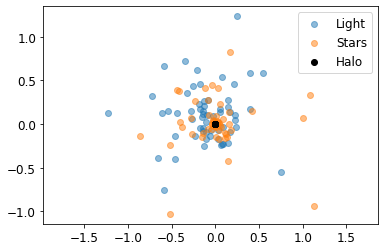

In [298]:
plt.scatter(cm_data['cm_stellarmass_x'],cm_data['cm_stellarmass_y'], label='Light', alpha=.5)
plt.scatter(cm_data['cm_luminosity_x'],cm_data['cm_luminosity_y'], label='Stars', alpha=.5)
plt.scatter(cm_data['cm_halo_x'],cm_data['cm_halo_y'],c='black', label='Halo')
plt.legend()
plt.gca().axis('equal')

plt.show()


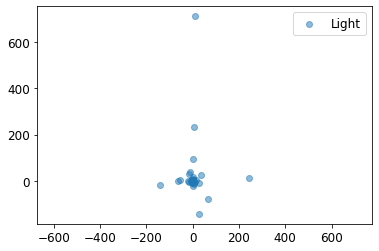

In [300]:
plt.scatter(cm_data['cm_stellarmass_x']/cm_data['cm_luminosity_x'],
            cm_data['cm_stellarmass_y']/cm_data['cm_luminosity_y'], label='Light', alpha=.5)
plt.legend()
plt.gca().axis('equal')

plt.show()


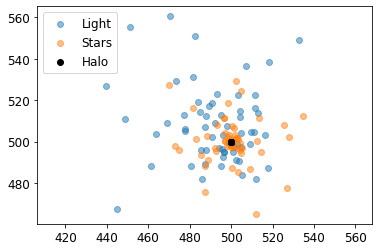

In [299]:
plt.scatter(cm_data['cm_stellarmass_x_pixel'],cm_data['cm_stellarmass_y_pixel'], label='Light', alpha=.5)
plt.scatter(cm_data['cm_luminosity_x_pixel'],cm_data['cm_luminosity_y_pixel'], label='Stars', alpha=.5)
plt.scatter(cm_data['cm_halo_x_pixel'],cm_data['cm_halo_y_pixel'],c='black', label='Halo')
plt.legend()
plt.gca().axis('equal')

plt.show()


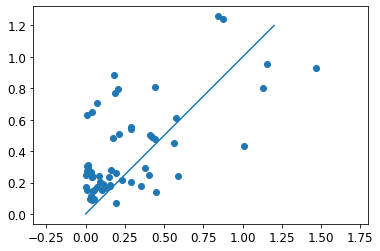

In [189]:
plt.scatter(np.sqrt(cm_data['cm_luminosity_x']**2+cm_data['cm_luminosity_y']**2),
           np.sqrt(cm_data['cm_stellarmass_x']**2+cm_data['cm_stellarmass_y']**2))
plt.plot([0,1.2],[0,1.2])
plt.gca().axis('equal')
plt.show()


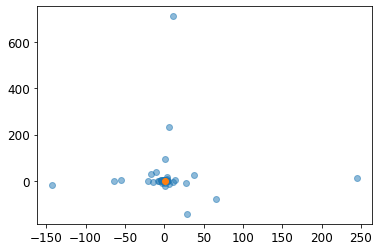

In [188]:
plt.scatter(cm_data['cm_stellarmass_x']/cm_data['cm_luminosity_x'],
            cm_data['cm_stellarmass_y']/cm_data['cm_luminosity_y'], alpha=.5)
plt.scatter(1,1)
plt.show()


In [274]:
band_image = np.load(band_mocks[file_index])[1]


In [282]:
mid_pixel_FOV = FOV - FOV / pixel
x, y = np.linspace(-mid_pixel_FOV, mid_pixel_FOV, pixel), np.linspace(-mid_pixel_FOV, mid_pixel_FOV, pixel)
X, Y = np.meshgrid(x, y)
coords = np.vstack((X.ravel(), Y.ravel()))

In [285]:
x_pixel, y_pixel = np.linspace(0, pixel, pixel), np.linspace(0, pixel, pixel)
X_pixel, Y_pixel = np.meshgrid(x_pixel, y_pixel)


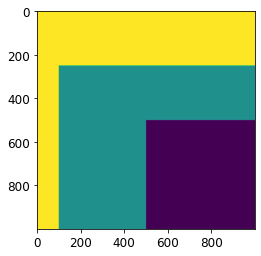

In [286]:
band_image[:,:] = 1

mask = (X < 0) | (Y < 0)
band_image[mask] = 2
mask = (X_pixel < 100) | (Y_pixel < 250)
band_image[mask] = 3


plt.imshow(band_image)

In [278]:
### figure out the pixel coordinate to make sure I am adjusting correctly 

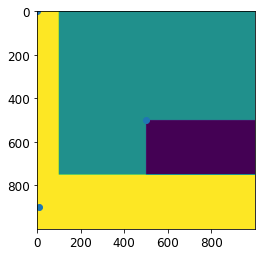

In [279]:
plt.imshow(band_image)
plt.scatter([0,500,10], [0, 500, 900])

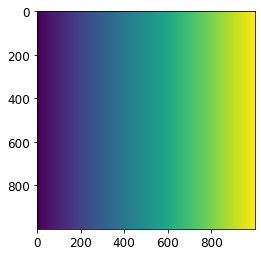

In [280]:
plt.imshow(X)


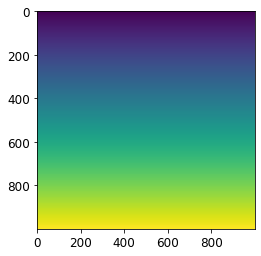

In [281]:
plt.imshow(Y)


In [227]:
np.shape(band_image)

(1000, 1000)

In [229]:
np.shape(X)

(1000, 1000)

# 1D Distributions
Expore the difference between light and stellar mass distribution


/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: invalid value encountered in power
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


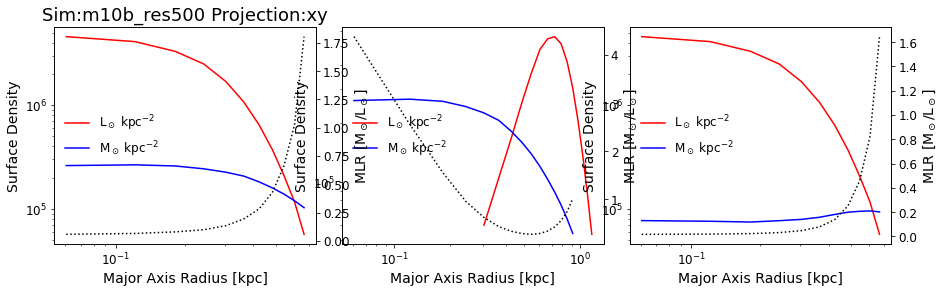

/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


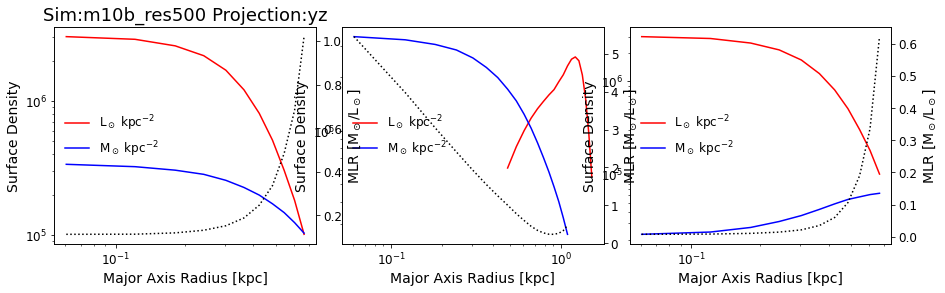

/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: invalid value encountered in power
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: invalid value encountered in power
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: invalid value encountered in power
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


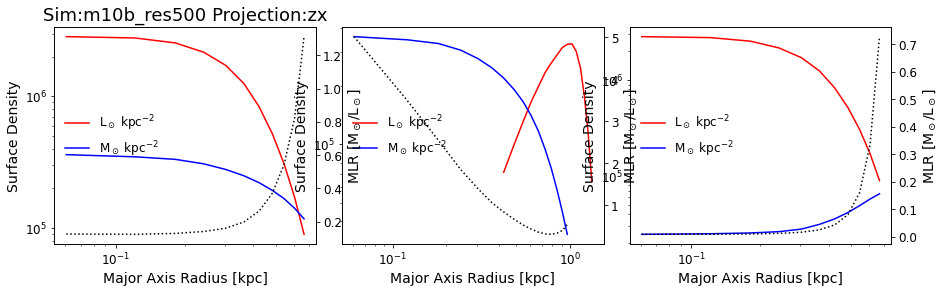

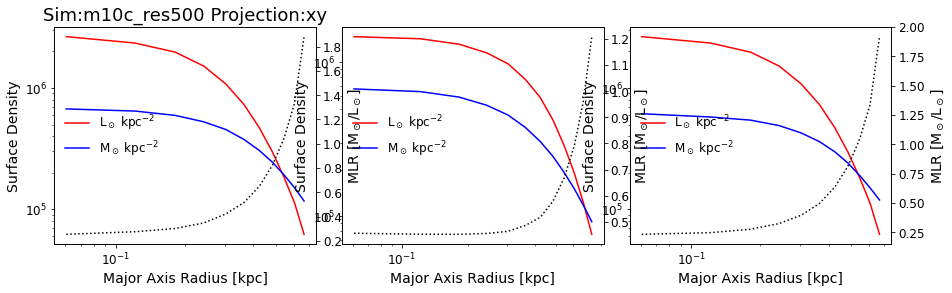

/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


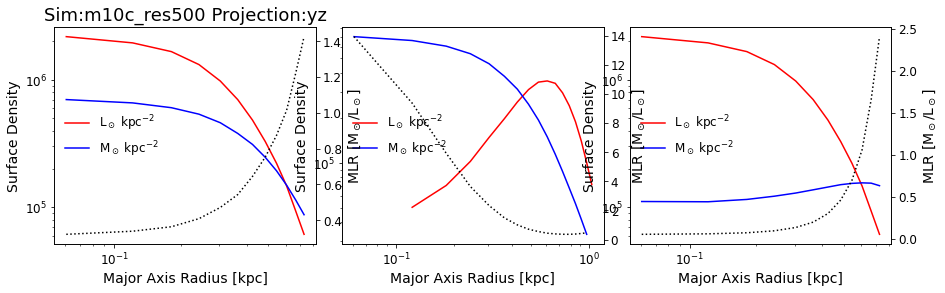

/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


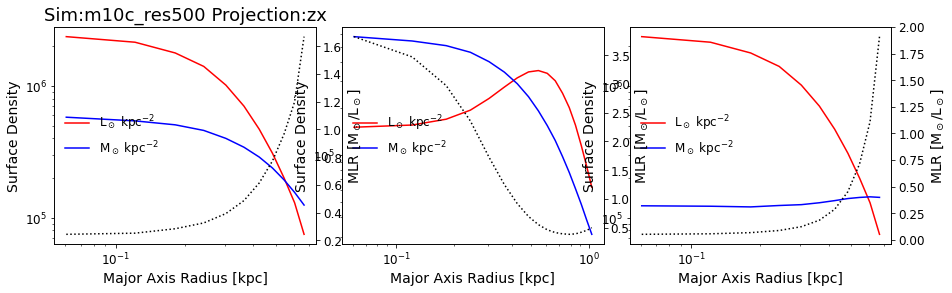

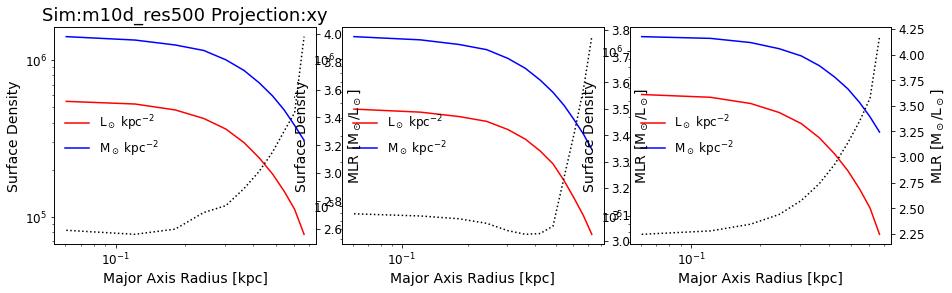

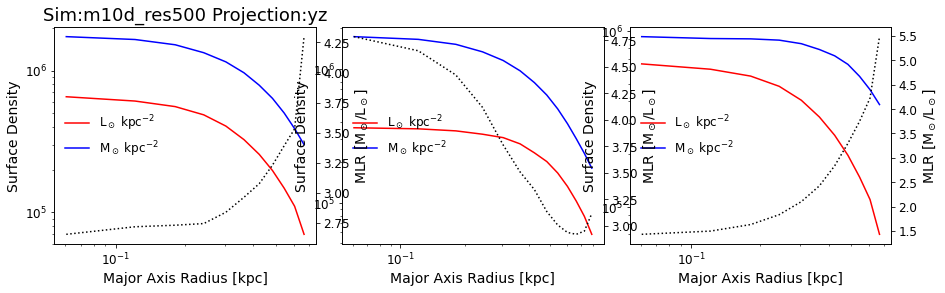

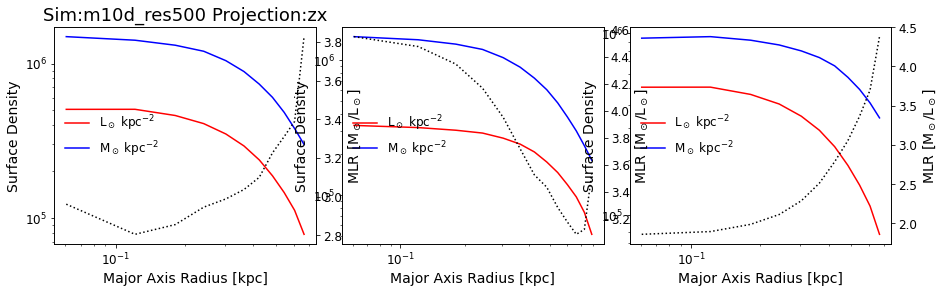

/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


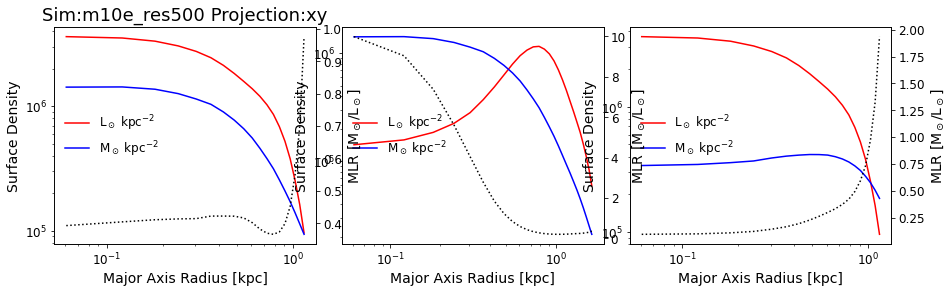

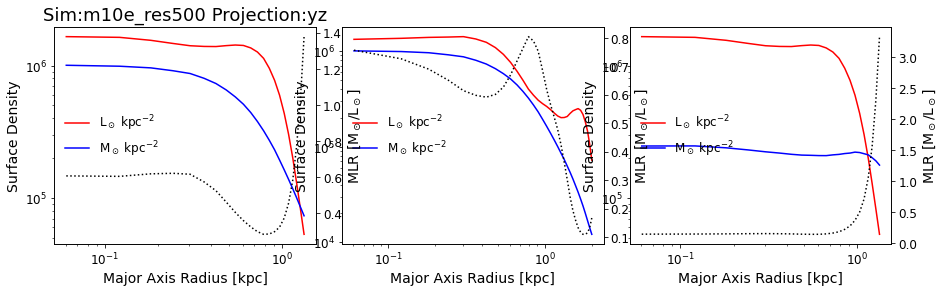

/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


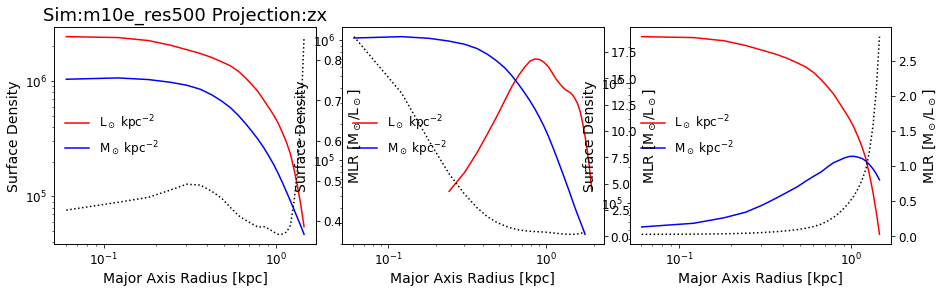

/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: invalid value encountered in power
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


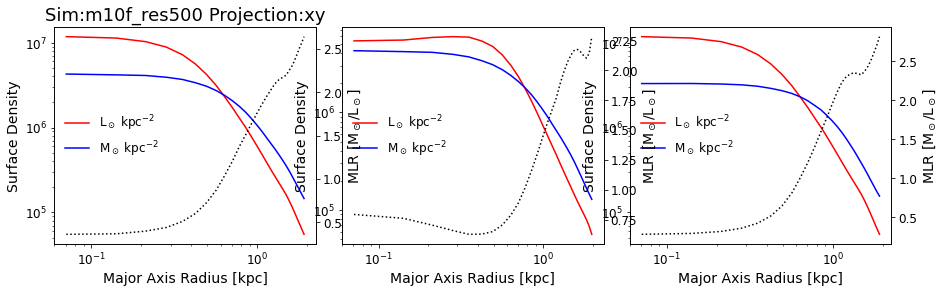

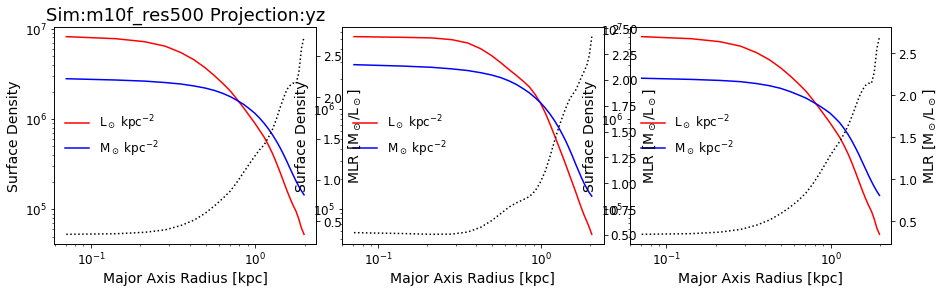

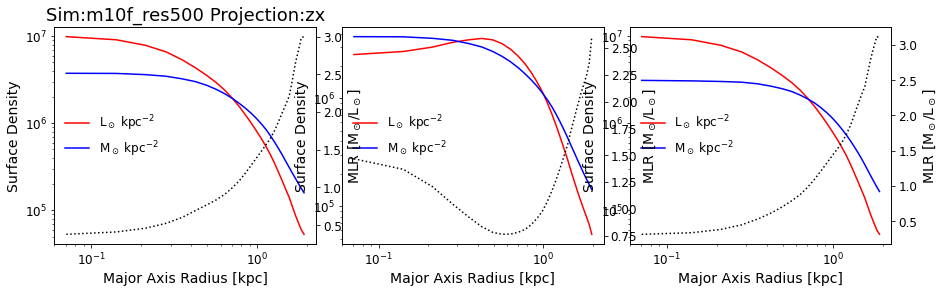

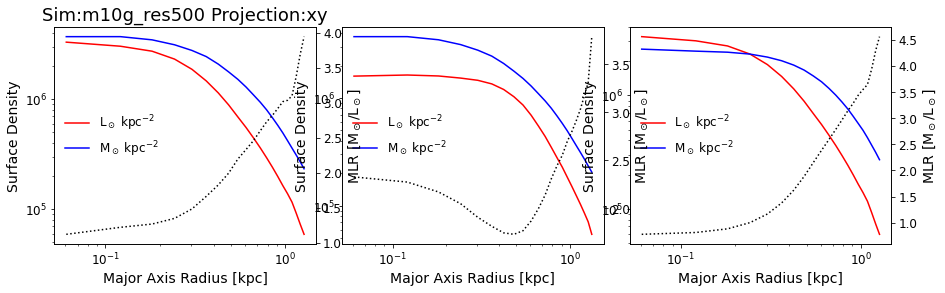

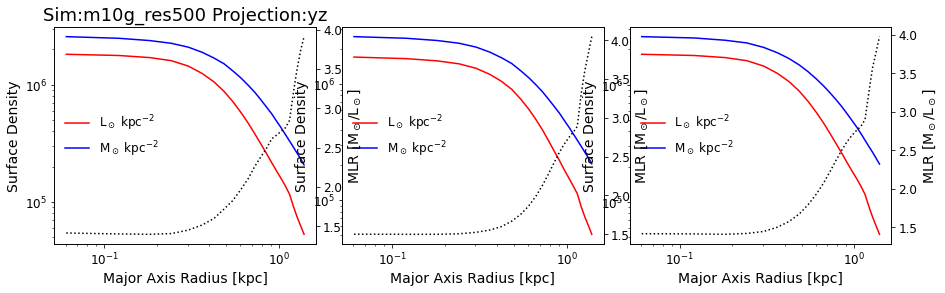

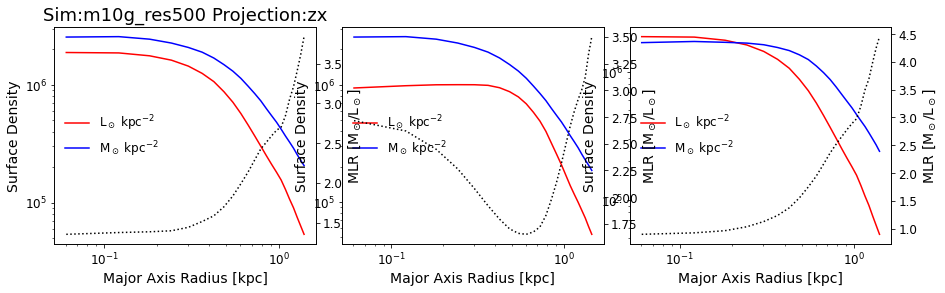

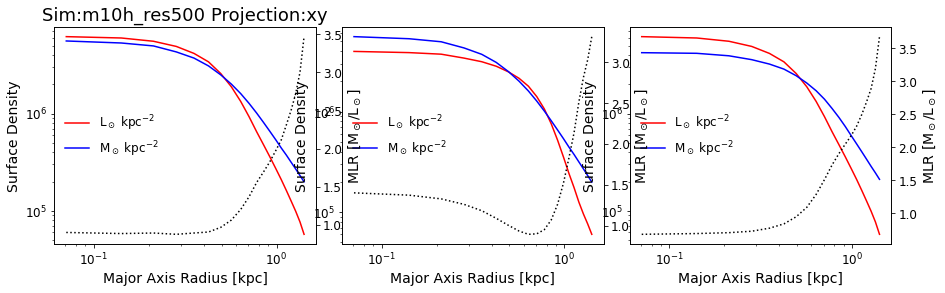

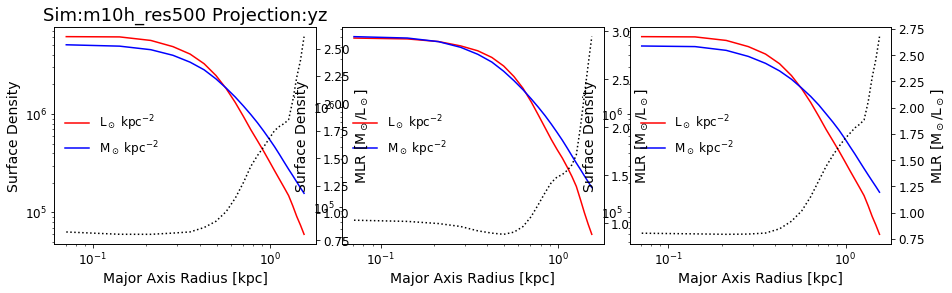

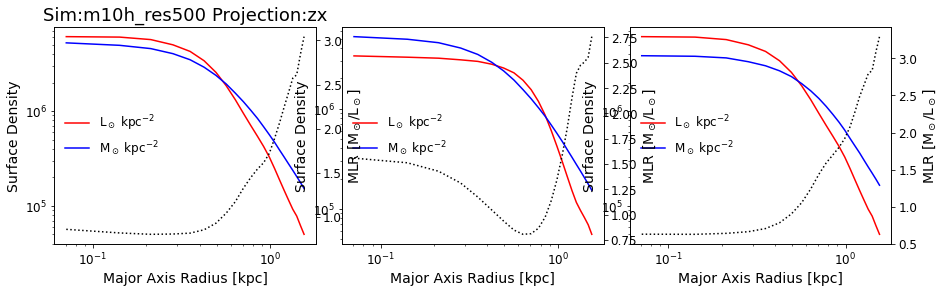

/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


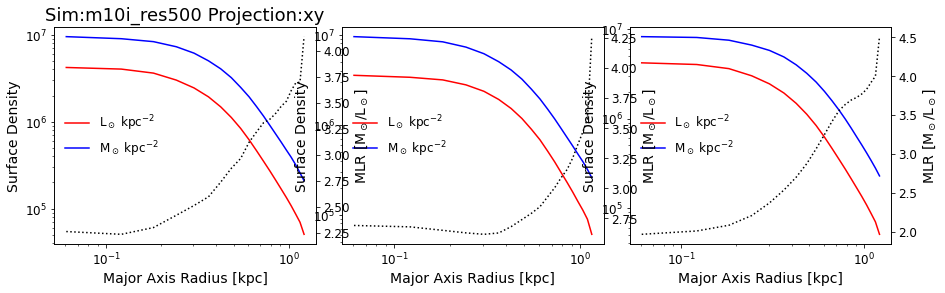

/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


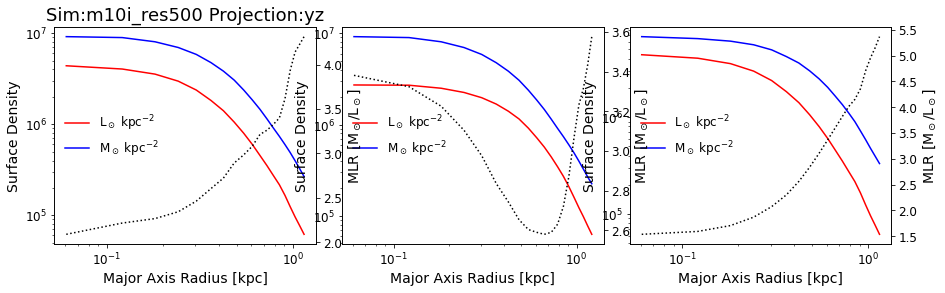

/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


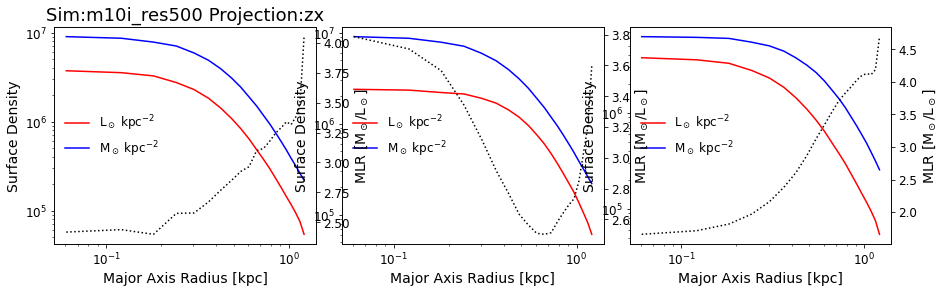

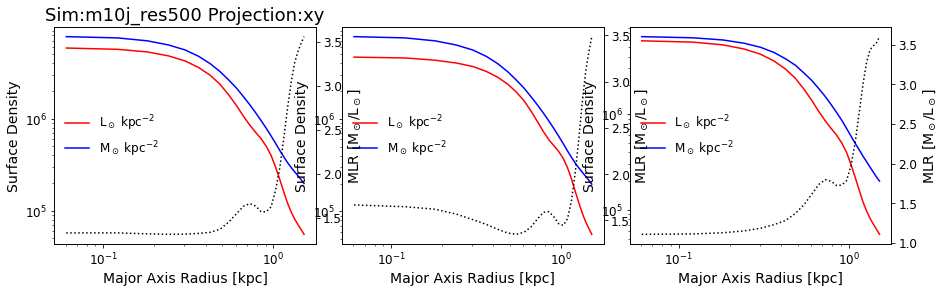

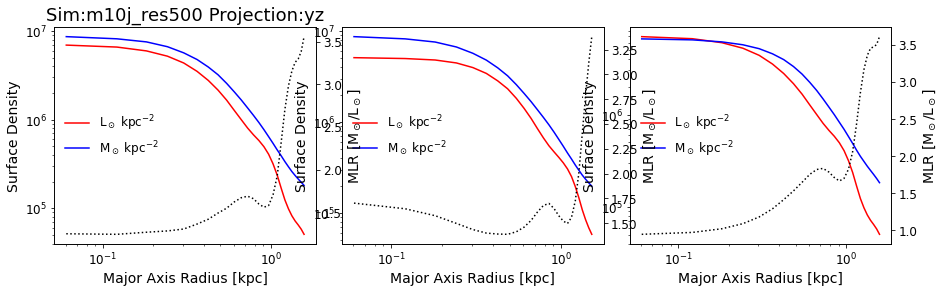

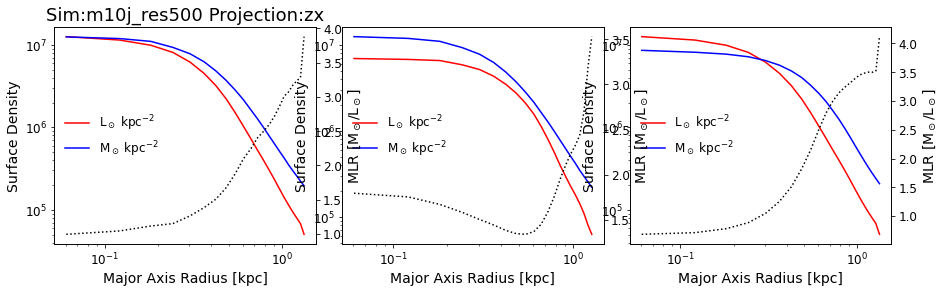

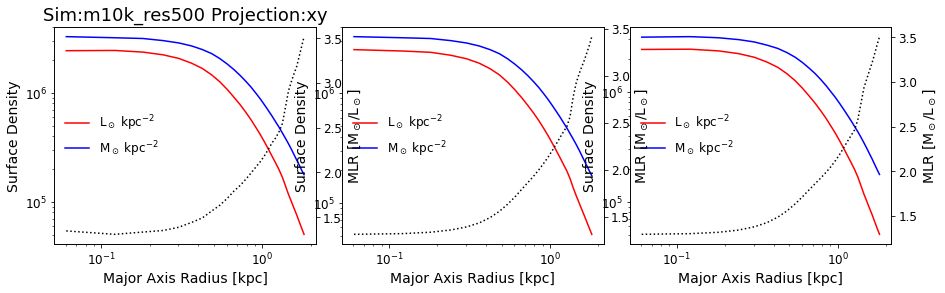

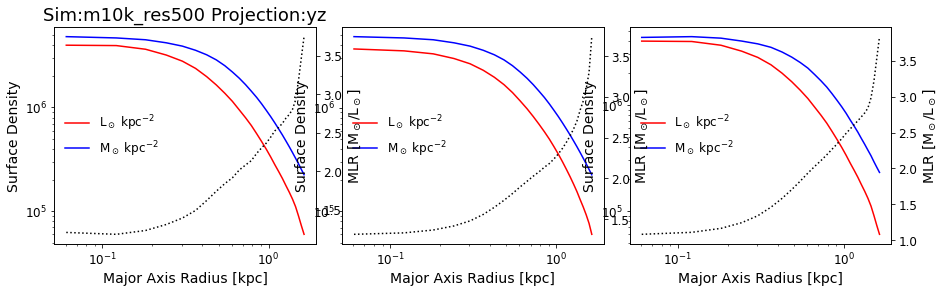

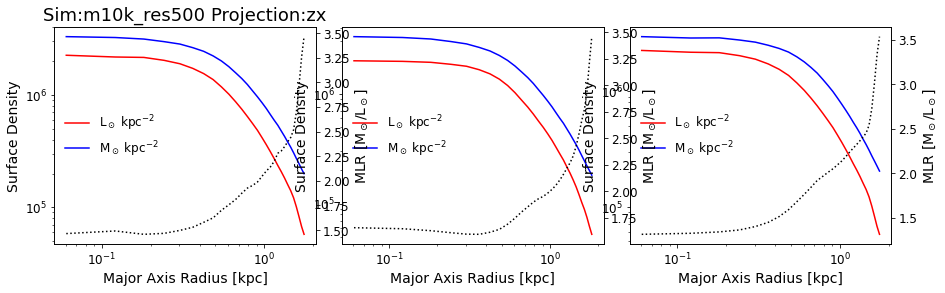

/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


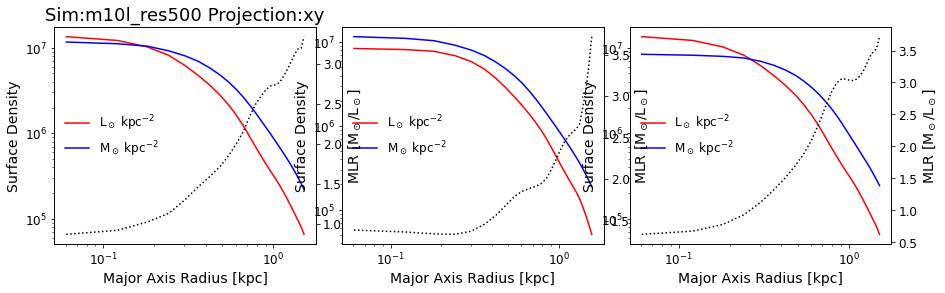

/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


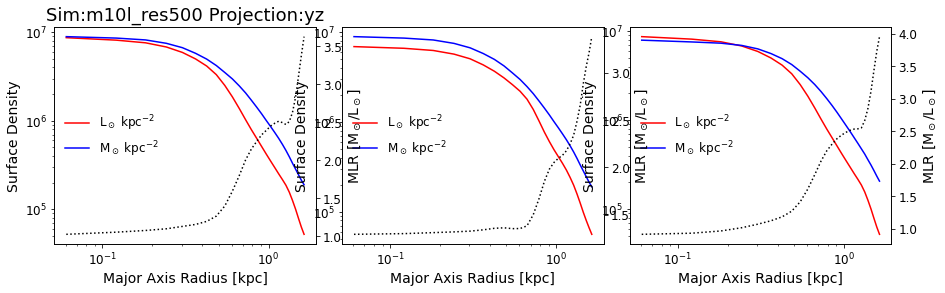

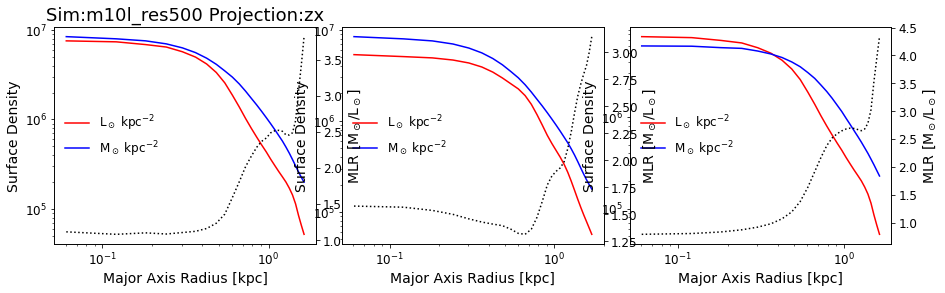

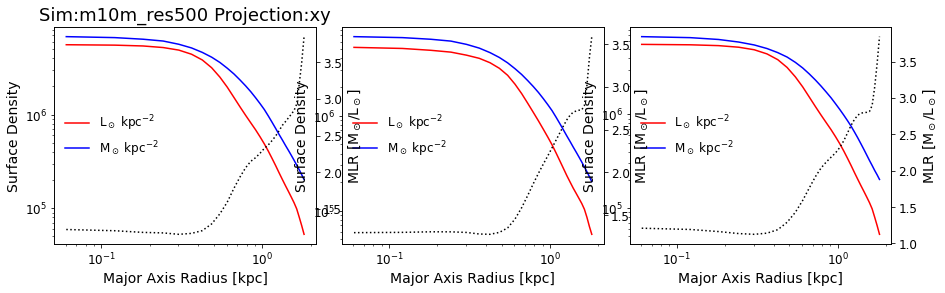

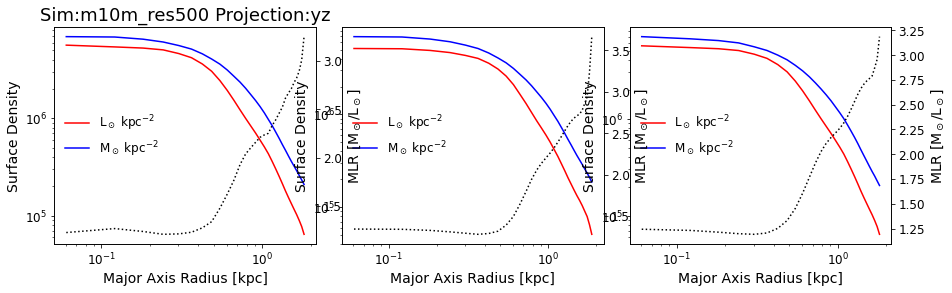

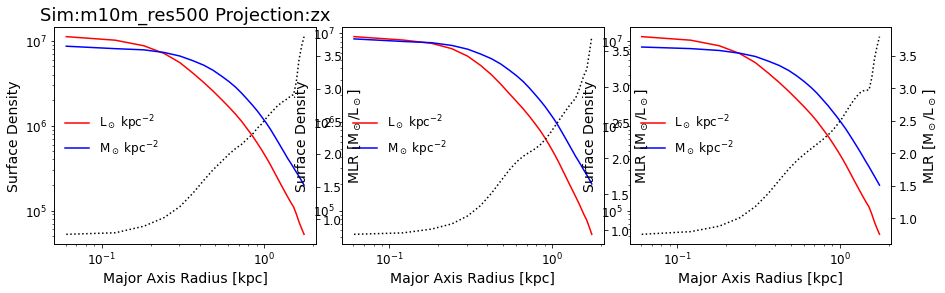

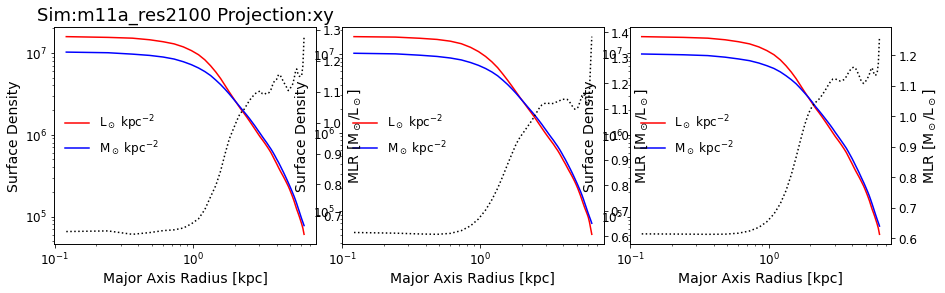

/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


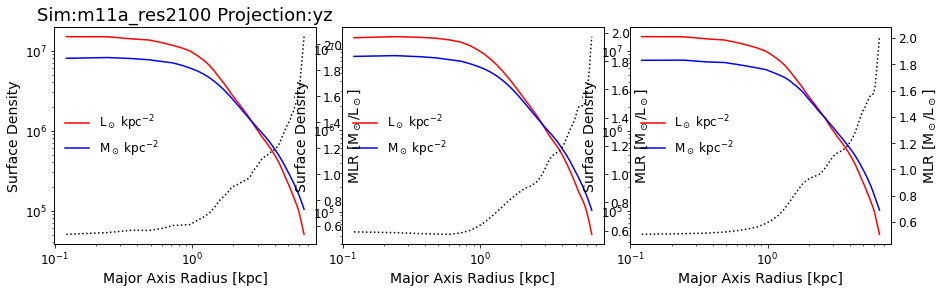

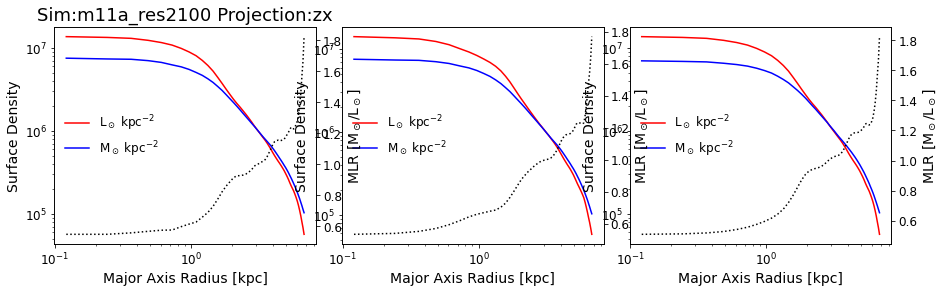

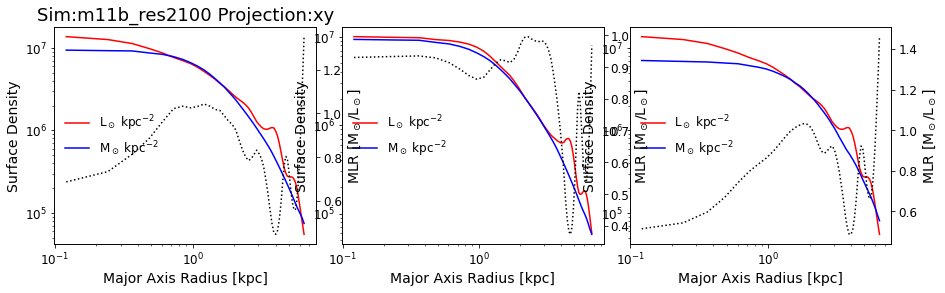

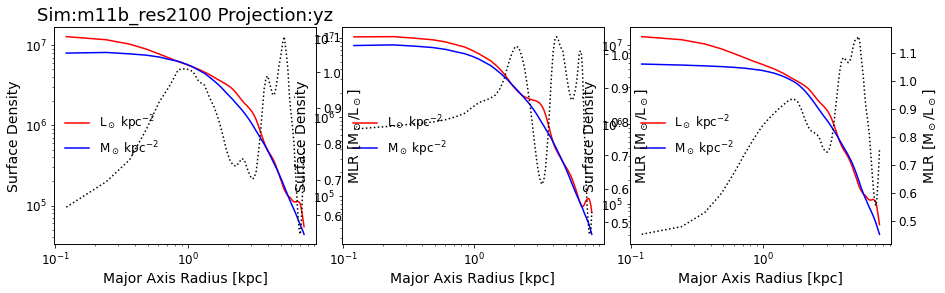

/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in multiply
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


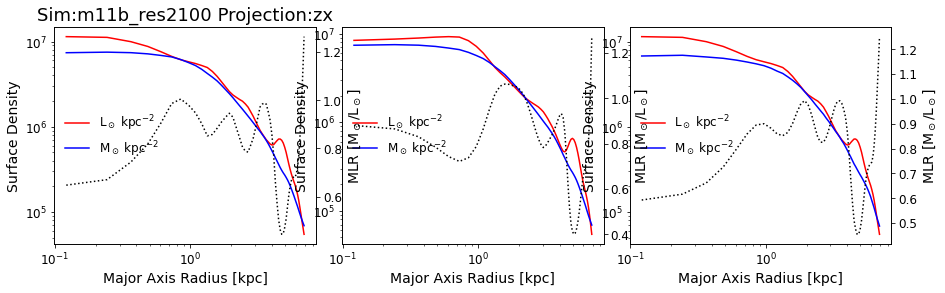

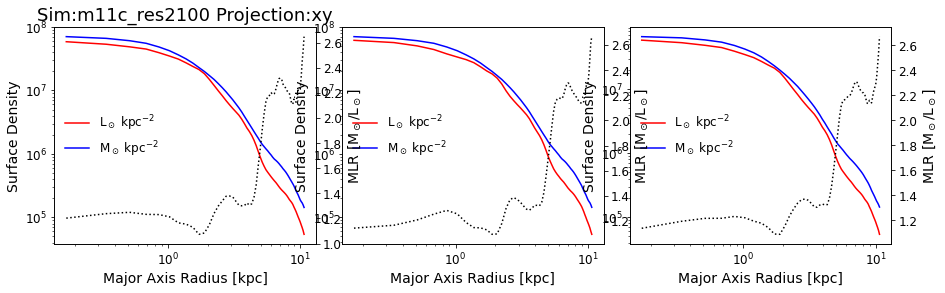

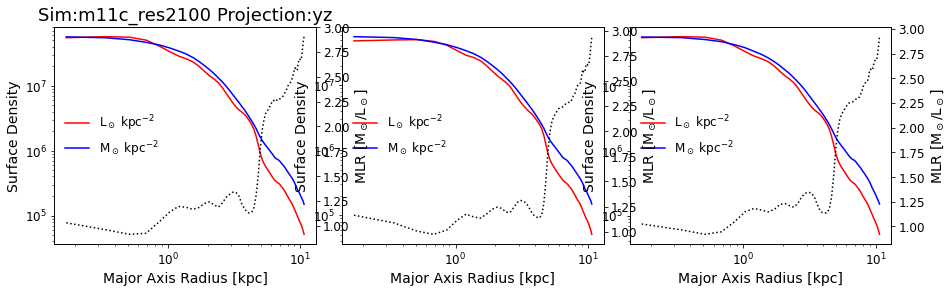

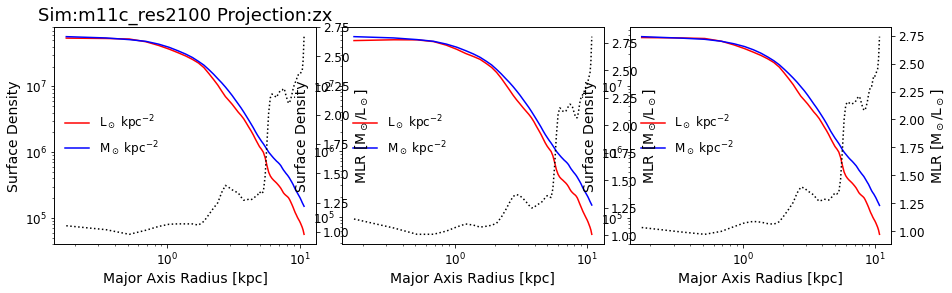

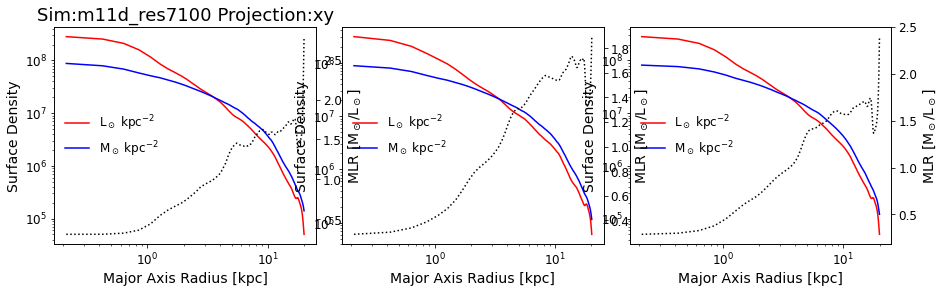

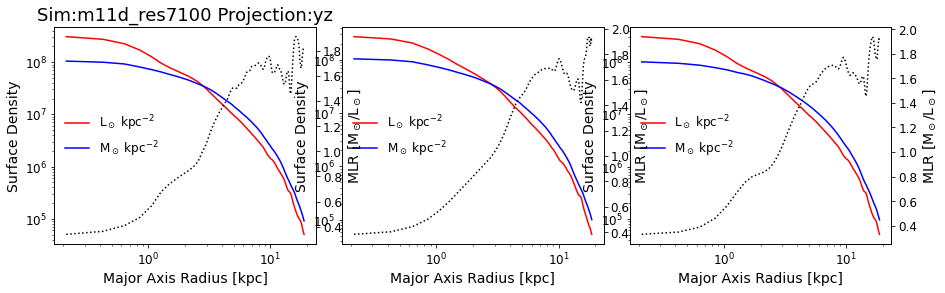

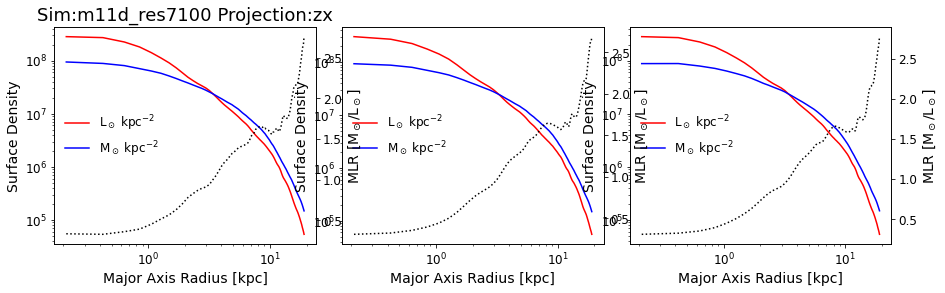

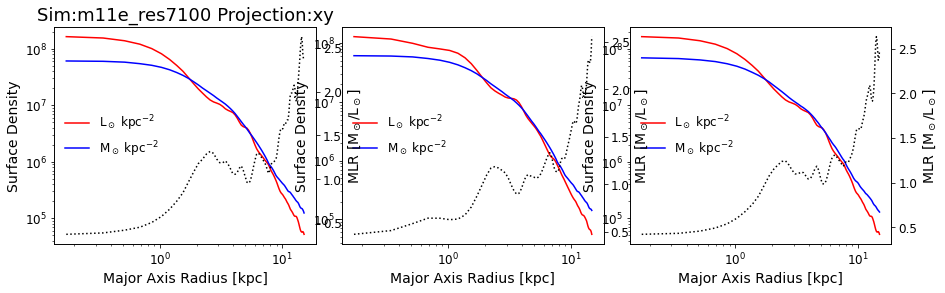

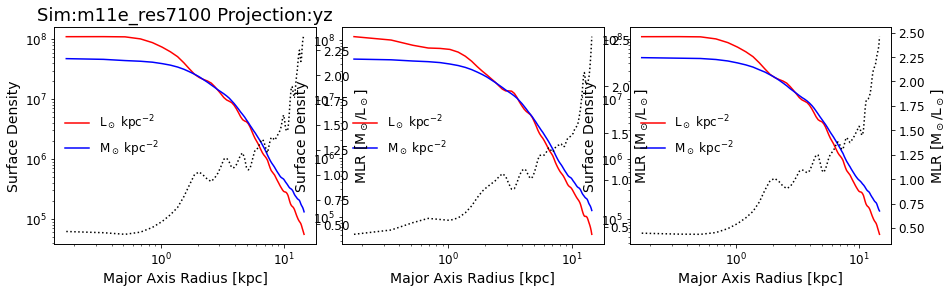

/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: invalid value encountered in power
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: invalid value encountered in power
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: invalid value encountered in power
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


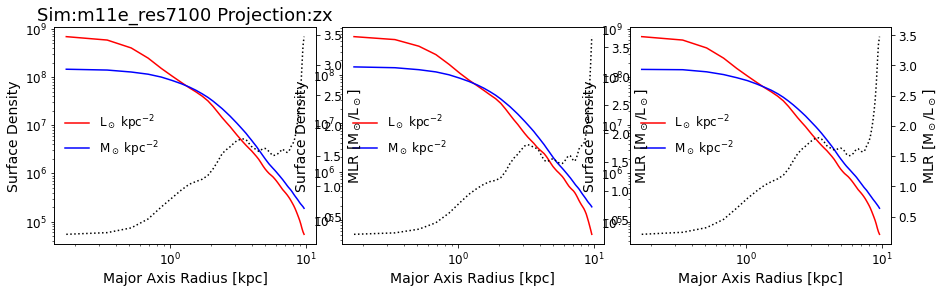

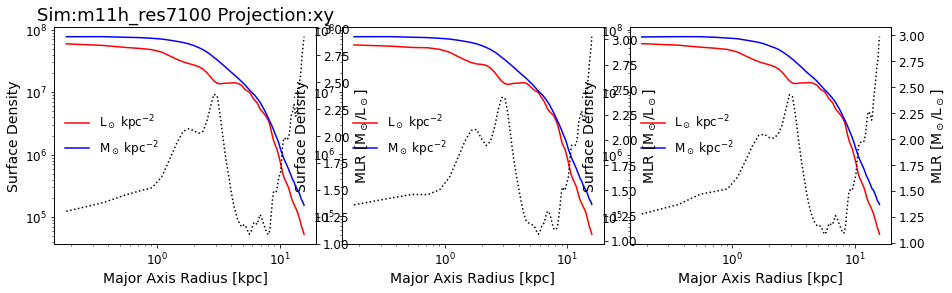

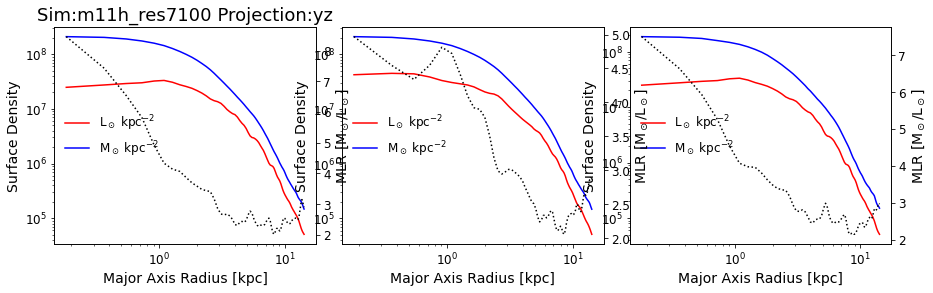

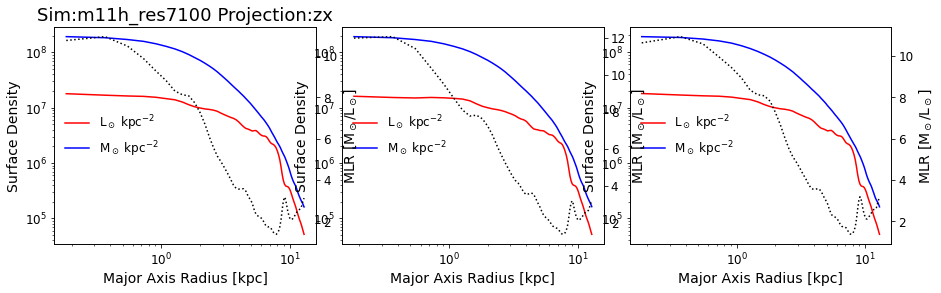

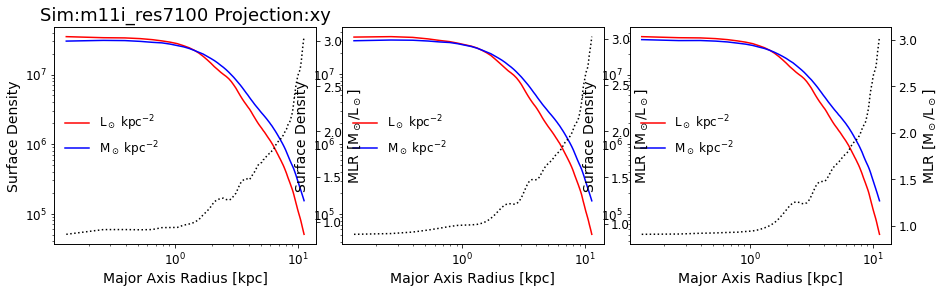

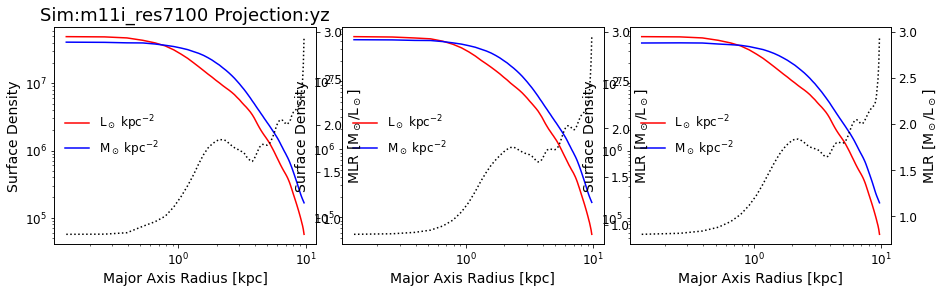

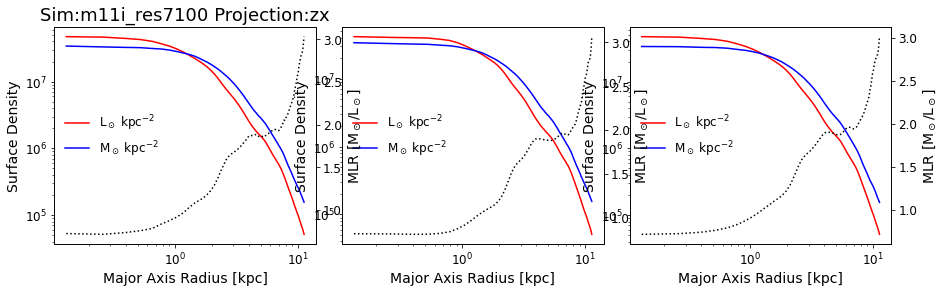

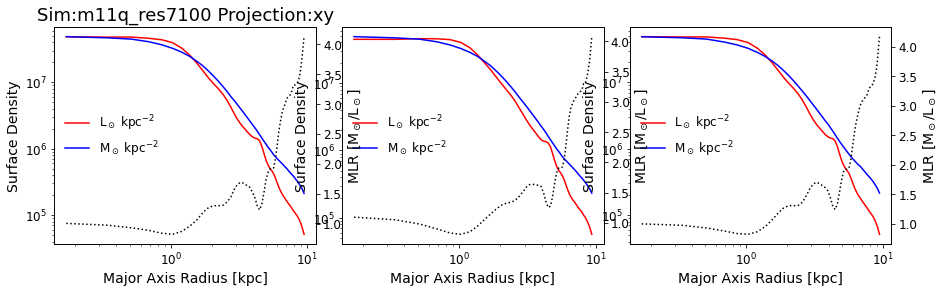

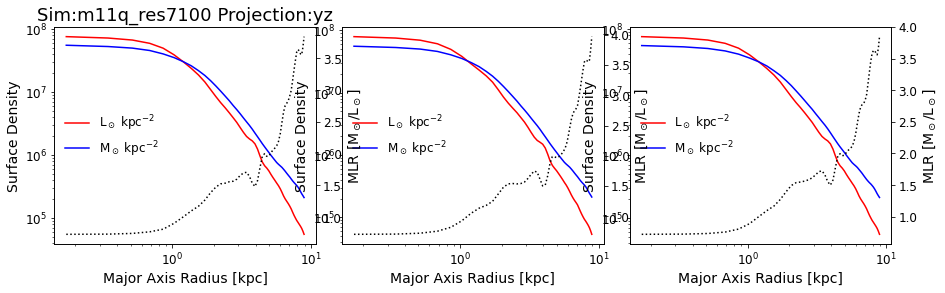

/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


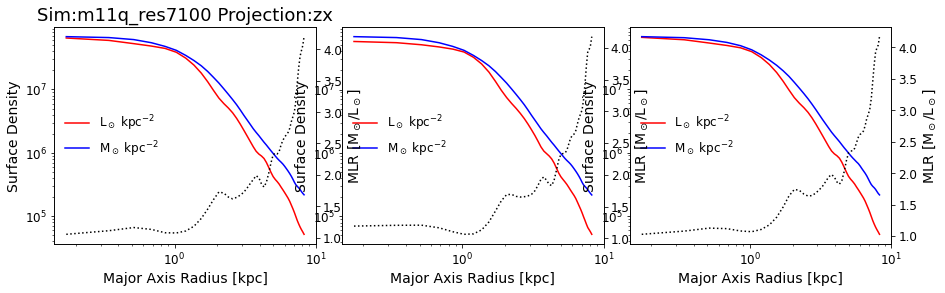

In [257]:
#Using Circles and three different centers

for file_index in range(len(mass_mocks)):
    # mass image
    mass_file = mass_mocks[file_index].split("/")[-1]
    mass_params = mass_file.split('_')
    sim = mass_params[0]+'_'+mass_params[1]
    view = mass_params[3]
    FOV = int(mass_params[4][3:])
    sml = int(mass_params[6][:-4])
    pixel = 1000

    # band image
    band_file = band_mocks[file_index].split("/")[-1]
    band_params = band_file.split('_')
    band_sim = band_params[0]+'_'+band_params[1]
    band_view = band_params[3]

    #Check we are looking at the same images
    if (sim != band_sim) or (view != band_view):
        print('Not a matched file')
        print(sim,band_sim)
        print(view,band_view)
        print(mass_file)
        print(band_file)
    
    
    mass_image = np.load(mass_mocks[file_index])
    band_image = np.load(band_mocks[file_index])[1]
    band_image_smoothed = gaussian_filter(band_image, sigma = sml )

    mass_image[mass_image < 1] = 1
    band_image_smoothed[band_image_smoothed < 1] = 1


    cm_data_i = cm_data.loc[(cm_data['sim'] == sim) & (cm_data['proj'] == view)]

    
    fig, axs = plt.subplots(1,3,figsize=(15, 4))
    
    #-----------DARK MATTER CENTER---------------
    plt.subplots_adjust(wspace=0.1, hspace=0)

    r_light,sb_light = measure_surfbright(band_image_smoothed, FOV=FOV, nmeasure=100,sb_lim=5e4,
                                          center_mass=[cm_data_i['cm_luminosity_x'].values[0],
                                                       cm_data_i['cm_luminosity_y'].values[0]])
    popt_light,std_light = fit_sersic(r_light, sb_light)

    r_mass,sb_mass = measure_surfbright(mass_image, FOV=FOV, nmeasure=100,sb_lim=0,
                                          center_mass=[cm_data_i['cm_stellarmass_x'].values[0],
                                                       cm_data_i['cm_stellarmass_y'].values[0]])
    popt_mass,std_mass= fit_sersic(r_mass, sb_mass)
    
    r_mass,sb_mass = r_mass[:len(r_light)],sb_mass[:len(r_light)]
    
    axs[0].loglog(r_light, sb_light,label='L$_\odot$ kpc$^{-2}$',c='red')
    axs[0].set_xlabel("Major Axis Radius [kpc]")
    axs[0].loglog(r_mass,  sb_mass ,label='M$_\odot$ kpc$^{-2}$',c='blue')
    axs[0].set_ylabel("Surface Density")
    axs[0].set_title(f'Sim:'+sim+' Projection:'+view)
    axs[0].legend(loc=6,frameon=False)

    ax0 = axs[0].twinx() 
    ax0.plot(r_mass, sb_mass/sb_light, label='MtoL', c='k', linestyle=':')
    ax0.set_ylabel("MLR [M$_\odot$/L$_\odot$]")
    
    
    #-----------STAR MATTER CENTER---------------
    plt.subplots_adjust(wspace=0.1, hspace=0)

    r_light,sb_light = measure_surfbright(band_image_smoothed, FOV=FOV, nmeasure=100,sb_lim=5e4, 
                                          center_mass=[cm_data_i['cm_stellarmass_x'].values[0],
                                                       cm_data_i['cm_stellarmass_y'].values[0]])
    popt_light,std_light = fit_sersic(r_light, sb_light)

    r_mass,sb_mass = measure_surfbright(mass_image, FOV=FOV, nmeasure=100,sb_lim=0,
                                        center_mass=[cm_data_i['cm_stellarmass_x'].values[0],
                                                     cm_data_i['cm_stellarmass_y'].values[0]])
    popt_mass,std_mass= fit_sersic(r_mass, sb_mass)
    
    r_mass,sb_mass = r_mass[:len(r_light)],sb_mass[:len(r_light)]
    
    axs[1].loglog(r_light, sb_light,label='L$_\odot$ kpc$^{-2}$',c='red')
    axs[1].set_xlabel("Major Axis Radius [kpc]")

    axs[1].loglog(r_mass,  sb_mass ,label='M$_\odot$ kpc$^{-2}$',c='blue')
    axs[1].set_ylabel("Surface Density")
    axs[1].set_title('')
    axs[1].legend(loc=6,frameon=False)

    ax1 = axs[1].twinx() 
    ax1.plot(r_mass, sb_mass/sb_light, label='MtoL', c='k', linestyle=':')
    ax1.set_ylabel("MLR [M$_\odot$/L$_\odot$]")
    
    
        #-----------DARK MATTER CENTER---------------
    plt.subplots_adjust(wspace=0.1, hspace=0)

    r_light,sb_light = measure_surfbright(band_image_smoothed, FOV=FOV, nmeasure=100,sb_lim=5e4,
                                         center_mass=[cm_data_i['cm_luminosity_x'].values[0],
                                                      cm_data_i['cm_luminosity_y'].values[0]])
    popt_light,std_light = fit_sersic(r_light, sb_light)

    r_mass,sb_mass = measure_surfbright(mass_image, FOV=FOV, nmeasure=100,sb_lim=0,
                                         center_mass=[cm_data_i['cm_luminosity_x'].values[0],
                                                      cm_data_i['cm_luminosity_y'].values[0]])
    popt_mass,std_mass= fit_sersic(r_mass, sb_mass)
    
    r_mass,sb_mass = r_mass[:len(r_light)],sb_mass[:len(r_light)]
    
    axs[2].loglog(r_light, sb_light,label='L$_\odot$ kpc$^{-2}$',c='red')
    axs[2].set_xlabel("Major Axis Radius [kpc]")

    axs[2].loglog(r_mass,  sb_mass ,label='M$_\odot$ kpc$^{-2}$',c='blue')
    axs[2].set_ylabel("Surface Density")
    axs[2].set_title('')
    axs[2].legend(loc=6,frameon=False)

    ax2 = axs[2].twinx() 
    ax2.plot(r_mass, sb_mass/sb_light, label='MtoL', c='k', linestyle=':')
    ax2.set_ylabel("MLR [M$_\odot$/L$_\odot$]")

    plt.show()

0.3911902969351971

/var/folders/bm/n50953kd0yj8vwl7qjb3thz80000gn/T/ipykernel_10873/1370234851.py:87: RuntimeWarning: divide by zero encountered in true_divide
  Mass_to_Light_ratio = (mass_image/band_image_smoothed)
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


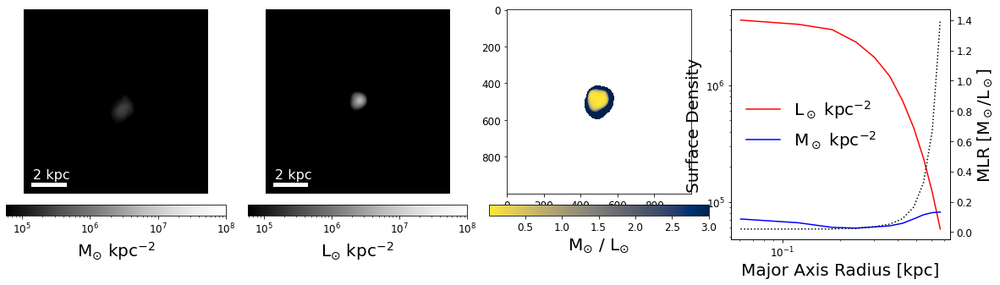

/var/folders/bm/n50953kd0yj8vwl7qjb3thz80000gn/T/ipykernel_10873/1370234851.py:87: RuntimeWarning: divide by zero encountered in true_divide
  Mass_to_Light_ratio = (mass_image/band_image_smoothed)
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: invalid value encountered in power
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


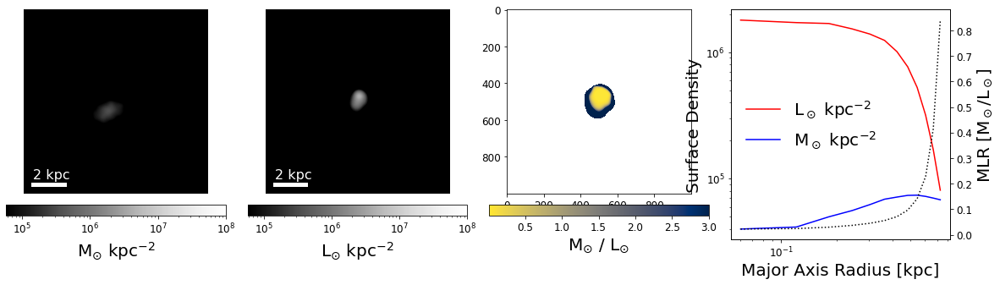

/var/folders/bm/n50953kd0yj8vwl7qjb3thz80000gn/T/ipykernel_10873/1370234851.py:87: RuntimeWarning: divide by zero encountered in true_divide
  Mass_to_Light_ratio = (mass_image/band_image_smoothed)
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in multiply
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: invalid value encountered in power
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


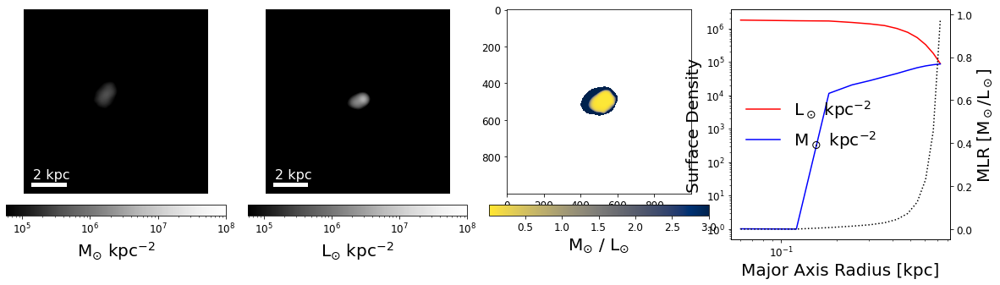

/var/folders/bm/n50953kd0yj8vwl7qjb3thz80000gn/T/ipykernel_10873/1370234851.py:87: RuntimeWarning: divide by zero encountered in true_divide
  Mass_to_Light_ratio = (mass_image/band_image_smoothed)


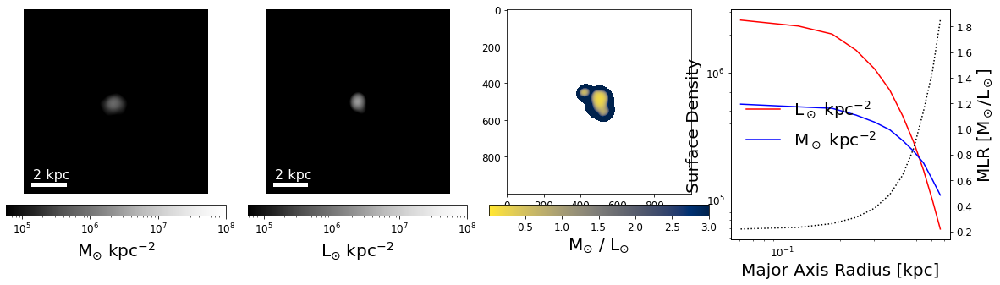

/var/folders/bm/n50953kd0yj8vwl7qjb3thz80000gn/T/ipykernel_10873/1370234851.py:87: RuntimeWarning: divide by zero encountered in true_divide
  Mass_to_Light_ratio = (mass_image/band_image_smoothed)
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


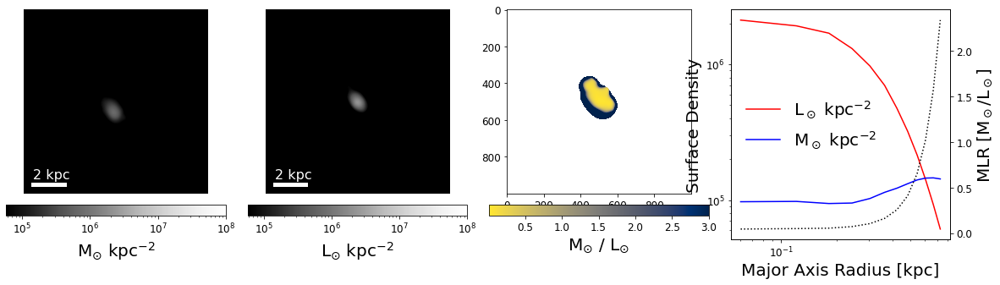

/var/folders/bm/n50953kd0yj8vwl7qjb3thz80000gn/T/ipykernel_10873/1370234851.py:87: RuntimeWarning: divide by zero encountered in true_divide
  Mass_to_Light_ratio = (mass_image/band_image_smoothed)
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in exp
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: overflow encountered in multiply
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


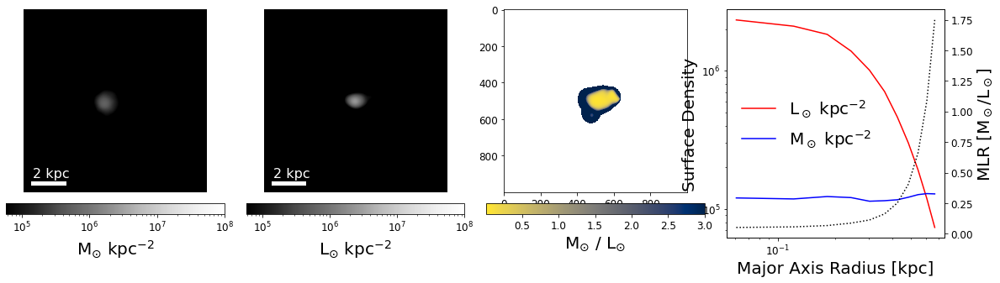

/var/folders/bm/n50953kd0yj8vwl7qjb3thz80000gn/T/ipykernel_10873/1370234851.py:87: RuntimeWarning: divide by zero encountered in true_divide
  Mass_to_Light_ratio = (mass_image/band_image_smoothed)


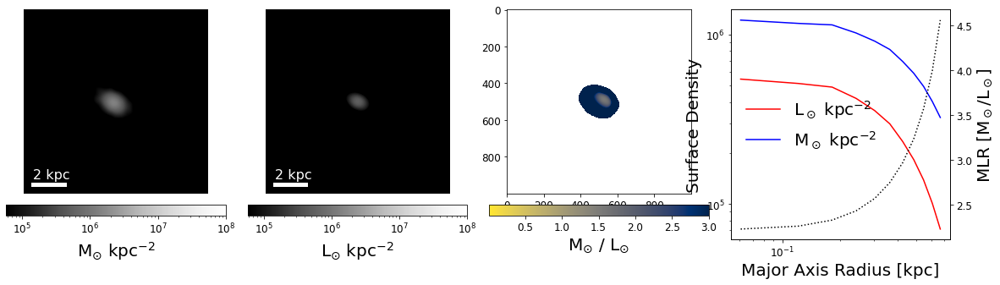

/var/folders/bm/n50953kd0yj8vwl7qjb3thz80000gn/T/ipykernel_10873/1370234851.py:87: RuntimeWarning: divide by zero encountered in true_divide
  Mass_to_Light_ratio = (mass_image/band_image_smoothed)
/Users/courtneyklein/Research/packages/my_tools/sersic_tools.py:38: RuntimeWarning: invalid value encountered in power
  return amplitude * np.exp ( -bn*( (r/r_eff)**(1/n) -1 ) )


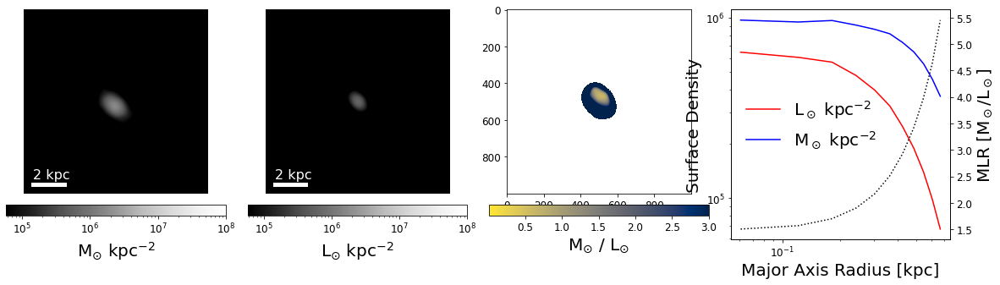

/var/folders/bm/n50953kd0yj8vwl7qjb3thz80000gn/T/ipykernel_10873/1370234851.py:87: RuntimeWarning: divide by zero encountered in true_divide
  Mass_to_Light_ratio = (mass_image/band_image_smoothed)


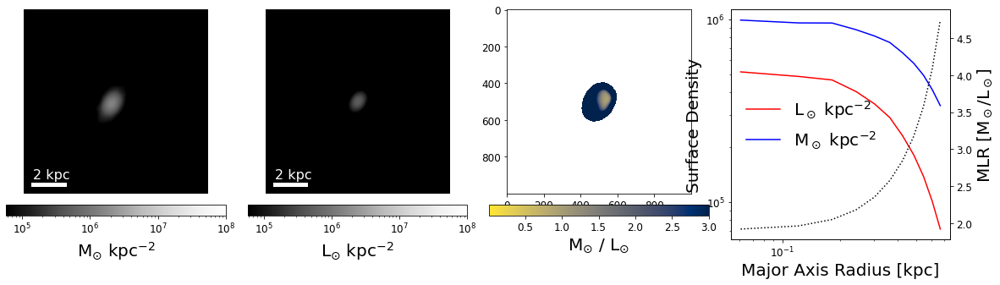

/var/folders/bm/n50953kd0yj8vwl7qjb3thz80000gn/T/ipykernel_10873/1370234851.py:87: RuntimeWarning: divide by zero encountered in true_divide
  Mass_to_Light_ratio = (mass_image/band_image_smoothed)


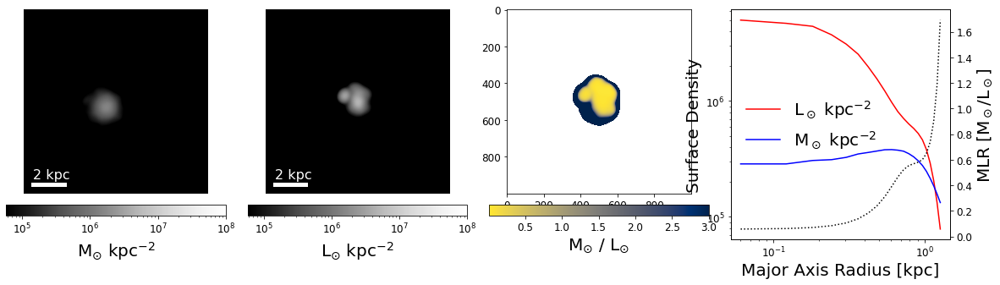

/var/folders/bm/n50953kd0yj8vwl7qjb3thz80000gn/T/ipykernel_10873/1370234851.py:87: RuntimeWarning: divide by zero encountered in true_divide
  Mass_to_Light_ratio = (mass_image/band_image_smoothed)


IndexError: boolean index did not match indexed array along dimension 0; dimension is 99 but corresponding boolean dimension is 98

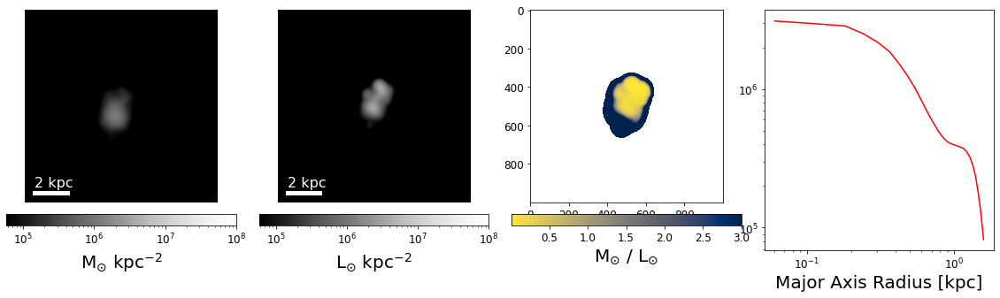

In [7]:
# four plot series

# go through mass files

for file_index in range(len(mass_mocks)):
    # mass image
    mass_file = mass_mocks[file_index].split("/")[-1]
    mass_params = mass_file.split('_')
    sim = mass_params[0]+'_'+mass_params[1]
    view = mass_params[3]
    FOV = int(mass_params[4][3:])
    sml = int(mass_params[6][:-4])
    pixel = 1000

    # band image
    band_file = band_mocks[file_index].split("/")[-1]
    band_params = band_file.split('_')
    band_sim = band_params[0]+'_'+band_params[1]
    band_view = band_params[3]

    #Check we are looking at the same images
    if (sim != band_sim) or (view != band_view):
        print('Not a matched file')
        print(sim,band_sim)
        print(view,band_view)
        print(mass_file)
        print(band_file)
    
    band_image = np.load(band_mocks[file_index])[1]
    mass_image = np.load(mass_mocks[file_index])
    
    
    kpctopix = pixel / (FOV*2)
    pixtokpc = kpctopix**-1
    
    
    fig, axs = plt.subplots(1,4,figsize=(20, 5))
    plt.subplots_adjust(wspace=0.1, hspace=0)

    #...........Mass Image...........
    plt.subplots_adjust(wspace=0.1, hspace=0)

    mass_image[mass_image<10] = 1
    Mass_image = axs[0].imshow(mass_image, norm=colors.LogNorm(vmin=57650, vmax=1e8),cmap='Greys_r') #57650
    
    cb = fig.colorbar(Mass_image, ax=axs[0],  orientation="horizontal", pad=0.05)
    cb.set_label(r'M$_{\odot}$ kpc$^{-2}$')
    
    
    #Create scale bar
    scale_kpc = FOV / 4
    scale_kpc = int(np.ceil(scale_kpc))
    pixel_bar = scale_kpc * 500 / FOV
    pixel_bar = int(np.ceil(pixel_bar))

    #add scale bar
    axs[0].plot([50,50 + pixel_bar],[950,950],  c='w', linewidth='5')
    axs[0].text(50, 920, f'{scale_kpc:.0f} kpc',color='w', fontsize=16)
    axs[0].axis('equal')
    axs[0].axis('off')
    
    #...........Band Image...........
    plt.subplots_adjust(wspace=0.1, hspace=0)
    
    band_image[band_image<57650] = 1
    band_image_smoothed = gaussian_filter(band_image, sigma = sml )

    Band_image = axs[1].imshow(band_image_smoothed ,norm=colors.LogNorm(vmin=57650, vmax=1e8),
                          cmap='Greys_r')
    
    cb = fig.colorbar(Band_image, ax=axs[1],  orientation="horizontal", pad=0.05)
    cb.set_label(r'L$_{\odot}$ kpc$^{-2}$')

    #add scale bar 
    axs[1].plot([50,50 + pixel_bar],[950,950],  c='w', linewidth='5')
    axs[1].text(50, 920, f'{scale_kpc:.0f} kpc',color='w', fontsize=16)
    axs[1].axis('equal')
    axs[1].axis('off')  
    
    # ...........M/L Image............
    #-----Mass-to-Light-Ratio------
    plt.subplots_adjust(wspace=0.1, hspace=0)

    band_image_smoothed[band_image_smoothed<10] = 0
    mass_image[mass_image<10] = -1

    Mass_to_Light_ratio = (mass_image/band_image_smoothed)
    MLR = axs[2].imshow(Mass_to_Light_ratio, cmap='cividis_r',norm=colors.Normalize(vmin=.01, vmax=3))

    
    cb = fig.colorbar(MLR, ax=axs[2], orientation="horizontal", pad=0.05)
    cb.set_label(r'M$_{\odot}$ / L$_{\odot}$')

    
    
    
    #-----M/L ratio plot
    plt.subplots_adjust(wspace=0.1, hspace=0)
    
    mass_image[mass_image < 57650] = 1
    band_image_smoothed[band_image_smoothed < 10] = 1

    r_mass,sb_mass = measure_surfbright(mass_image, FOV=FOV, nmeasure=100,sb_lim=0)
    popt_mass,std_mass= fit_sersic(r_mass, sb_mass)

    r_light,sb_light = measure_surfbright(band_image_smoothed, FOV=FOV, nmeasure=100,sb_lim=0)
    popt_light,std_light = fit_sersic(r_light, sb_light)

    
    # find plot limits based on sb = 57650, or 5e4

    mask = sb_light > 5e4
    
    axs[3].loglog(r_light[mask], sb_light[mask],label='L$_\odot$ kpc$^{-2}$',c='red')
    axs[3].set_xlabel("Major Axis Radius [kpc]")

    axs[3].loglog(r_mass[mask],  sb_mass[mask] ,label='M$_\odot$ kpc$^{-2}$',c='blue')
    axs[3].set_ylabel("Surface Density")
    axs[3].set_title('')
    plt.legend(loc=6,frameon=False)

    #ax1.set_ylim(5e4,1e8)
    #ax1.set_xlim(4e-1,1.3e1)

    ax2 = axs[3].twinx() 
    ax2.plot(r_mass[mask], sb_mass[mask]/sb_light[mask], label='MtoL', c='k', linestyle=':')
    ax2.set_ylabel("MLR [M$_\odot$/L$_\odot$]")
    #ax2.set_ylim(0,5)
    

    plt.show()
    


In [206]:
measure_surfbright?

/var/folders/bm/n50953kd0yj8vwl7qjb3thz80000gn/T/ipykernel_1084/2500609135.py:88: RuntimeWarning: divide by zero encountered in true_divide
  Mass_to_Light_ratio = (mass_image/band_image_smoothed)


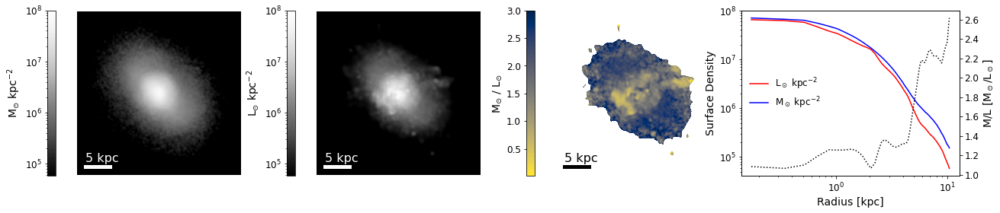

In [40]:
# four plot series

# go through mass files
file_index = 42

# mass image
mass_file = mass_mocks[file_index].split("/")[-1]
mass_params = mass_file.split('_')
sim = mass_params[0]+'_'+mass_params[1]
view = mass_params[3]
FOV = int(mass_params[4][3:])
sml = int(mass_params[6][:-4])
pixel = 1000

# band image
band_file = band_mocks[file_index].split("/")[-1]
band_params = band_file.split('_')
band_sim = band_params[0]+'_'+band_params[1]
band_view = band_params[3]

#Check we are looking at the same images
if (sim != band_sim) or (view != band_view):
    print('Not a matched file')
    print(sim,band_sim)
    print(view,band_view)
    print(mass_file)
    print(band_file)

band_image = np.load(band_mocks[file_index])[1]
mass_image = np.load(mass_mocks[file_index])


kpctopix = pixel / (FOV*2)
pixtokpc = kpctopix**-1


fig, axs = plt.subplots(1,4,figsize=(22, 4))
plt.subplots_adjust(wspace=0.1, hspace=0)

#...........Mass Image...........
plt.subplots_adjust(wspace=0.1, hspace=0)

mass_image[mass_image<10] = 1 #this ensures the empty cells are shown
Mass_image = axs[0].imshow(mass_image, norm=colors.LogNorm(vmin=57650, vmax=1e8),cmap='Greys_r') #57650

cb = fig.colorbar(Mass_image, ax=axs[0],  orientation="vertical",location='left')
cb.set_label(r'M$_{\odot}$ kpc$^{-2}$')


#Create scale bar
scale_kpc = FOV / 4
scale_kpc = int(np.ceil(scale_kpc))
pixel_bar = scale_kpc * 500 / FOV
pixel_bar = int(np.ceil(pixel_bar))

#add scale bar
axs[0].plot([50,50 + pixel_bar],[950,950],  c='w', linewidth='5')
axs[0].text(50, 920, f'{scale_kpc:.0f} kpc',color='w', fontsize=16)
axs[0].axis('equal')
axs[0].axis('off')

#...........Band Image...........
plt.subplots_adjust(wspace=0.1, hspace=0)

band_image[band_image<10] = 1 #this ensures the empty cells are shown
band_image_smoothed = gaussian_filter(band_image, sigma = sml )

Band_image = axs[1].imshow(band_image_smoothed ,norm=colors.LogNorm(vmin=57650, vmax=1e8),
                      cmap='Greys_r')

cb = fig.colorbar(Band_image, ax=axs[1],  orientation="vertical",location='left')
cb.set_label(r'L$_{\odot}$ kpc$^{-2}$')

#add scale bar 
axs[1].plot([50,50 + pixel_bar],[950,950],  c='w', linewidth='5')
axs[1].text(50, 920, f'{scale_kpc:.0f} kpc',color='w', fontsize=16)
axs[1].axis('equal')
axs[1].axis('off')  

# ...........M/L Image............
#-----Mass-to-Light-Ratio------
plt.subplots_adjust(wspace=0.1, hspace=0)

#this makes it so that the M/L is not shown if one of the images has no values
band_image_smoothed[band_image_smoothed<57650] = 0 
mass_image[mass_image<57650] = -1

Mass_to_Light_ratio = (mass_image/band_image_smoothed)
MLR = axs[2].imshow(Mass_to_Light_ratio, cmap='cividis_r',norm=colors.Normalize(vmin=.01, vmax=3))


cb = fig.colorbar(MLR, ax=axs[2], orientation="vertical",location='left')
cb.set_label(r'M$_{\odot}$ / L$_{\odot}$')


#-----Labels M/L------
axs[2].plot([50,50 + pixel_bar],[950,950],  c='k', linewidth='5')
axs[2].text(50, 920, f'{scale_kpc:.0f} kpc',color='k', fontsize=16)
axs[2].axis('equal')
axs[2].axis('off')


#-----M/L ratio plot
plt.subplots_adjust(wspace=0.1, hspace=0)

mass_image[mass_image < 57650] = 100
band_image_smoothed[band_image_smoothed < 57650] = 100

r_mass,sb_mass = measure_surfbright(mass_image, FOV=FOV, nmeasure=100,sb_lim=0)
popt_mass,std_mass= fit_sersic(r_mass, sb_mass)

r_light,sb_light = measure_surfbright(band_image_smoothed, FOV=FOV, nmeasure=100,sb_lim=0)
popt_light,std_light = fit_sersic(r_light, sb_light)

# find plot limits based on sb = 57650, or 5e4

mask = sb_light > 57650

axs[3].loglog(r_light[mask], sb_light[mask],label='L$_\odot$ kpc$^{-2}$',c='red')
axs[3].set_xlabel("Radius [kpc]")

axs[3].loglog(r_mass[mask],  sb_mass[mask] ,label='M$_\odot$ kpc$^{-2}$',c='blue')
axs[3].set_ylabel("Surface Density")
axs[3].set_title('')
plt.legend(loc=6,frameon=False)

#ax1.set_ylim(5e4,1e8)
#ax1.set_xlim(4e-1,1.3e1)

ax2 = axs[3].twinx() 
ax2.plot(r_mass[mask], sb_mass[mask]/sb_light[mask], label='MtoL', c='k', linestyle=':')
ax2.set_ylabel("M/L [M$_\odot$/L$_\odot$]")
#ax2.set_ylim(0,5)

#plt.savefig('/Users/courtneyklein/Research/DwarfGalaxy_MassRadius/Figures/masslightandratio_4block_m11c.pdf', bbox_inches='tight', dpi=300)

plt.show()



In [180]:
# load all images

image_files_list = glob.glob('../mock_image_files_round2/*.npy')


In [113]:
data

,sim,FOV,proj,pixel,tot_lum_u,tot_lum_g,tot_lum_r,r50,m50,r90,m90,r100,m100,r_3d_50,m_3d_50,r_3d_90,m_3d_90,r50_lim,m50_lim,r90_lim,m90_lim,r100_lim,m100_lim,r_3d_50_lim,m_3d_50_lim,r_3d_90_lim,m_3d_90_lim,rvir_015,rvir_015_lim,mvir_015,rvir_10,rvir_10_lim,mvir_10,rvir,rvir_lim,mvir,mbound_vir_halo,r_3d_vir015,m_3d_vir015,r_3d_vir10,m_3d_vir10,mvir_halo,Ie_1D,reff_1D,n_1D,sample_n,sample_nlessSBlim_1D,sample_nlessre_1D,r_outer_circ,r_outer_ellip,r_outer_max,Ie_1D_std,reff_1D_std,n_1D_std,Ie_2D,reff_2D,n_2D,x0_2D,y0_2D,ellip_2D,theta_2D,Ie_2D_std,reff_2D_std,n_2D_std,x0_2D_std,y0_2D_std,ellip_2D_std,theta_2D_std,Ie_1D_ellip,reff_1D_ellip,n_1D_ellip,Ie_1D_ellip_std,reff_1D_ellip_std,n_1D_ellip_std,new_pixel,sersic_lum_1Dellip,sersic_lum_1Dcircle,sersic_lum_2D,tot_mag_u,tot_mag_g,tot_mag_r,obs_mass_g,obs_mass_g_sersic
0,m10b_res500,3,xy,1000,3.149110e+06,1.204539e+06,6.689034e+05,0.236215,2.359851e+05,0.667788,4.245811e+05,14.270773,4.719756e+05,0.349845,2.359324e+05,0.932531,4.244896e+05,0.233507,2.330390e+05,0.625410,4.193105e+05,5.279339,4.661921e+05,0.345265,2.321113e+05,0.885183,4.181071e+05,0.814818,0.812143,4.411729e+05,5.432121,5.279339,4.661921e+05,54.321208,14.270773,4.719756e+05,9.060563e+09,0.814178,4.069832e+05,4.999770,4.648137e+05,9.060563e+09,2.449505e+06,0.222618,0.187862,100,81,27,0.596248,0.661590,0.808610,6.846107e+04,0.016833,0.015954,3.740332e+06,0.158063,0.951401,0.237137,-0.068885,1.826353e-01,2.895685,1.778896e+04,0.000490,0.004231,0.000185,0.000155,0.002512,0.007568,2.774345e+06,0.146584,0.164475,6.062622e+04,0.291242,0.012228,268.0,1305786,1107607,1082498,-9.495469,-9.872052,-9.893409,2.166242e+05,2.348324e+05
1,m10b_res500,3,yz,1000,3.148890e+06,1.201734e+06,6.672877e+05,0.304723,2.356667e+05,0.874010,4.245044e+05,46.409061,4.719756e+05,0.349845,2.359324e+05,0.932531,4.244896e+05,0.300704,2.324563e+05,0.828304,4.185837e+05,4.975017,4.651677e+05,0.345265,2.321113e+05,0.885183,4.181071e+05,0.814818,0.814501,4.164895e+05,5.432121,4.975017,4.651677e+05,54.321208,46.409061,4.719756e+05,9.060563e+09,0.814178,4.069832e+05,4.999770,4.648137e+05,9.060563e+09,5.663015e+06,0.139698,0.594589,100,88,21,0.550772,0.576999,0.649124,2.769531e+05,0.004331,0.031502,5.608945e+06,0.139732,0.771942,0.052970,0.020395,9.592509e-02,2.798160,9.950443e+03,0.000163,0.001545,0.000083,0.000077,0.001166,0.006386,5.519332e+06,0.148685,0.621937,1.684221e+05,0.002907,0.019708,216.0,1204829,1074080,1173759,-9.495394,-9.869521,-9.890783,2.160365e+05,2.165929e+05
2,m10b_res500,3,zx,1000,3.173906e+06,1.208519e+06,6.698021e+05,0.289048,2.357400e+05,0.850310,4.246346e+05,45.514264,4.719756e+05,0.349845,2.359324e+05,0.932531,4.244896e+05,0.285622,2.324678e+05,0.758779,4.183666e+05,4.780156,4.651776e+05,0.345265,2.321113e+05,0.885183,4.181071e+05,0.814818,0.810658,4.213099e+05,5.432121,4.780156,4.651776e+05,54.321208,45.514264,4.719756e+05,9.060563e+09,0.814178,4.069832e+05,4.999770,4.648137e+05,9.060563e+09,2.639339e+06,0.065969,0.163511,250,178,17,0.595670,0.627021,0.867379,5.139850e+04,6.822209,0.007202,3.805218e+06,0.153223,0.956109,-0.013153,-0.239321,1.333295e-01,1.621786,1.742570e+04,0.000458,0.004078,0.000150,0.000173,0.002558,0.010278,2.799068e+06,0.061736,0.163506,4.400857e+04,4.067436,0.002455,288.0,1212090,1063888,1038683,-9.503985,-9.875633,-9.894866,2.154629e+05,2.160997e+05
3,m10c_res500,3,xy,1000,1.269095e+06,8.320198e+05,5.549361e+05,0.241338,2.893847e+05,0.725035,5.212976e+05,13.042940,5.793567e+05,0.349568,2.893690e+05,1.073333,5.213609e+05,0.241284,2.890193e+05,0.721698,5.202140e+05,5.329707,5.783448e+05,0.346277,2.865299e+05,1.040137,5.158477e+05,0.803589,0.800305,5.255868e+05,5.357262,5.329707,5.783448e+05,53.572620,13.042940,5.793567e+05,8.690141e+09,0.798282,4.905529e+05,4.440888,5.733660e+05,8.694366e+09,2.655395e+06,0.148385,0.698861,100,87,15,0.625920,0.812761,0.924866,3.133577e+05,0.011460,0.077844,1.686288e+06,0.243635,1.147652,0.026351,0.007586,4.098384e-01,2.317822,4.920568e+03,0.000462,0.002642,0.000101,0.000105

## Light in r50, r90, r100


Note that columns: data['r100_lim'] = data['rvir_10_lim']\
To measure the galaxy assuming every thing outside 10% rvir is excluded use: r50_lim, m50_lim, r90_lim, m90_lim, r100_lim, m100_lim

In [156]:

mass_light_dist_dict = {'sim':{},
                        'proj':{},
                        'r50_lim':{},
                        'm50_lim':{},
                        'lum_in_r50_lim':{},
                        'r90_lim':{},
                        'm90_lim':{},
                        'lum_in_r50_lim':{},
                        'r100_lim':{},
                        'm100_lim':{},
                        'lum_in_r50_lim':{}
                       }

In [166]:
mass_light_dist = pd.DataFrame(columns=['sim',
                                        'proj',
                                        'r50_lim',
                                        'm50_lim',
                                        'lum_in_r50_lim',
                                        'r90_lim',
                                        'm90_lim',
                                        'lum_in_r90_lim',
                                        'r100_lim',
                                        'm100_lim',
                                        'lum_in_r100_lim'
                                       ]
                              )

In [167]:
mass_light_dist

,sim,proj,r50_lim,m50_lim,lum_in_r50_lim,r90_lim,m90_lim,lum_in_r90_lim,r100_lim,m100_lim,lum_in_r100_lim


In [168]:
for file in image_files_list:
    image_file = file.split("/")[-1]
    image_params = image_file.split('_')
    image_type = image_params[2]
    FOV = int(image_params[-2][3:])
    view = image_params[-3]
    sim = image_params[0]+'_'+image_params[1]
    pixel = 1000
    
    if image_type == 'ugrband':
        
        sim_data = data.loc[(data['sim'] == sim) & (data['proj'] == view)]
        
        band_image = np.load(file)[1]
        r_light, cum_light = measure_surfbright(band_image, FOV=FOV, nmeasure=100,sb_lim=0,return_type='cum_lum')
        
        r_l,light = radius_of_param_limit(r_light, cum_light, cumulative=True,
                                          limits = [sim_data['r50_lim'].values[0], 
                                                    sim_data['r90_lim'].values[0], 
                                                    sim_data['r100_lim'].values[0]], 
                                          limit_type='radius')
        
        
        save_data = {'sim':sim,
                     'proj':view,
                     'r50_lim':sim_data['r50_lim'].values[0],
                     'm50_lim':sim_data['m50_lim'].values[0],
                     'lum_in_r50_lim':light[0],
                     'r90_lim':sim_data['r90_lim'].values[0],
                     'm90_lim':sim_data['m90_lim'].values[0],
                     'lum_in_r90_lim':light[1],
                     'r100_lim':sim_data['r100_lim'].values[0],
                     'm100_lim':sim_data['m100_lim'].values[0],
                     'lum_in_r100_lim':light[2],
                    }
        
        mass_light_dist = mass_light_dist.append(save_data,ignore_index=True)


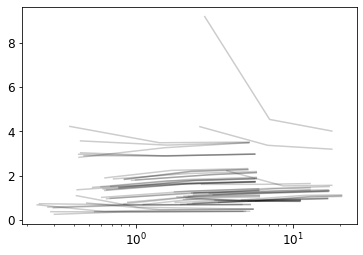

In [171]:
for index, row in mass_light_dist.iterrows():
    plt.semilogx([row['r50_lim'],row['r90_lim'],row['r100_lim']],
             [row['m50_lim']/row['lum_in_r50_lim'],
              row['m90_lim']/row['lum_in_r90_lim'],
              row['m100_lim']/row['lum_in_r100_lim']], alpha=.2, color='k')
    
    
plt.title('M/L enlosed')
plt.ylabel('M/L')
plt.xlabel('Radius')

Text(0.5, 0, 'Fraction mass enclosed')

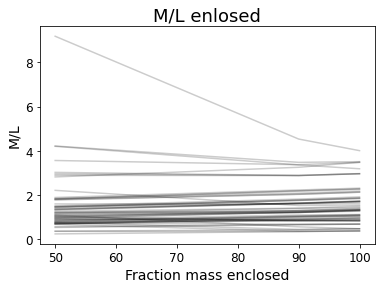

In [178]:
for index, row in mass_light_dist.iterrows():
    plt.plot([50,90,100],
             [row['m50_lim']/row['lum_in_r50_lim'],
              row['m90_lim']/row['lum_in_r90_lim'],
              row['m100_lim']/row['lum_in_r100_lim']], alpha=.2, color='k')
    
plt.title('M/L enlosed')
plt.ylabel('M/L')
plt.xlabel('Fraction mass enclosed')

Text(0.5, 0, 'Radius')

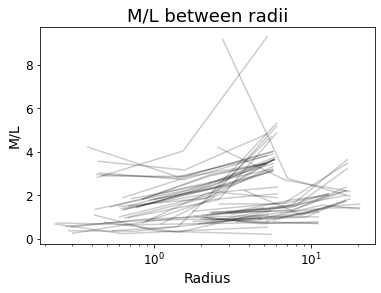

In [179]:
for index, row in mass_light_dist.iterrows():
    plt.semilogx([row['r50_lim'],row['r90_lim'],row['r100_lim']],
                 [row['m50_lim']/row['lum_in_r50_lim'],
                  (row['m90_lim']-row['m50_lim'])/(row['lum_in_r90_lim']-row['lum_in_r50_lim']),
                  (row['m100_lim']-row['m90_lim'])/(row['lum_in_r100_lim']-row['lum_in_r90_lim'])], 
                 alpha=.2, color='k')
    
plt.title('M/L between radii')
plt.ylabel('M/L')
plt.xlabel('Radius')

Text(0, 0.5, 'Fraction mass enclosed')

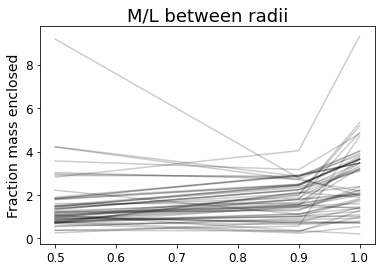

In [177]:
for index, row in mass_light_dist.iterrows():
    plt.plot([.5,.9,1],
                 [row['m50_lim']/row['lum_in_r50_lim'],
                  (row['m90_lim']-row['m50_lim'])/(row['lum_in_r90_lim']-row['lum_in_r50_lim']),
                  (row['m100_lim']-row['m90_lim'])/(row['lum_in_r100_lim']-row['lum_in_r90_lim'])], 
                 alpha=.2, color='k')
plt.title('M/L between radii')
plt.ylabel('M/L')
plt.xlabel('Fraction mass enclosed')

../mock_image_files_round2/m10c_res500_ugrband_zx_FOV3_p1000.npy


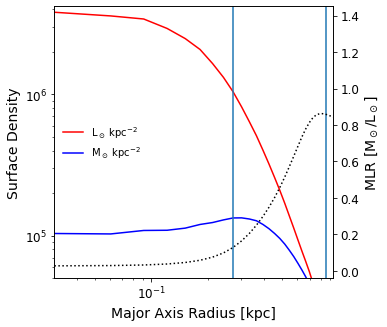

../mock_image_files_round2/m10g_res500_ugrband_zx_FOV4_p1000.npy


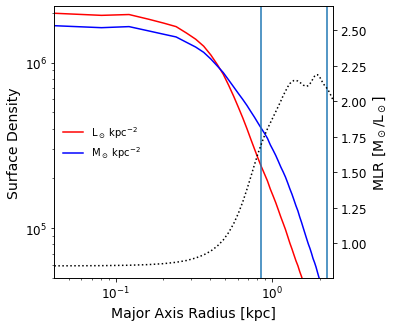

../mock_image_files_round2/m10m_res500_ugrband_xy_FOV5_p1000.npy


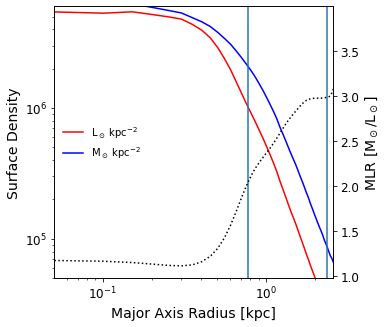

../mock_image_files_round2/m10j_res500_ugrband_yz_FOV5_p1000.npy


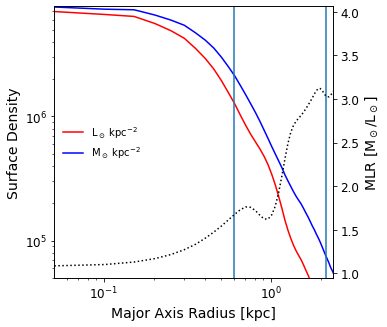

../mock_image_files_round2/m11b_res2100_ugrband_zx_FOV11_p1000.npy


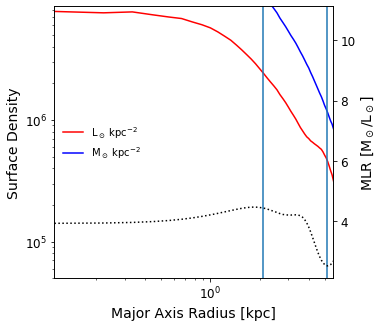

../mock_image_files_round2/m11d_res7100_ugrband_zx_FOV40_p1000.npy


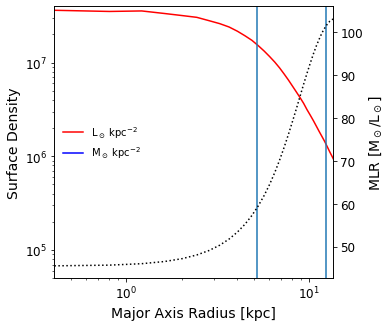

../mock_image_files_round2/m11b_res2100_ugrband_xy_FOV11_p1000.npy


KeyboardInterrupt: 

In [190]:
for file in image_files_list:
    image_file = file.split("/")[-1]
    image_params = image_file.split('_')
    image_type = image_params[2]
    FOV = int(image_params[-2][3:])
    view = image_params[-3]
    sim = image_params[0]+'_'+image_params[1]
    pixel = 1000
    
    if image_type == 'ugrband':
        print(file)
        if sim in ['m10b_res500', 'm10c_res500', 'm10d_res500', 
                   'm10e_res500', 'm10f_res500', 'm10g_res500',
                   'm10h_res500','m10i_res500', 'm10j_res500',
                   'm10k_res500','m10l_res500','m10m_res500','m10q_res250']:
            snap_num = 184
            filetype = 'ascii'
            halo_path = '/data17/grenache/aalazar/FIRE/GVB/'+str(sim)+'/halo/rockstar_dm/catalog/'
        
        elif sim in ['m11a_res2100','m11b_res2100','m11c_res2100', 
                     'm11d_res7100', 'm11e_res7100','m11h_res7100',
                     'm11i_res7100','m11q_res7100','m11v_res7100']:
            snap_num = 600
            filetype = 'hdf5'
            halo_path = '/data17/grenache/aalazar/FIRE/GVB/'+str(sim)+'/halo/rockstar_dm/hdf5/'
        
        halo = load_halo(halo_path, snap_num, host=True, filetype=filetype)

        sim_path =  '/data17/grenache/aalazar/FIRE/GVB/'+str(sim)+'/output/hdf5/snapdir_'+str(snap_num)+'/'
        star_snapdict, gas_snapdict = load_sim(sim_path,snap_num)

        
        sim_data = data.loc[(data['sim'] == sim) & (data['proj'] == view)]
        ml_data = mass_light_dist.loc[(mass_light_dist['sim'] == sim) & (mass_light_dist['proj'] == view)]

                
        star_snapdict, gas_snapdict, halo = mask_sim_to_halo(star_snapdict=star_snapdict,
                                                             gas_snapdict=gas_snapdict, 
                                                             host_halo=halo, 
                                                             orient=False, #if true, then orients toward disk
                                                             lim = True, #Masks particles beyond limvalue  
                                                             limvalue = FOV #limit radius in kpc
                                                            )

        
        band_image = np.load(file)[1]
        
        if view == 'xy':
            Mass = plt.hist2d(star_snapdict['Coordinates'][:,1],star_snapdict['Coordinates'][:,0],
                       weights=star_snapdict['Masses'], bins=pixels)
        elif view == 'yz':
            Mass = plt.hist2d(star_snapdict['Coordinates'][:,2],star_snapdict['Coordinates'][:,1],
                       weights=star_snapdict['Masses'], bins=pixels)   
        elif view == 'zx':
            Mass = plt.hist2d(star_snapdict['Coordinates'][:,0],star_snapdict['Coordinates'][:,2],
                       weights=star_snapdict['Masses'], bins=pixels)
        plt.close()
        
        #-----Mass Density------
        # Convert pixel values Mass/Pix2 to Mass/Kpc2
        SigmaMass = Mass[0][::-1] * (pixtokpc)**-2 
        # Smooth based on the median smoothing length of star particle
        SigmaMass_smoothed = gaussian_filter(SigmaMass, sigma = np.median(star_snapdict['hsml'])*kpctopix )
        # Mask so all pixels have values
        #SigmaMass_smoothed[SigmaMass_smoothed<57650] = 1

        r_mass,sb_mass = measure_surfbright(SigmaMass_smoothed, FOV=FOV, nmeasure=100,sb_lim=0)

        
        #----Surface Brightness------
        gband_smoothed = gaussian_filter(band_image, sigma = np.median(star_snapdict['hsml'])*kpctopix )
    
        r_light,sb_light = measure_surfbright(gband_smoothed, FOV=FOV, nmeasure=100,sb_lim=0)



        fig, ax1 = plt.subplots(figsize=(5, 5))

        ax1.loglog(r_light, sb_light,label='L$_\odot$ kpc$^{-2}$',c='red')
        ax1.set_xlabel("Major Axis Radius [kpc]")

        ax1.loglog(r_mass,  sb_mass ,label='M$_\odot$ kpc$^{-2}$',c='blue')
        ax1.set_ylabel("Surface Density")
        plt.legend(loc=6,frameon=False)

        plt.axvline(x=ml_data['r50_lim'].values[0])
        plt.axvline(x=ml_data['r90_lim'].values[0])


        
        ax1.set_ylim(5e4,np.max(sb_light)*1.1)
        ax1.set_xlim(np.min(r_light),ml_data['r90_lim'].values[0]*1.1)

        ax2 = ax1.twinx() 
        ax2.plot(r_mass, sb_mass/sb_light, label='M/L', c='k', linestyle=':')
        ax2.set_ylabel("MLR [M$_\odot$/L$_\odot$]")

        plt.show()
        
        
        
        
        

In [16]:
r_m50, r_m90, r_m100 = [sim_data['r50_lim'].values[0],
                        sim_data['r90_lim'].values[0],
                        sim_data['r100_lim'].values[0]]
m50, m90, m100 = [sim_data['m50_lim'].values[0],
                  sim_data['m90_lim'].values[0],
                  sim_data['m100_lim'].values[0]]


In [17]:
# open image
# start with circular symmetry

r_light, cum_light = measure_surfbright(gband, FOV=FOV, nmeasure=100,sb_lim=0,return_type='cum_lum')


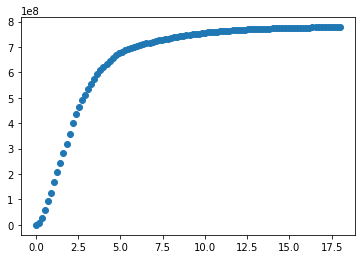

In [18]:
plt.scatter(r_light, cum_light)

In [22]:
r_l,light = radius_of_param_limit(r_light, cum_light, cumulative=True,
                                  limits = [r_m50, r_m90, r_m100], 
                                  limit_type='radius')



In [23]:
light

[400348256.0, 725530816.0, 776929920.0]

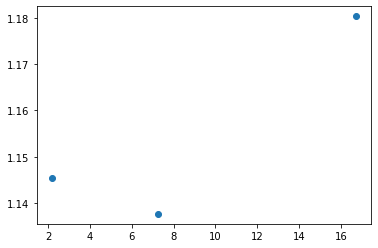

In [24]:
plt.scatter(r_l,[m50/light[0], m90/light[1], m100/light[2]] )

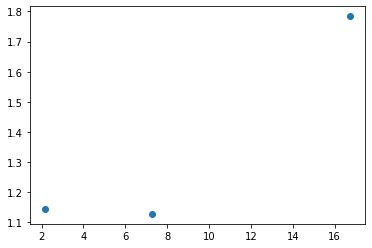

In [25]:
plt.scatter(r_l,[m50/light[0], (m90-m50)/(light[1]-light[0]), (m100-m90)/(light[2]-light[1])] )

In [ ]:
r_m50, r_m90, r_m100

In [169]:
np.log10(light)

array([ 9.36047388, 10.30405473, 10.77650801])

In [170]:
np.log10([m50,m90,m100])

array([8.66137749, 8.91665018, 8.96240778])

Create mock mass images

In [77]:
params2D = [m11c['Ie_2D'].values[0],
            m11c['reff_2D'].values[0],
            m11c['n_2D'].values[0],
            m11c['x0_2D'].values[0],
            m11c['y0_2D'].values[0],
            m11c['ellip_2D'].values[0],
            m11c['theta_2D'].values[0]
           ]
params2D

[15395072.20532002,
 2.1840731033133336,
 1.00312813126167,
 0.1258730531469459,
 0.2504073508713931,
 0.2846980552326728,
 0.7713962351498225]

In [78]:
r_mass,sb_mass = measure_surfbright(SigmaMass, FOV=FOV, nmeasure=50,sb_lim=0,
                          major_axis=params2D[1], ellip=params2D[5], theta=params2D[6])
popt_mass,std_mass= fit_sersic(r_mass, sb_mass)

r_light,sb_light = measure_surfbright(gband, FOV=FOV, nmeasure=50,sb_lim=0,
                          major_axis=params2D[1], ellip=params2D[5], theta=params2D[6])
popt_light,std_light = fit_sersic(r_light, sb_light)

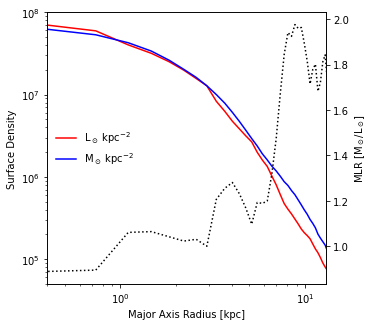

In [104]:
r_mass,sb_mass = measure_surfbright(SigmaMass, FOV=FOV, nmeasure=50,sb_lim=0,
                          major_axis=params2D[1], ellip=params2D[5], theta=params2D[6])
popt_mass,std_mass= fit_sersic(r_mass, sb_mass)

r_light,sb_light = measure_surfbright(gband, FOV=FOV, nmeasure=50,sb_lim=0,
                          major_axis=params2D[1], ellip=params2D[5], theta=params2D[6])
popt_light,std_light = fit_sersic(r_light, sb_light)



fig, ax1 = plt.subplots(figsize=(5, 5))

ax1.loglog(r_light, sb_light,label='L$_\odot$ kpc$^{-2}$',c='red')
ax1.set_xlabel("Major Axis Radius [kpc]")

ax1.loglog(r_mass,  sb_mass ,label='M$_\odot$ kpc$^{-2}$',c='blue')
ax1.set_ylabel("Surface Density")
plt.legend(loc=6,frameon=False)

ax1.set_ylim(5e4,1e8)
ax1.set_xlim(4e-1,1.3e1)

ax2 = ax1.twinx() 
ax2.plot(r_mass, sb_mass/sb_light, label='MtoL', c='k', linestyle=':')
ax2.set_ylabel("MLR [M$_\odot$/L$_\odot$]")


plt.show()

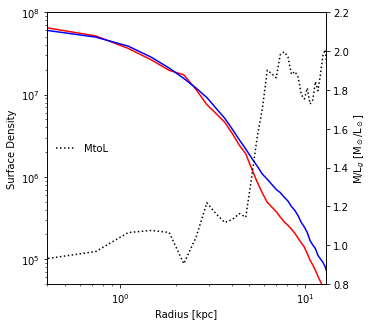

In [101]:
r_mass,sb_mass = measure_surfbright(SigmaMass, FOV=FOV, nmeasure=50,sb_lim=0)
popt_mass,std_mass= fit_sersic(r_mass, sb_mass)

r_light,sb_light = measure_surfbright(gband, FOV=FOV, nmeasure=50,sb_lim=0)
popt_light,std_light = fit_sersic(r_light, sb_light)


fig, ax1 = plt.subplots(figsize=(5, 5))

ax1.loglog(r_light, sb_light,label='L$_\odot$ kpc$^{-2}$',c='red')
ax1.set_xlabel("Radius [kpc]")

ax1.loglog(r_mass,  sb_mass ,label='M$_\odot$ kpc$^{-2}$',c='blue')
ax1.set_ylabel("Surface Density")

ax1.set_ylim(5e4,1e8)
ax1.set_xlim(4e-1,1.3e1)


ax2 = ax1.twinx() 
ax2.plot(r_mass,  sb_mass/sb_light ,label='MtoL',c='k',linestyle=':')
ax2.set_ylabel("M/L$_g$ [M$_\odot$/L$_\odot$]")
ax2.set_ylim(.8,2.2)
plt.legend(loc=6,frameon=False)
plt.show()

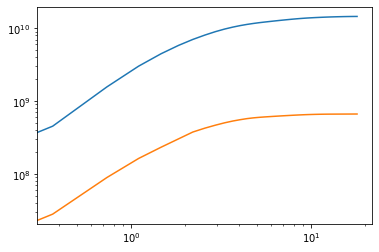

In [26]:
plt.loglog(r_mass,sb_mass)
plt.loglog(r_light,sb_light)

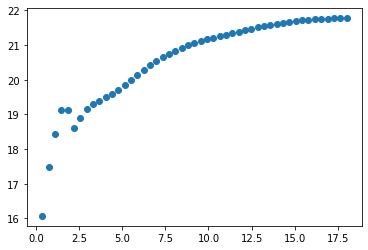

In [30]:
plt.scatter(r_mass[1:],sb_mass[1:]/sb_light[1:])

In [34]:
m11c

,sim,FOV,proj,pixel,tot_lum_u,tot_lum_g,tot_lum_r,r50,m50,r90,m90,r100,m100,r_3d_50,m_3d_50,r_3d_90,m_3d_90,r50_lim,m50_lim,r90_lim,m90_lim,r100_lim,m100_lim,r_3d_50_lim,m_3d_50_lim,r_3d_90_lim,m_3d_90_lim,rvir_015,rvir_015_lim,mvir_015,rvir_10,rvir_10_lim,mvir_10,rvir,rvir_lim,mvir,mbound_vir_halo,r_3d_vir015,m_3d_vir015,r_3d_vir10,m_3d_vir10,mvir_halo,Ie_1D,reff_1D,n_1D,sample_n,sample_nlessSBlim_1D,sample_nlessre_1D,r_outer_circ,r_outer_ellip,r_outer_max,Ie_1D_std,reff_1D_std,n_1D_std,Ie_2D,reff_2D,n_2D,x0_2D,y0_2D,ellip_2D,theta_2D,Ie_2D_std,reff_2D_std,n_2D_std,x0_2D_std,y0_2D_std,ellip_2D_std,theta_2D_std,Ie_1D_ellip,reff_1D_ellip,n_1D_ellip,Ie_1D_ellip_std,reff_1D_ellip_std,n_1D_ellip_std,new_pixel,sersic_lum_1Dellip,sersic_lum_1Dcircle,sersic_lum_2D,tot_mag_u,tot_mag_g,tot_mag_r,obs_mass_g,obs_mass_g_sersic
42,m11c_res2100,18,xy,1000,934345920.0,673019648.0,540359680.0,2.361355,4.776192e+08,9.059113,8.597154e+08,166.201093,9.552407e+08,3.095169,4.776193e+08,11.450474,8.597154e+08,2.259766,4.585403e+08,7.443665,8.253728e+08,16.737875,9.170812e+08,2.924495,4.500380e+08,8.74513,8.100684e+08,2.510726,2.510704,5.040888e+08,16.738176,16.737875,9.170812e+08,167.38176,166.201093,9.552407e+08,1.461396e+11,2.510721,3.753671e+08,16.73812,9.000771e+08,1.354786e+11,1.576241e+07,1.926391,0.921762,150,118,18,10.439443,12.318543,15.554771,676790.84635,0.057111,0.029111,1.539507e+07,2.184073,1.003128,0.125873,0.250407,0.284698,0.771396,30812.082062,0.002847,0.00179,0.00087,0.000862,0.000897,0.001837,1.814610e+07,2.086577,0.835498,613632.623232,0.048013,0.022559,864.0,876196535,675601256,876825429,-15.676269,-16.740069,-17.161707,6.208884e+08,8.083274e+08


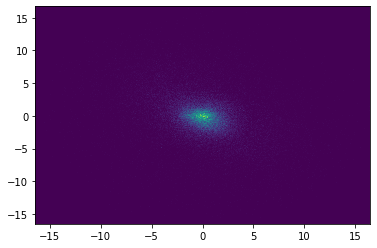

In [28]:
Mass = plt.hist2d(star_snapdict['Coordinates'][:,1],star_snapdict['Coordinates'][:,0],
                       weights=star_snapdict['Masses'], bins=pixels)

In [38]:
np.sum(star_snapdict['Masses'])

900077065.1488048

In [39]:
np.sum(Mass[0][::-1])

900077065.148805

In [40]:
pix_to_kpc = pixels / (FOV*2)

In [41]:
SigmaMass = Mass[0][::-1] * (pix_to_kpc)**2 #Convert pixel values Mass/Pix2 to Mass/Kpc2


In [42]:
np.sum(SigmaMass)*(FOV*2/pixels)**2

900077065.1488061

In [35]:
np.sum(Mass[0][::-1])

900077065.148805

In [36]:
np.sum(SigmaMass)

11112062532701.31

In [ ]:

SigmaMass = Mass[0][::-1] * (pixels / FOV*2 )**2 #Convert pixel values Mass/Pix2 to Mass/Kpc2
SigmaMass_smoothed = gaussian_filter(SigmaMass, sigma = np.median(star_snapdict['hsml'])*kpctopix )
SigmaMass_smoothed[SigmaMass_smoothed<1e6] = 1e6

Mass_image = axs[0].imshow(SigmaMass_smoothed+1 ,norm=colors.LogNorm(vmin=1e6, vmax=1e9),
                           cmap='Greys_r')






In [ ]:

#ax_sersic.set_ylim(60000, np.max(sb_light)*1.1)
#ax_sersic.set_ylabel("'den' [L$_\odot$ kpc$^{-2}$]")
#ax_sersic.set_xlabel(" Radius [kpc]")
#ax_sersic.legend(frameon=False,loc=1)
#ax_sersic.text(r[0], 56000 +  np.log10(np.max(sb_light))/10*56000*2,f'R$_e$: {popt[1]:.2f} kpc',color='k')
#ax_sersic.text(r[0], 56000 +  np.log10(np.max(sb_light))/10*56000,f'n:  {popt[2]:.2f}',color='k')
#ax_sersic.get_figure().set_dpi(120)

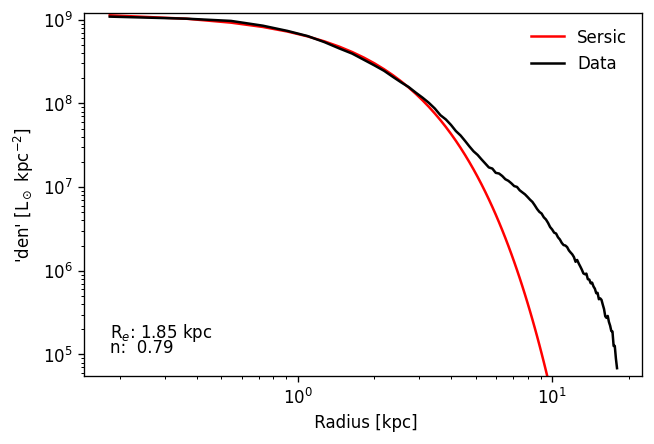

In [57]:
radius,sb = measure_surfbright(SigmaMass, FOV=FOV, nmeasure=100)
popt,std= fit_sersic(radius, sb, ax_sersic=plt.gca())


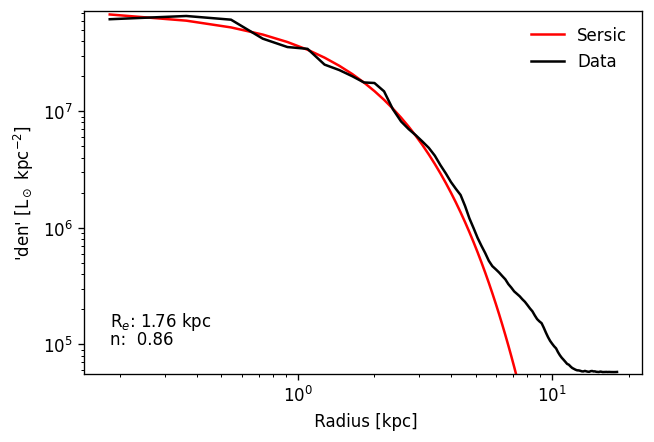

In [56]:
radius,sb = measure_surfbright(gband, FOV=FOV, nmeasure=100)
popt,std= fit_sersic(radius, sb, ax_sersic=plt.gca())


radius,sb = measure_surfbright(SigmaMass, FOV=FOV, nmeasure=100)
popt,std= fit_sersic(radius, sb, ax_sersic=plt.gca())



In [ ]:
nmeasure=m11c['sample_n'].values[0]
FOV = m11c['FOV'].values[0]

params1D_ellip = [m11c['Ie_1D_ellip'].values[0],
                  m11c['reff_1D_ellip'].values[0], 
                  m11c['n_1D_ellip'].values[0]]

params2D = [m11c['Ie_2D'].values[0],
            m11c['reff_2D'].values[0],
            m11c['n_2D'].values[0],
            m11c['x0_2D'].values[0],
            m11c['y0_2D'].values[0],
            m11c['ellip_2D'].values[0],
            m11c['theta_2D'].values[0]
           ]



r,sb = measure_surfbright(band_image, FOV, nmeasure=nmeasure, pixel=pixels, 
                          major_axis=params2D[1], ellip=params2D[5], theta=params2D[6])


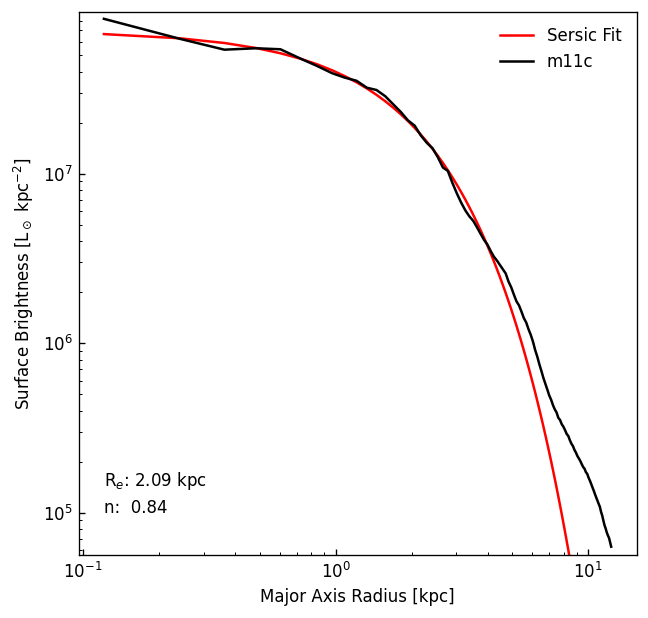

In [50]:


# 1D fit with ellipse
fig = plt.figure(figsize = (6, 6))
ax = plt.gca()

plt.tick_params(axis='both', which='both', direction='in')
ax.loglog(r, sersic(r, *params1D_ellip), label='Sersic Fit',c='red')
ax.loglog(r, sb,label='m11c',c='k')
ax.set_ylim(56000, np.max(sb)*1.1)
ax.set_ylabel("Surface Brightness [L$_\odot$ kpc$^{-2}$]")
ax.set_xlabel("Major Axis Radius [kpc]")

ax.legend(frameon=False,loc=1)
ax.text(r[0], 56000 +  np.log10(np.max(sb))/10*56000*2,f'R$_e$: {params1D_ellip[1]:.2f} kpc',color='black')
ax.text(r[0], 56000 +  np.log10(np.max(sb))/10*56000*1,f'n:  {params1D_ellip[2]:.2f}',color='black')
ax.get_figure().set_dpi(120)

#plt.savefig('../Figures/paper/sersic_ellip_fit_m11c.pdf', bbox_inches='tight', dpi=300)

plt.show()
